# Forecasting organic growth

## Imports

In [1]:
import sys
import pandas as pd
import datetime as dt
import numpy as np
import time

from pytrends.request import TrendReq as UTrendReq
import requests

import matplotlib.pyplot as plt
import seaborn as sns; sns.set(); sns.set_style('whitegrid')

from prophet import Prophet
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor

from tqdm.notebook import tqdm
from IPython.display import display, HTML

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

## HMSM

### Preprocessing 

In [2]:
country = "FR"
brands_name = {"BELGIUM": ["APERICUBE", "BABYBEL", "BOURSIN", "KIRI", "MINI BABYBEL", "VACHE QUI RIT", "MAREDSOUS"],
     "USA": ["BABYBEL", "THE LAUGHING COW", "BOURSIN", "KAUKAUNA", "MERKTS", "PRICES", "NURISHH"],
     "FR": ['APERICUBE', 'BABYBEL', 'BOURSIN', 'COUSTERON', 'KIRI', 'LA VACHE QUI RIT', 'PORT SALUT', 'NURISHH']}
aandp_brands_name = {"BELGIUM": ["APERICUBE", "BABYBEL", "BOURSIN", "KIRI", "MINI BABYBEL", "VACHE QUI RIT", "MAREDSOUS"],
    "USA": ["000BQ - BOURSIN", "000LA - THE LAUGHING COW", "000MB - MINI BABYBEL", "000KC - KAUKAUNA", "000PG - PRICE'S", "000MI - MERKTS", "003NH - NURISHH"]}
features = ["Date", "Brand", "Category", "Distribution", "Price per volume", "Sales in volume"]

In [3]:
df_hmsm = pd.read_excel('data/FR/FR_Concepts HMSM_df_0503.xlsx')

In [6]:
df_bel_hmsm = pd.read_excel('data/FR/FR_Concepts HMSM_df_bel_0703.xlsx')

In [7]:
df_hmsm.describe()
df_bel_hmsm.describe()

,Sales in value,Sales value with promo,Sales in volume,Sales volume with promo,Price with promo,Price without promo,Price per volume,Distribution
count,1.035220e+05,5.333700e+04,103522.000000,53337.000000,53337.000000,103363.000000,103522.000000,103522.000000
mean,1.357638e+05,3.552298e+04,13960.131621,3930.243085,12.991864,14.847507,14.791994,94.206639
std,3.198689e+05,1.118105e+05,38085.775754,12768.690361,5.934528,7.102215,7.109582,143.704228
min,8.000000e-02,3.554604e-01,0.024000,0.019748,3.013426,0.160000,0.160000,0.000162
25%,3.532826e+03,3.495800e+02,215.250000,26.460000,8.989899,10.116940,10.043380,8.601457
50%,2.188664e+04,2.668080e+03,1641.757493,216.250000,11.718347,13.571411,13.508048,37.251730
75%,1.064564e+05,1.796301e+04,8982.801988,1642.810000,15.394737,17.724709,17.665993,112.071751
max,6.444782e+06,4.426299e+06,575317.444129,339885.326204,92.978261,96.363018,96.363018,1479.478745


,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation
count,1131.000000,1131.000000,1.131000e+03,1131.000000,1.131000e+03,1131.000000,1131.000000,1131.000000,1.131000e+03,1092.000000
mean,11.390236,87110.034106,8.699814e+05,302.781827,1.058283e+06,229.188806,103.747412,77768.751282,4.638569e+05,0.143722
std,3.149641,86474.546334,7.868058e+05,368.339493,7.229281e+05,268.623043,86.793164,78492.594610,3.649831e+05,0.260010
min,7.466299,1.560000,3.091000e+01,0.069546,9.963594e+03,0.000000,0.180730,592.984000,-7.280536e+04,0.000000
25%,8.364534,19824.953444,1.627127e+05,135.600450,2.043916e+05,6.661720,11.861940,3653.205000,1.893983e+04,0.000000
50%,10.466506,77359.511340,9.701561e+05,189.182516,1.128969e+06,131.449130,102.791600,55694.004000,5.120645e+05,0.000000
75%,13.871775,110166.047091,1.346423e+06,220.394772,1.572085e+06,360.380160,152.967250,114648.415000,6.935805e+05,0.132775
max,21.725000,488852.826512,6.444782e+06,1479.478745,3.595951e+06,1211.803060,451.671940,350675.730000,1.971895e+06,0.937351


Dictionary of brand's markets.

In [8]:
brands_markets = {brand: df_hmsm[df_hmsm.Brand == brand].Category.unique().tolist() for brand in brands_name[country]}
bel_markets = list(set([elem for brand in brands_markets for elem in brands_markets[brand]]))
brands_markets
bel_markets

{'APERICUBE': ['APERITIF'],
 'BABYBEL': ['SPECIALITE A GOUT DOUX'],
 'BOURSIN': ['APERITIF',
  'ARO',
  'NATURE',
  'SALADE',
  'PLAT CHAUD',
  'INGREDIENT A CHAUD'],
 'COUSTERON': ['SPECIALITE A GOUT DOUX'],
 'KIRI': ['A TARTINER', 'NOMADE'],
 'LA VACHE QUI RIT': ['A TARTINER', 'NOMADE', 'INGREDIENT A CHAUD'],
 'PORT SALUT': ['A GOUT', 'SPECIALITE A GOUT DOUX'],
 'NURISHH': ['ALTERNATIVE VEGETALE']}

['APERITIF',
 'A GOUT',
 'PLAT CHAUD',
 'ALTERNATIVE VEGETALE',
 'A TARTINER',
 'ARO',
 'NATURE',
 'SPECIALITE A GOUT DOUX',
 'SALADE',
 'INGREDIENT A CHAUD',
 'NOMADE']

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

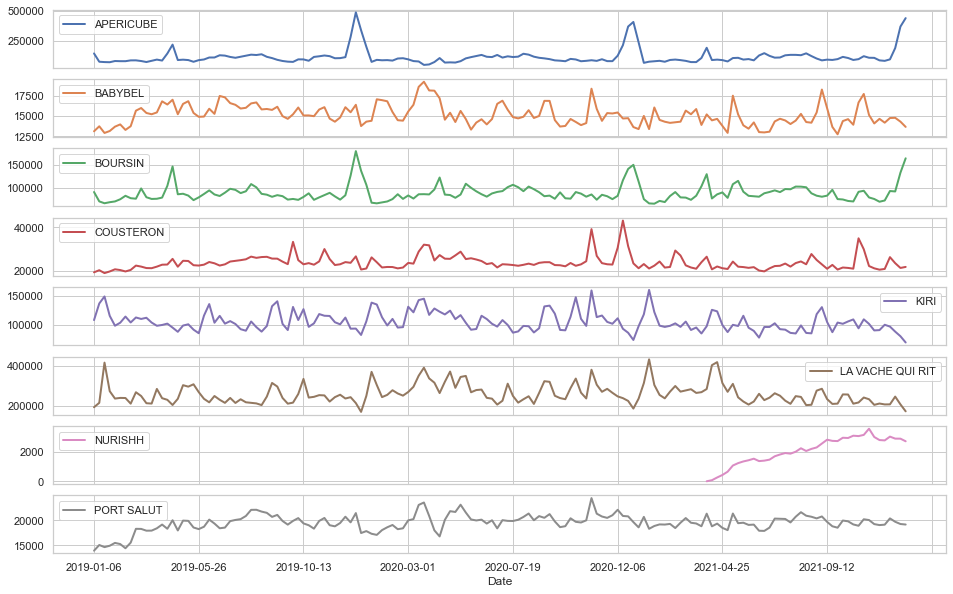

In [9]:
df_bel_hmsm.reset_index().groupby(['Date', 'Brand']).agg('sum').unstack()['Sales in volume'].plot(subplots=True, linewidth=2, figsize=(16, 10))

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

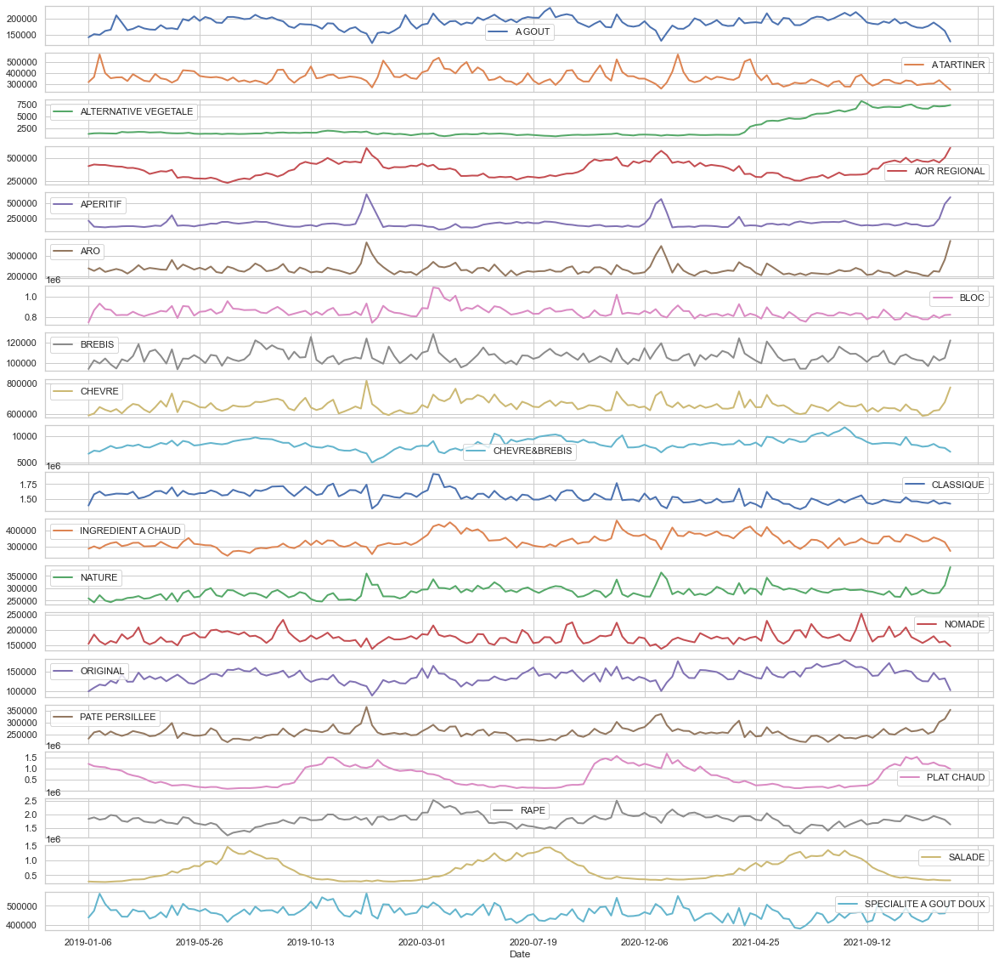

In [10]:
df_hmsm.reset_index().groupby(['Date', 'Category']).agg('sum').unstack()['Sales in volume'].plot(subplots=True, linewidth=2, figsize=(20, 20))

In [134]:
def get_df_brands(data_manager, country, brands_name, features):
    """Get the right DataFrame giving the country, the brands and features 
    from the datamanager
    """
    df_res = df[df.Brand.isin(
        brands_name[country])][features]
    df_res = df_res.fillna(0)

    return df_res

def get_df_competition_brands(df, brands_name, features):
    """Get the dataframe of all the other brands except the given ones with 
    the specified features
    """
    df_res = df[~(df.Brand.isin(
        brands_name)) & (df.Category.isin(
        bel_markets))][features]
    df_res = df_res.fillna(0)
    
    return df_res

def get_df_markets(df):
    """Get Markets dataframe
    """
    df_res = df.groupby(['Category', 'Date']).agg("sum")[
        ['Sales in volume']].unstack(0)
    df_res = df_res.droplevel(level=0, axis=1).reset_index()
    df_res['TOTAL CHEESE'] = df_res.iloc[:, 1:].sum(axis=1)
    df_res = df_res.fillna(0)
    df_res.columns.name = ''

    return df_res


def forecasting_features(df, features, periods=36, freq='MS'):
    """Get long term forecasts for features giving the dataframe and periods
    """
    # Select features except the target
    list_df_features = []
    for feature in tqdm(features, ascii=True, desc='Features'):
        model = Prophet()
        # Preprocessing Inputs of Prophet
        df_frcast = df[['Date', feature]]
        df_frcast.columns = ['ds', 'y']
        df_frcast.ds = pd.to_datetime(df_frcast.ds)
        df_frcast['cap'] = df[feature].max() * 3
        df_frcast['floor'] = df[feature].mean() / 2
        
        if (df_frcast['cap'] <= df_frcast['floor']).any():
            df_frcast['cap'] = df_frcast.floor + 1
        
        # Model
        model = Prophet(growth='logistic', yearly_seasonality=20)
        model.fit(df_frcast)

        # Periods is in months
        future = model.make_future_dataframe(periods=periods, freq=freq)
        future['cap'] = df_frcast['cap'][0]
        future['floor'] = df_frcast['floor'][0]
        fcst = model.predict(future[future.ds > df_frcast.ds.iloc[-1]])
        
        # Plot forecast
        fig = model.plot(fcst)
        ax = fig.gca()
        ax.set_title(feature)
        
        df_frcast.rename(columns={'y': feature}, inplace=True)
        fcst.rename(columns={'yhat': feature}, inplace=True)
        # Adding result to list
        list_df_features.append(pd.concat([df_frcast.iloc[:, :-2], fcst[['ds', feature]]]))

    # Merging the dataframes of each feature
    df_features = list_df_features[0][['ds']]
    for dff in list_df_features:
        df_features = pd.merge(df_features, dff, on='ds')

    df_features.rename(columns={'ds': 'Date'}, inplace=True)
    return df_features

def forecasting_features_brand(df, features, periods=36, freq='MS'):
    """Get long term forecasts for features giving the dataframe and periods
    """
    # Select features except the target
    list_df_features = []
    for feature in tqdm(features, ascii=True, desc='Features'):
        model = Prophet()
        # Preprocessing Inputs of Prophet
        df_frcast = df[['Date', feature]]
        df_frcast.columns = ['ds', 'y']
        df_frcast.ds = pd.to_datetime(df_frcast.ds)
        
        # Model
        model = Prophet()
        model.fit(df_frcast)

        # Periods is in months
        future = model.make_future_dataframe(periods=periods, freq=freq)
        fcst = model.predict(future[future.ds > df_frcast.ds.iloc[-1]])
        
        # Plot forecast
        fig = model.plot(fcst)
        ax = fig.gca()
        ax.set_title(feature)
        
        df_frcast.rename(columns={'y': feature}, inplace=True)
        fcst.rename(columns={'yhat': feature}, inplace=True)
        # Adding result to list
        list_df_features.append(pd.concat([df_frcast, fcst[['ds', feature]]]))

    # Merging the dataframes of each feature
    df_features = list_df_features[0][['ds']]
    for dff in list_df_features:
        df_features = pd.merge(df_features, dff, on='ds')

    df_features.rename(columns={'ds': 'Date'}, inplace=True)
    return df_features


def forecasting_one_brand(df, brand_name, features_name, periods=36, freq='MS'):
    """ Forecasting giving brand_name for giving number of periods and 
    features to use. 
    """
    # Get DataFrame for brand_name
    df = df.groupby(["Brand", "Date"]).agg(
        "sum").loc[brand_name].reset_index().sort_values('Date')
    
    # Predict long-term forecast for features
    df_features = forecasting_features_brand(df, features_name, periods=periods, freq=freq)
    # Preprocessing dataframe for prophet
    df['Date'] = pd.to_datetime(df.Date)
    #df = pd.merge(df_features_train, df[['Date', 'Sales in volume']], on='Date', how='inner')
    df = df[['Date', *features_name, 'Sales in volume']]
    df.rename(columns={'Date': 'ds', 'Sales in volume': 'y'}, inplace=True)
    
    df['cap'] = df['y'].max() * 3
    df['floor'] = df['y'].min() / 2
    if (df['cap'] <= df['floor']).any():
        df['cap'] = df.floor + 1

    
    # Instanciating Prophet Model
    model = Prophet(growth='logistic', yearly_seasonality=20)
    # Adding regressors
    for feature in features_name:
        model.add_regressor(feature)

    # Fitting model
    model.fit(df)
    
    future = model.make_future_dataframe(periods=periods, freq=freq)

    for feature in features_name:
        future[feature] = df_features[feature]
    

    future['cap'] = df['cap'][0]
    future['floor'] = df['floor'][0]
    
    # Predicting sales forecasts
    fcst = model.predict(future[future.ds > df.ds.iloc[-1]])
    
    # Plot forecast
    fig = model.plot(fcst)
    ax = fig.gca()
    ax.set_title(brand_name)
    
    fcst.rename(columns={'yhat':'y'}, inplace=True)
    df_brand_fcst = pd.concat([df[['ds', 'y']], fcst[['ds', 'y']]])
    df_brand_fcst.rename(columns={'ds': 'Date', 'y': brand_name}, inplace=True)

    return future, df_brand_fcst


def forecasting_brands(df, brands_name, features_name, periods=36, freq='MS'):
    """Forecasting a list of brands using the given features and periods
    """
    
    dict_feats_futures = {}
    list_df_brands = []
    # Compute forecast for each brand
    for brand in tqdm(brands_name, ascii=True, desc='Brands'):
        future, brand_fcst = forecasting_one_brand(df, brand, features_name, periods=periods, freq=freq)
        dict_feats_futures[brand] = future
        list_df_brands.append(brand_fcst)

    # Merge results of each brand
    df_brands_fcst = list_df_brands[0].Date
    for df_tmp in list_df_brands:
        df_brands_fcst = pd.merge(df_brands_fcst, df_tmp, on='Date', how='outer')

    return dict_feats_futures, df_brands_fcst


def forecasting_markets(df, markets_name, periods=36, freq='MS'):
    """Forecasting list of markets for the given periods
    """
    df_features = forecasting_features(df, markets_name, periods=periods, freq=freq)

    return df_features

def mitigate_covid(df, features, dates):
    """
    """
    pass
    
# Get adjusted features for organic growth
def adjust_organic_growth_features(df_features):
    """Adjust organic growth features for computing correlation of growth
    Drivers in the future (forecast)
    """
    df_organicforecast_feature = df_features.copy()
    feature_columns = list(df_organicforecast_feature)[1:]
    controlable_features = feature_columns[:4]
    df_organic_forecast_feature["Distribution"] = 0
    df_organic_forecast_feature["Rate of innovation"] = 0
    price_75percentile = df_organic_forecast_feature["Price per volume"].quantile(
        0.75)
    df_organic_forecast_feature["Price per volume"] = df_organic_forecast_feature["Price per volume"].apply(
        lambda x: x*1.25 if x <= price_75percentile else x)
    TDP_75percentile = df_organic_forecast_feature["TDP"].quantile(0.75)
    df_organic_forecast_feature["TDP"] = df_organic_forecast_feature["TDP"].apply(
        lambda x: x*0.75 if x >= TDP_75percentile else x)
    
    return df_organic_forecast_feature

### Computing Trends

In [124]:
kw_list = brands_name[country]
timeframes = list(df_bel.Date.unique())
tdelta = dt.timedelta(weeks=1)
timeframes.insert(0, (dt.datetime.strptime(timeframes[0], '%Y-%m-%d') - tdelta).strftime('%Y-%m-%d'))
    
geo='FR'
GET_METHOD='get'
headers = {
'authority': 'trends.google.com',
'cache-control': 'max-age=0',
'sec-ch-ua': '" Not A;Brand";v="99", "Chromium";v="98", "Google Chrome";v="98"',
'sec-ch-ua-mobile': '?0',
'sec-ch-ua-platform': '"macOS"',
'upgrade-insecure-requests': '1',
'user-agent': 'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/98.0.4758.102 Safari/537.36',
'accept': 'text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9',
'x-client-data': 'CJ7fygE=',
'sec-fetch-site': 'same-origin',
'sec-fetch-mode': 'navigate',
'sec-fetch-user': '?1',
'sec-fetch-dest': 'document',
'referer': 'https://trends.google.com/trends/?geo='+geo,
'accept-language': 'fr-FR,fr;q=0.9,en-US;q=0.8,en;q=0.7',
'cookie': '__utma=10102256.2142090120.1645455402.1645455402.1645455402.1; __utmc=10102256; __utmz=10102256.1645455402.1.1.utmcsr=(direct)|utmccn=(direct)|utmcmd=(none); __utmt=1; __utmb=10102256.5.9.1645455408893; CONSENT=YES+srp.gws-20220217-0-RC1.fr+FX+004; 1P_JAR=2022-02-21-15; SID=HQgzK1_QHq5O4Gxfol7wNIQ8JBvuh_XBbe-63vwnERFhFJEa8TFYSMqHR-5OUrj7OtQx_A.; __Secure-1PSID=HQgzK1_QHq5O4Gxfol7wNIQ8JBvuh_XBbe-63vwnERFhFJEawJmkuoBDtYla3S3m5hx8kQ.; __Secure-3PSID=HQgzK1_QHq5O4Gxfol7wNIQ8JBvuh_XBbe-63vwnERFhFJEaG7QfexXpqx5lg43EMUQUQw.; HSID=A_K65lvXgt3Scuc0n; SSID=Ajaw0EKPT7Ok638qm; APISID=1gdUaeoAbGY0hQBG/A68-B5BtWRxthyMoo; SAPISID=35kLI8C4oe7oZA-1/Ao42EJJT31v8K2hBe; __Secure-1PAPISID=35kLI8C4oe7oZA-1/Ao42EJJT31v8K2hBe; __Secure-3PAPISID=35kLI8C4oe7oZA-1/Ao42EJJT31v8K2hBe; NID=511=odIcinna2wJGUmMhN_uM0o_utTxPmkP7IP3WPOfwUDcgDxNaSaK0g-JdjZ15JWlWHpgSqsD2-DFJcy4-F8KfN5oGoz3dsqRKBpr0cgLmyefwq5Dsd2fLlSUh9HJhga7TaUfRKSdu09XitvJ8nCdnGN4iDLenCzdI5qEfyHyB3wJAZyONpYd-P1JtXD56OKnm-wJ5JoJObdm67M_myZj4PiOjMvOeVvnAMVHnZee48Ho; SIDCC=AJi4QfF7GP5rUgjZhMuSVECtziYI-TgFSUpdgGLTnDwYSuP22BrKzLUpdkcYO4aLQjG4jg09; __Secure-3PSIDCC=AJi4QfGKL18okfSNCPOhtb0IHAOOHOOROq_xm0P_hN0fwHW0il9jxtNj4ChDoxtjdexO_l6d',
}

class TrendReq(UTrendReq):
    def _get_data(self, url, method=GET_METHOD, trim_chars=0, **kwargs):
        return super()._get_data(url, method=GET_METHOD, trim_chars=trim_chars, headers=headers, **kwargs)

def compute_trends(geo, kw_list, timeframes):
    """
    """
    pytrend = TrendReq(hl=geo, tz=360)
    dataset = []
    for i in tqdm(range(1, len(timeframes)), desc='TimeFrames', ascii=True):
        # Merge kw queries results, only 5 max can be queried in an iteration
        tmp_data_raw = [timeframes[i]]
        for j in range(0, len(kw_list), 5):
            # 5: because only 5 keywords can be computed at the same time
            pytrend.build_payload(
                kw_list=kw_list[j:j+5],
                timeframe='{} {}'.format(timeframes[i-1], timeframes[i]), 
                geo=geo,
                gprop='')
            data = pytrend.interest_over_time().sum(axis=0)
            # [:-1] in order to not take into account the isPartial column 
            tmp_data_raw += list(data.values)[:-1]
        dataset.append(tmp_data_raw)

    df_trends = pd.DataFrame(dataset, columns=['Date'] + kw_list)
    return df_trends

def compute_trends_bis(geo, kw_list, start_date, end_date):
    """
    """
    pytrend = TrendReq(hl=geo, tz=360)
    dataset = pd.DataFrame()
    for i in range(0, len(kw_list), 5):
        pytrend.build_payload(
            kw_list=kw_list[i:i+5],
            timeframe='{} {}'.format(start_date, end_date),
            geo=geo,
            gprop=''
        )
        data = pytrend.interest_over_time()
        dataset = pd.concat([dataset, data.iloc[:, :-1]], axis=1)
        
    return dataset

In [13]:
df_trends = compute_trends_bis('FR', kw_list, start_date=timeframes[0], end_date=timeframes[-1])
df_trends = df_trends.reset_index().rename(columns={'date':'Date'})
df_trends.head()

,Date,APERICUBE,BABYBEL,BOURSIN,COUSTERON,KIRI,LA VACHE QUI RIT,PORT SALUT,NURISHH
0,2018-12-30,4,5,54,0,32,46,12,0
1,2019-01-06,1,6,32,0,27,23,5,0
2,2019-01-13,1,8,27,1,31,37,21,0
3,2019-01-20,1,6,29,0,26,48,20,0
4,2019-01-27,0,4,30,0,30,33,5,0


In [ ]:
df_trends.to_csv('../data/brand_trends_usa.csv')

### Forecasting Brands

#### No regressors

Features:   0%|          | 0/8 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inste

Initial log joint probability = -15.498
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       396.284    0.00139015       107.547      0.2352     0.02352      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       399.696    0.00142948       87.5907           1           1      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     208       399.849    0.00062976       72.6554   7.753e-06       0.001      326  LS failed, Hessian reset 
     257       399.976   9.21129e-05       80.3228   1.086e-06       0.001      435  LS failed, Hessian reset 
     299       399.981   1.14588e-05       83.5701      0.7172      0.7172      495   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     314       399.988   3.62799e-05       82.7981   4.293e-07       0.001      566  LS failed, Hessian reset

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -12.5507
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       308.739   3.83144e-05       56.0321      0.6793      0.6793      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       308.857   0.000120525       76.1114   3.471e-07       0.001      192  LS failed, Hessian reset 
     149       308.948   2.60636e-05       69.0196   3.438e-07       0.001      282  LS failed, Hessian reset 
     186       308.949   1.49291e-08       57.9966      0.2961           1      333   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -10.1302
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       334.274    0.00717867       95.9777           1           1      137   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       336.946   5.72291e-05       80.2296       2.889           1      275   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     215       336.952   7.89436e-05       78.6614   1.115e-06       0.001      335  LS failed, Hessian reset 
     299        336.96   2.76603e-06        63.108     0.04088           1      449   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     328        336.99   0.000142646        59.411   2.014e-06       0.001      532  LS failed, Hessian reset 
     389       337.007   1.78123e-05       53.7746   2.062e-07       0.001      658  LS failed, Hessian rese

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -5.34783
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      40       294.646    0.00061253       49.7909   1.271e-05       0.001      118  LS failed, Hessian reset 
      61       294.756   0.000798166       65.7838   2.171e-05       0.001      189  LS failed, Hessian reset 
      98       294.877   0.000690193       50.2773   1.338e-05       0.001      284  LS failed, Hessian reset 
      99       294.879   0.000230911       27.8244           1           1      285   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       294.901   5.88527e-05       40.4357   1.189e-06       0.001      341  LS failed, Hessian reset 
     116       294.902   1.71136e-05       51.2581   6.897e-07       0.001      384  LS failed, Hessian reset 
     124       294.902    1.4065e-05       63.6824    3.19e-07       0.001      434  LS failed, Hessian reset 
     136       294.903

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -6.82509
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      51       277.222    0.00329685       89.1908   3.673e-05       0.001      101  LS failed, Hessian reset 
      99       278.537   0.000794155       71.3484      0.4725      0.4725      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       280.056    3.9279e-06       89.5396     0.05183           1      288   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       281.593    9.5004e-05       77.9167      0.6333      0.6333      419   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     356       283.035    0.00698619       105.318   7.938e-05       0.001      528  LS failed, Hessian reset 
     399       284.511   5.71866e-05       64.8539      0.7016      0.7016      578   
    Iter      log pro

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -10.1017
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      71       253.658   0.000406547       86.8661   4.736e-06       0.001      131  LS failed, Hessian reset 
      99       253.681   1.48672e-06       75.8921      0.6016      0.6016      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     171       253.802   0.000454829       83.7316   5.558e-06       0.001      301  LS failed, Hessian reset 
     199       253.853   0.000844267       87.4779           1           1      336   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     263       253.879   5.27993e-07       81.9899   6.423e-09       0.001      455  LS failed, Hessian reset 
     275       253.879   7.64739e-09       70.6723      0.3422           1      473   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -6.21591
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        271.13   8.35874e-05       100.689           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       271.298    0.00112616       101.205   1.048e-05       0.001      172  LS failed, Hessian reset 
     155       271.356   6.62083e-09       101.733      0.1896      0.6269      239   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -7.38289
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      68       333.125   6.61669e-07       44.2408   1.274e-08       0.001      144  LS failed, Hessian reset 
      81       333.125   2.23316e-06       49.4911   3.575e-08       0.001      216  LS failed, Hessian reset 
      94       333.125   9.13056e-09       45.2305      0.1812      0.1812      244   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


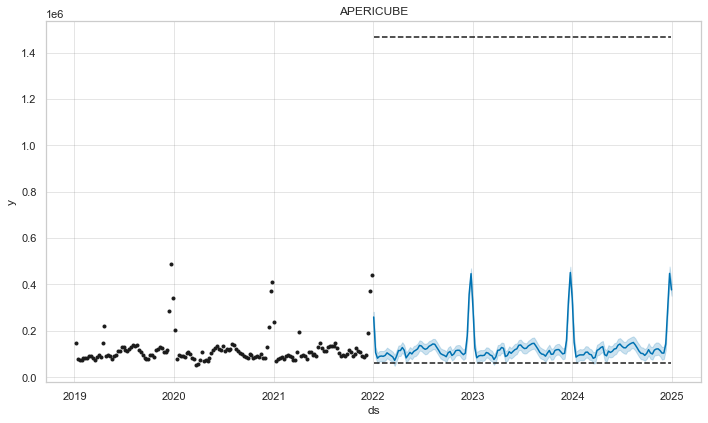

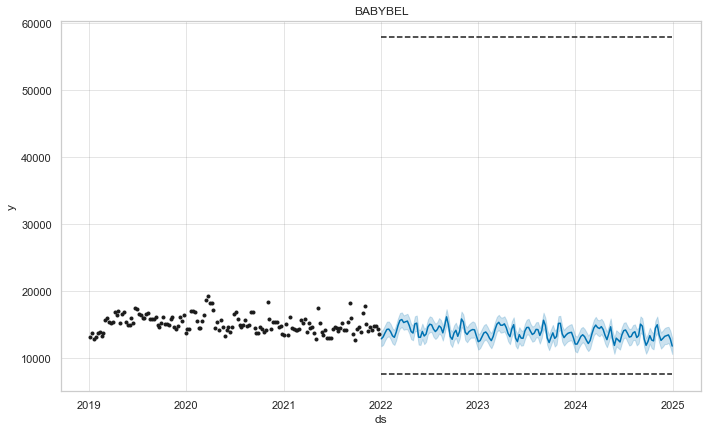

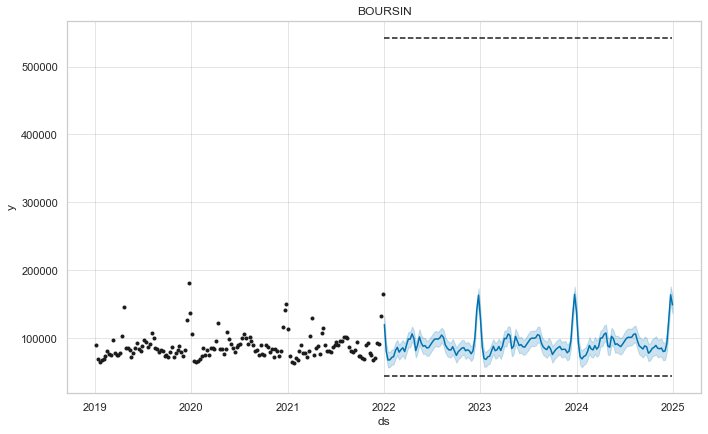

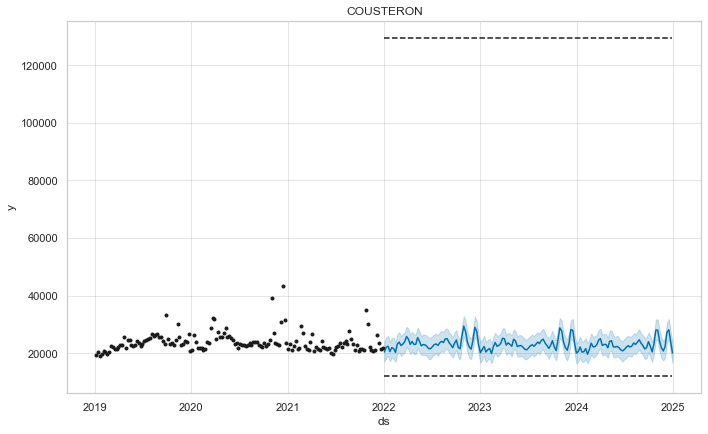

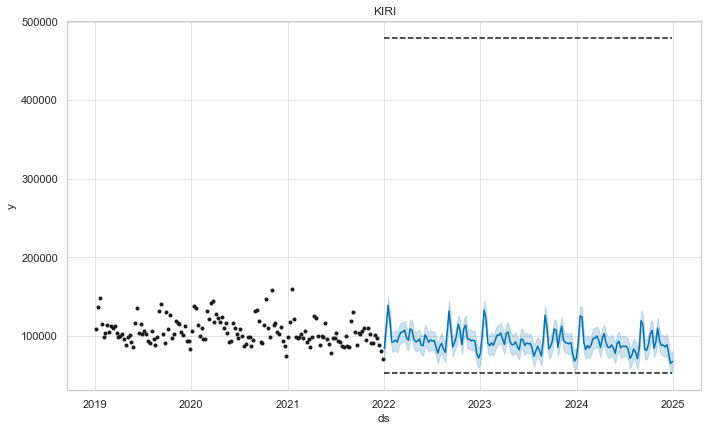

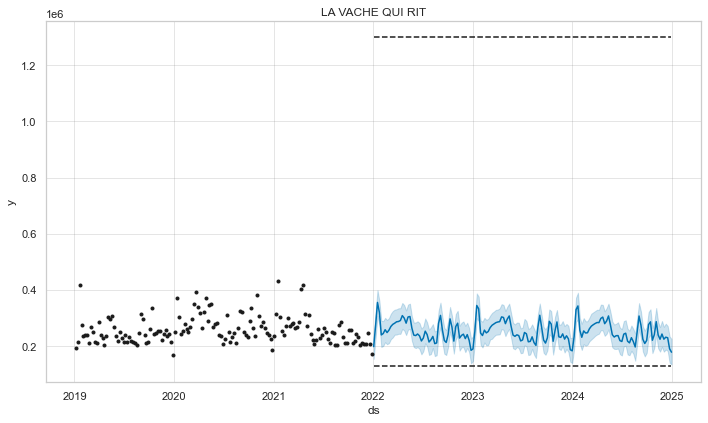

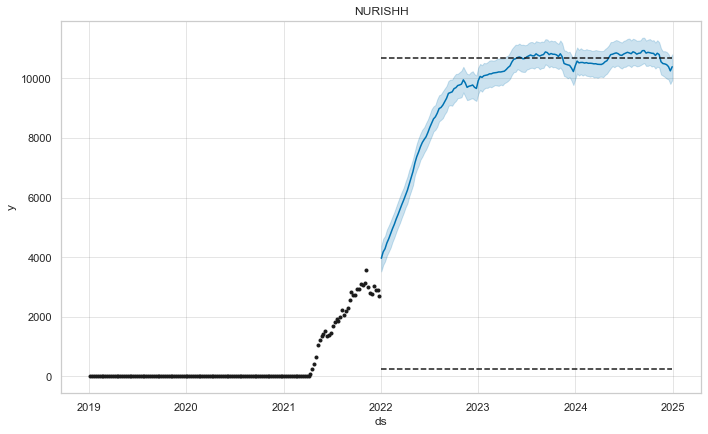

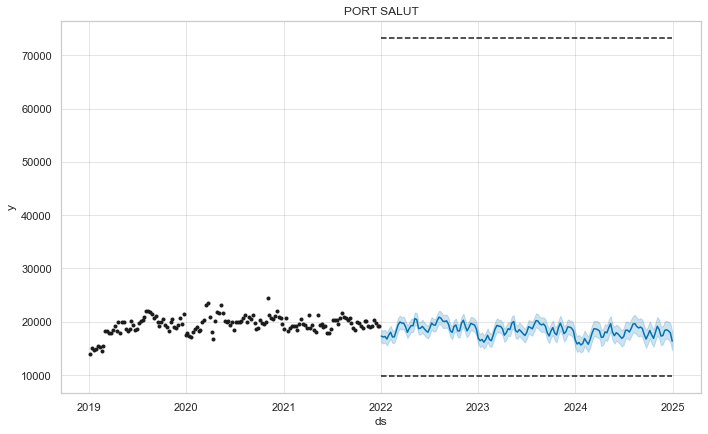

In [14]:
df_bel_brands = df_bel_hmsm.groupby(["Date", "Brand"]).agg('sum')['Sales in volume'].unstack().reset_index()
df_bel_brands.columns.name=''
df_bel_brands = df_bel_brands.fillna(0)
df_bel_brands_fcst_res = forecasting_features(df_bel_brands, list(df_bel_brands.columns[1:]), periods=157, freq='W')

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
      dtype=object)

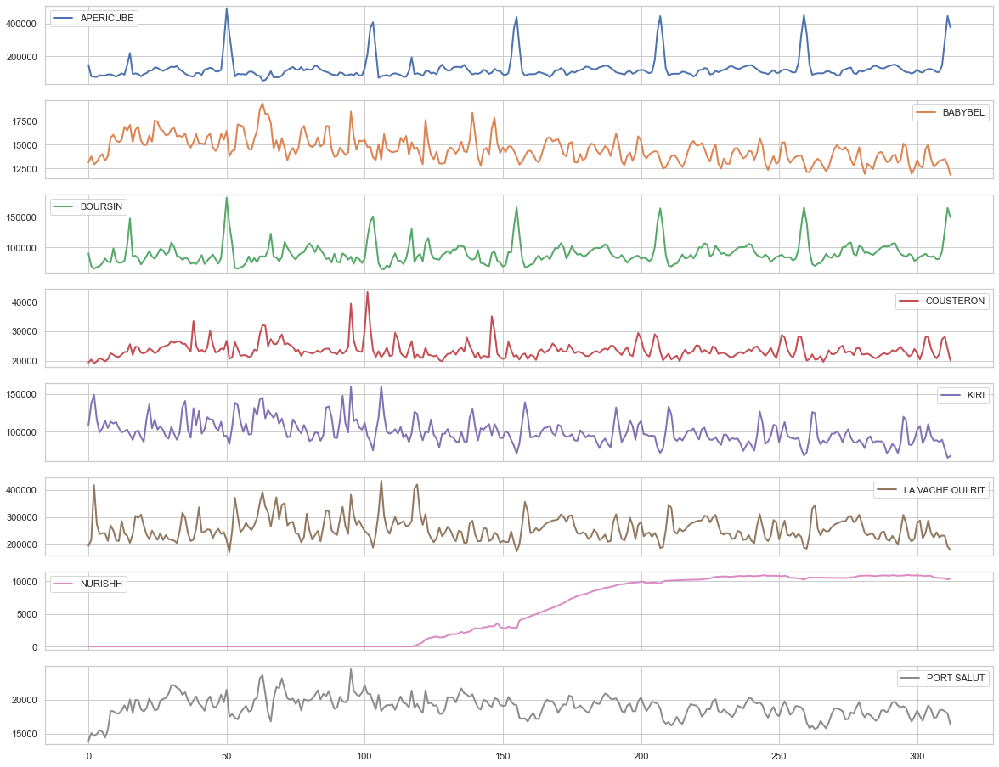

In [15]:
df_bel_brands_fcst_res.iloc[:, 1:].plot(subplots=True, linewidth=2, figsize=(20, 16))

In [16]:
df_bel_brands_fcst_res['Date'] = df_bel_brands_fcst_res.Date.apply(lambda x: x.strftime('%Y-%m-%d'))
df_bel_brands_fcst_res.round(1).to_excel("results/FR/HMSM/fr_hmsm_brands_forecasts_no_regressors.xlsx", index=False)

#### With Regressors

In [17]:
df_bel_hmsm['Trends'] = df_bel_hmsm.apply(lambda x: df_trends[df_trends.Date == x.Date][x.Brand].values[0], axis=1)
df_bel_hmsm.fillna(0, inplace=True)
df_bel_hmsm.head()

,Date,Brand,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation,Trends
0,2019-01-06,APERICUBE,13.433249,146366.553337,1.966178e+06,992.622737,1.081436e+06,44.38528,74.99087,29844.0375,627333.873400,0.0,1
1,2019-01-06,BABYBEL,8.210712,13123.628237,1.077543e+05,107.071512,1.508784e+06,683.15914,137.30146,205115.1500,806691.118450,0.0,6
2,2019-01-06,BOURSIN,18.187577,90328.415746,1.264901e+06,276.937777,9.410844e+05,33.81879,133.43824,41814.2575,414141.127425,0.0,32
3,2019-01-06,COUSTERON,8.088322,19412.541330,1.570149e+05,144.175736,1.393531e+05,0.00000,11.92763,2981.9075,24573.224600,0.0,0
4,2019-01-06,KIRI,9.307125,108616.422351,9.802176e+05,213.735119,1.419914e+06,43.41143,123.65016,41765.3975,700810.716475,0.0,27


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -12.3186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       218.535   0.000304039       97.6161      0.1724           1      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     130       218.586   0.000100481       93.5579   1.013e-06       0.001      203  LS failed, Hessian reset 
     154       218.601   1.58795e-05       102.379   1.751e-07       0.001      268  LS failed, Hessian reset 
     185       218.602    1.5617e-06       103.251   1.543e-08       0.001      354  LS failed, Hessian reset 
     199       218.603   4.67771e-08        90.645      0.2968           1      375   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     214       218.603   3.84927e-07       104.267   4.141e-09       0.001      434  LS failed, Hessian reset 
     219       218.603   8.75112e-09        88.337      0.1501   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.10186
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
Error evaluating model log probability: Non-finite gradient.

      99       625.276   0.000530851       181.377           1           1      138   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       625.537   0.000167565       228.366   1.398e-06       0.001      195  LS failed, Hessian reset 
     199       626.229    0.00359526       214.047           1           1      301   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     210       626.352   9.10451e-05       170.574    8.46e-07       0.001      358  LS failed, Hessian reset 
     294       626.522   5.61182e-09       77.9671      0.1694      0.1694      465   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.38367
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       468.831    0.00918883       104.905           1           1      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     122       471.474    0.00131476       165.966   1.072e-05       0.001      189  LS failed, Hessian reset 
     199       473.737   2.75621e-05       62.6178      0.2127           1      297   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     236       475.046   0.000243134       126.261   2.238e-06       0.001      407  LS failed, Hessian reset 
     289       475.383    6.5177e-05       62.2759   9.599e-07       0.001      502  LS failed, Hessian reset 
     299       475.389   3.17492e-05       59.0706      0.8524      0.8524      514   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Note

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -14.2216
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       422.608   0.000536239       100.755      0.3217      0.3217      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     113        423.55    0.00346746       242.855   3.054e-05       0.001      171  LS failed, Hessian reset 
     199       425.317    0.00311258       106.933      0.1707           1      281   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     272       427.609     0.0011122        82.778   1.468e-05       0.001      393  LS failed, Hessian reset 
     299       427.932   0.000418704       79.2095           1           1      428   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     356       428.355   9.08634e-05        75.149   1.107e-06       0.001      532  LS failed, Hessian rese

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -7.06361
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       204.384   2.50081e-06       94.7404      0.2631           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       204.448   0.000434347       62.9203      0.7964      0.7964      251   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     212       204.571   0.000773406       80.4335   8.876e-06       0.001      331  LS failed, Hessian reset 
     299       204.718   3.26949e-07        64.051       3.186      0.7769      445   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     319       204.718   2.57847e-07       80.7083   2.751e-09       0.001      510  LS failed, Hessian reset 
     331       204.718   3.78643e-09       90.5905      0.3024      0.3024      526   
Optimization terminat

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.02665
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       844.352    0.00313226       615.668           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199        850.08   6.87379e-05        256.09           1           1      247   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       851.939    0.00195968       1327.23           1           1      362   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       854.033   0.000400903       181.835           1           1      476   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       854.328   6.02205e-05       162.965           1           1      599   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.92749
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       435.927      0.010335       116.265           1           1      122   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     184       448.436   0.000563569         164.9   1.578e-06       0.001      268  LS failed, Hessian reset 
     199       450.683    0.00491636        86.724           1           1      284   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     262       453.065   0.000304788       112.345   1.411e-06       0.001      411  LS failed, Hessian reset 
     299       455.458    0.00105003       89.3177      0.8229      0.8229      456   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       461.635   0.000754363       120.192           1           1      577   
    Iter      log pro

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -13.1387
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       344.715   0.000285921       104.607     0.03744           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     144       345.143   2.82828e-05       84.6315   3.202e-07       0.001      235  LS failed, Hessian reset 
     199        345.27   0.000442388        87.113           1           1      304   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       345.317   0.000304081       211.873   3.995e-06       0.001      357  LS failed, Hessian reset 
     258       345.414   1.98516e-08       44.4893      0.7446      0.7446      428   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -14.602
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       213.874   3.97375e-07        88.114      0.2991      0.2991      120   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     112       213.874   9.59661e-09       91.7969      0.1837      0.1837      139   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.18311
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       520.365    0.00131397       651.416      0.5231      0.5231      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     169       525.894   0.000124556        113.09   8.331e-07       0.001      255  LS failed, Hessian reset 
     199       526.659    0.00100305       172.854           1           1      292   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       528.642    9.1737e-05       76.9875           1           1      429   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     323       528.926   0.000262492       84.3214   6.042e-06       0.001      505  LS failed, Hessian reset 
     399        529.43   0.000207743       80.0516      0.4118      0.4118      597   
    Iter      log pro

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.4174
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      59       412.013   0.000621094       92.2398   4.516e-06       0.001      117  LS failed, Hessian reset 
      97       412.256   0.000213118       86.2496   2.608e-06       0.001      212  LS failed, Hessian reset 
      99       412.263   8.46987e-05       59.0158           1           1      214   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     192       412.953      0.000832       139.138   7.724e-06       0.001      382  LS failed, Hessian reset 
     199       413.074   0.000741887       59.8418      0.2284           1      391   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     278       413.246   5.14161e-05       64.0105   7.148e-07       0.001      544  LS failed, Hessian reset 
     299       413.249   3.54483e-06       64.0814           1    

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -9.09275
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      59       370.614   0.000375566       95.7745   3.832e-06       0.001      106  LS failed, Hessian reset 
      99       370.646   8.22373e-07       92.2226      0.7975      0.7975      154   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       370.647   4.89829e-06       90.7269   5.042e-08       0.001      201  LS failed, Hessian reset 
     162       370.802     0.0014796       100.485   1.437e-05       0.001      310  LS failed, Hessian reset 
     199       370.942   1.05035e-06        85.979      0.4093      0.4093      363   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       370.962    7.5972e-05       93.4137   8.259e-07       0.001      434  LS failed, Hessian reset 
     273       370.972    2.7517e-08       89.5603           1   

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -9.21343
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       234.789   0.000149402       60.2026       2.476           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       234.823    0.00029197       68.4479   3.895e-06       0.001      206  LS failed, Hessian reset 
     170       234.833   2.89966e-08       56.4142      0.1749           1      270   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.03471
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       638.678   0.000491003        107.43           1           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       638.724   4.17781e-05       118.445   2.534e-07       0.001      189  LS failed, Hessian reset 
     150       638.858    2.6156e-05       89.2605    4.94e-07       0.001      276  LS failed, Hessian reset 
     192       638.867   1.01475e-05       52.5561   1.427e-07       0.001      378  LS failed, Hessian reset 
     199       638.868   1.09073e-06       49.4678           1           1      388   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     217       638.868   3.70654e-08       56.4235      0.3592      0.9204      416   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.24902
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       495.344   0.000891202       982.409      0.1087      0.1087      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       514.048   0.000772608       181.481       0.436           1      242   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       517.296     0.0195701       378.709          10           1      362   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399        520.22   0.000441968       138.395      0.7277      0.7277      484   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       520.527   5.16183e-06       56.2921           1           1      610   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -5.4868
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      96       338.041    0.00233825       121.196   2.903e-05       0.001      162  LS failed, Hessian reset 
      99       338.174    0.00317549       99.5301           1           1      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     188       338.798    0.00067497       105.141   7.778e-06       0.001      324  LS failed, Hessian reset 
     199       338.948   3.94392e-05       63.5405      0.2247      0.2247      337   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     257        338.97   1.32623e-05       69.6957   1.895e-07       0.001      452  LS failed, Hessian reset 
     299       338.971   8.64447e-07       73.4877      0.7241      0.7241      502   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -8.72133
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      66       191.075    0.00019982       96.1303   1.947e-06       0.001      119  LS failed, Hessian reset 
      99        191.12   5.59438e-06       99.9037      0.7545      0.7545      157   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       191.161   2.05705e-08        99.651       0.357       0.357      291   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       191.161   6.42479e-09       98.6385      0.2901           1      299   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.59961
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       564.321     0.0392205       741.362           1           1      121   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       578.974    0.00379999       793.122           1           1      236   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       586.775    0.00325772       207.818      0.6342      0.6342      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     366       589.527   7.50159e-05        130.72   3.918e-07       0.001      471  LS failed, Hessian reset 
     399       590.206   0.000459822       92.5822       2.444      0.2444      516   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     424       590.743   0.000182376    

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.55724
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      70       419.579   0.000818064       137.366   7.021e-06       0.001      128  LS failed, Hessian reset 
      99       419.727   0.000149113       95.1348           1           1      162   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     109       419.744   0.000183752       88.6265   1.881e-06       0.001      205  LS failed, Hessian reset 
     191       420.027    0.00143063       122.981   1.318e-05       0.001      353  LS failed, Hessian reset 
     199       420.104   0.000121186       87.2782      0.2364      0.5874      362   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     259       420.164   0.000153843       99.8832   1.461e-06       0.001      472  LS failed, Hessian reset 
     299       420.173   1.00838e-05        75.275       4.603   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -5.32237
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      42       312.544    0.00103778       86.7463   1.681e-05       0.001       87  LS failed, Hessian reset 
      88       312.964    0.00256013        77.329   2.502e-05       0.001      179  LS failed, Hessian reset 
      99       313.131    9.2842e-05       71.5026      0.5563     0.05563      197   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       313.177   0.000350203       82.4405   4.513e-06       0.001      262  LS failed, Hessian reset 
     199        313.27   0.000677925       76.2238      0.7816      0.7816      356   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205        313.36   0.000718541       78.1781   7.978e-06       0.001      409  LS failed, Hessian reset 
     299       313.512   0.000278249       94.3548           1   

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -5.44495
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      39       196.003   0.000569814       61.9113   8.461e-06       0.001       84  LS failed, Hessian reset 
      70       196.057   0.000136016       69.9762   1.865e-06       0.001      157  LS failed, Hessian reset 
      99       196.067   3.47413e-07       43.2959           1           1      200   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     179       196.347    0.00180728       86.1876   2.503e-05       0.001      354  LS failed, Hessian reset 
     199       196.407    1.3104e-06       51.7016      0.2919      0.2919      382   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     277       196.418   5.95594e-05       72.9224   8.978e-07       0.001      527  LS failed, Hessian reset 
     299        196.42   1.10497e-06       84.0315           1   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/prophet/plot.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documen

Initial log joint probability = -2.0262
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       734.207    0.00608299       686.362           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       735.951   0.000660973       664.591        0.64        0.64      250   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     260       736.423   3.39666e-05       300.678   8.209e-08       0.001      382  LS failed, Hessian reset 
     299       736.567    3.4474e-05       124.681     0.06738           1      436   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     360       736.592   8.31418e-07       64.4038   1.149e-08       0.001      558  LS failed, Hessian reset 
     389       736.593    3.6019e-06       63.0286   5.162e-08       0.001      636  LS failed, Hessian reset

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.62269
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       475.334    0.00593003       154.147           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       480.962    0.00106323       130.308           1           1      266   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     295       482.388   0.000250089       127.383   2.624e-06       0.001      431  LS failed, Hessian reset 
     299       482.436   0.000425652        76.202           1           1      435   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     358       482.638   3.65052e-05       80.6222   5.217e-07       0.001      550  LS failed, Hessian reset 
     399       482.641   1.08951e-06       74.0683      0.2647           1      610   
    Iter      log pro

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -9.44077
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       287.312   0.000496042       79.8445   5.242e-06       0.001      154  LS failed, Hessian reset 
      99        287.33   7.84035e-06       59.3543      0.3991      0.3991      166   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       287.334   4.99029e-09       76.3149      0.2034      0.2034      217   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -14.533
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        246.42   1.39251e-05       87.0546      0.5863      0.5863      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       246.437   1.04133e-07       95.4217       0.192           1      259   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     205       246.437   8.95836e-09       91.3684      0.4815      0.4815      266   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.02032
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        932.25   0.000562888        2601.3           1           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       940.173   0.000341235       427.826           1           1      248   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       942.027    0.00453072       2609.51           1           1      358   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       945.805   7.49455e-05       511.256      0.4498      0.4498      474   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       946.605   0.000162232       1460.52      0.2846      0.2846      592   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.51567
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       471.261    0.00161326        97.591           1           1      132   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     195       479.425   0.000585697       208.747   5.727e-06       0.001      292  LS failed, Hessian reset 
     199       479.641    0.00149856       109.895           1           1      296   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     256       481.674   0.000202212        101.04   2.192e-06       0.001      400  LS failed, Hessian reset 
     299       483.393      0.015231       102.455      0.5982           1      454   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     327       484.326   0.000435709       210.677   3.624e-06       0.001      536  LS failed, Hessian rese

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -5.7054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      50        386.32   0.000600749       54.1007   7.956e-06       0.001      107  LS failed, Hessian reset 
      99       386.504   0.000734249       67.1989      0.6649      0.6649      176   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       386.878   0.000795726       82.0851    9.01e-06       0.001      252  LS failed, Hessian reset 
     161       386.987   1.18415e-05       28.8004   3.387e-07       0.001      334  LS failed, Hessian reset 
     176       386.989   2.48793e-05       73.3415   4.774e-07       0.001      392  LS failed, Hessian reset 
     182        386.99   4.02395e-09       60.4666   1.099e-05      0.1682      411   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



Initial log joint probability = 11.6429
Iteration  1. Log joint probability =    7.78044. Improved by -3.86246.
Iteration  2. Log joint probability =    9.72857. Improved by 1.94813.
Iteration  3. Log joint probability =    14.1494. Improved by 4.42087.
Iteration  4. Log joint probability =    14.1992. Improved by 0.0497439.
Iteration  5. Log joint probability =    14.2519. Improved by 0.0527155.
Iteration  6. Log joint probability =    14.3276. Improved by 0.0756841.
Iteration  7. Log joint probability =    14.3864. Improved by 0.0588162.
Iteration  8. Log joint probability =    14.4171. Improved by 0.0307407.
Iteration  9. Log joint probability =    14.4579. Improved by 0.0407684.
Iteration 10. Log joint probability =    14.5695. Improved by 0.111556.
Iteration 11. Log joint probability =     14.729. Improved by 0.159503.
Iteration 12. Log joint probability =    14.8793. Improved by 0.150319.
Iteration 13. Log joint probability =    14.9293. Improved by 0.0500336.
Iteration 14. Log 

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_


Initial log joint probability = 13.1
Iteration  1. Log joint probability =    12.7663. Improved by -0.333687.
Iteration  2. Log joint probability =    16.8137. Improved by 4.04741.
Iteration  3. Log joint probability =    16.8377. Improved by 0.0240258.
Iteration  4. Log joint probability =    16.8586. Improved by 0.0209116.
Iteration  5. Log joint probability =    16.8727. Improved by 0.014102.
Iteration  6. Log joint probability =    16.9286. Improved by 0.0559054.
Iteration  7. Log joint probability =     16.949. Improved by 0.0203219.
Iteration  8. Log joint probability =    17.1868. Improved by 0.237788.
Iteration  9. Log joint probability =     67.299. Improved by 50.1122.
Iteration 10. Log joint probability =    67.3804. Improved by 0.0814846.
Iteration 11. Log joint probability =    67.4813. Improved by 0.100813.
Iteration 12. Log joint probability =    68.7421. Improved by 1.26082.
Iteration 13. Log joint probability =    68.8742. Improved by 0.132149.
Iteration 14. Log joint

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_


Initial log joint probability = 12.8654
Iteration  1. Log joint probability =    29.2866. Improved by 16.4212.
Iteration  2. Log joint probability =    53.7544. Improved by 24.4678.
Iteration  3. Log joint probability =    71.0641. Improved by 17.3097.
Iteration  4. Log joint probability =    77.7336. Improved by 6.66948.
Iteration  5. Log joint probability =    79.2542. Improved by 1.52064.
Iteration  6. Log joint probability =    79.3919. Improved by 0.137714.
Iteration  7. Log joint probability =    79.4155. Improved by 0.0236121.
Iteration  8. Log joint probability =    79.4766. Improved by 0.0610907.
Iteration  9. Log joint probability =    79.5233. Improved by 0.046705.
Iteration 10. Log joint probability =    79.5499. Improved by 0.0265661.
Iteration 11. Log joint probability =    79.6584. Improved by 0.108532.
Iteration 12. Log joint probability =    79.6632. Improved by 0.00481649.
Iteration 13. Log joint probability =    83.9198. Improved by 4.2566.
Iteration 14. Log joint p

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



Initial log joint probability = -127.027
Iteration  1. Log joint probability =    11.9629. Improved by 138.99.
Iteration  2. Log joint probability =     51.357. Improved by 39.3941.
Iteration  3. Log joint probability =    74.4637. Improved by 23.1067.
Iteration  4. Log joint probability =    96.3139. Improved by 21.8501.
Iteration  5. Log joint probability =    117.296. Improved by 20.9822.
Iteration  6. Log joint probability =     144.49. Improved by 27.1942.
Iteration  7. Log joint probability =    159.316. Improved by 14.8256.
Iteration  8. Log joint probability =    179.713. Improved by 20.3973.
Iteration  9. Log joint probability =    193.883. Improved by 14.1698.
Iteration 10. Log joint probability =    231.574. Improved by 37.6906.
Iteration 11. Log joint probability =    251.513. Improved by 19.939.
Iteration 12. Log joint probability =    266.097. Improved by 14.5839.
Iteration 13. Log joint probability =    268.567. Improved by 2.47081.
Iteration 14. Log joint probability =

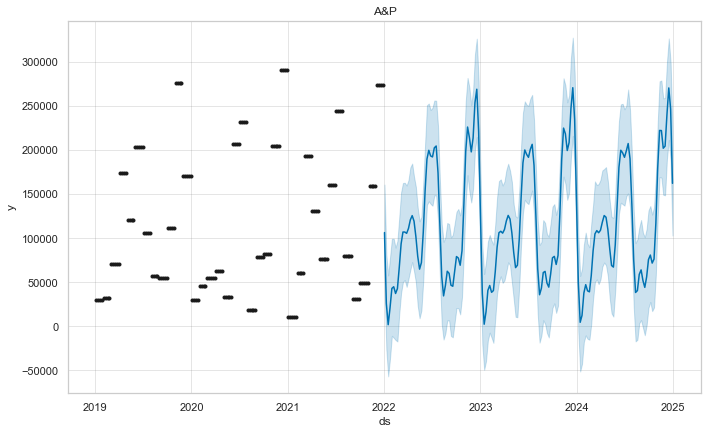

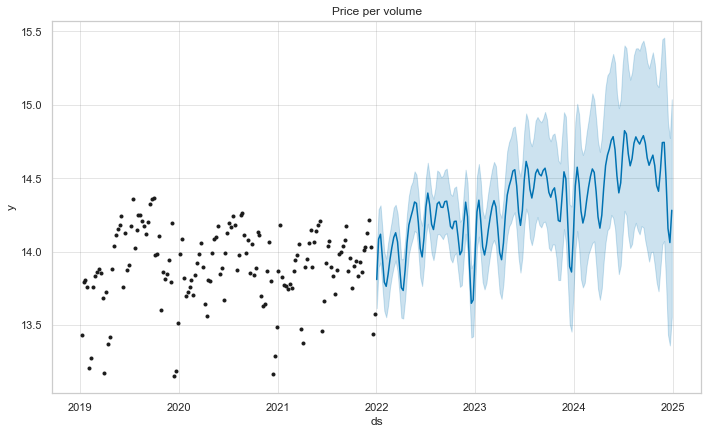

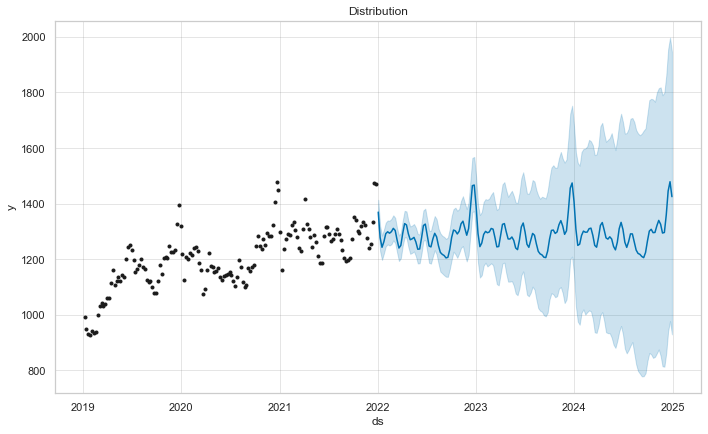

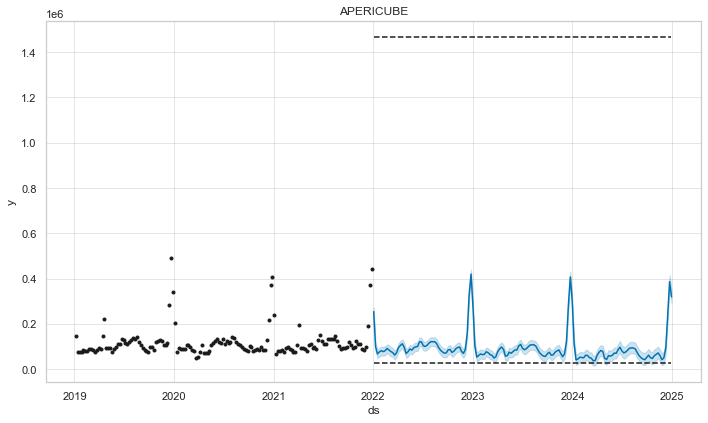

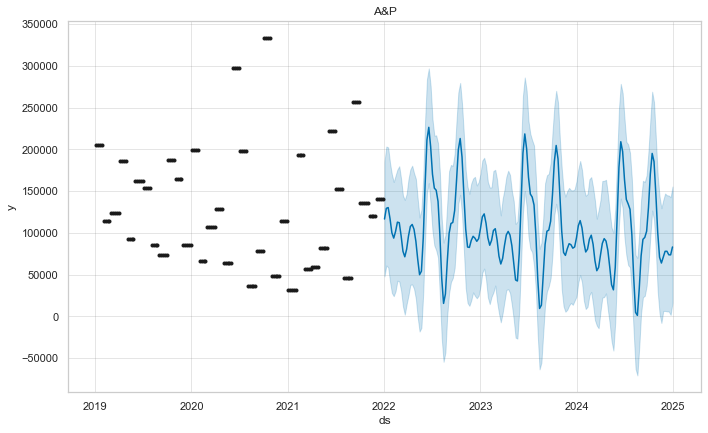

...

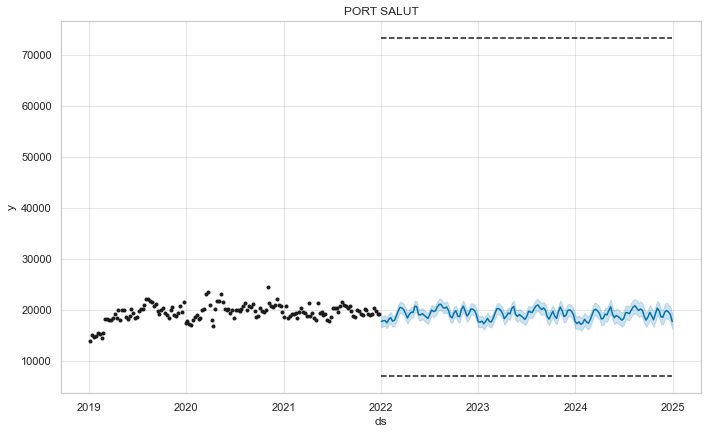

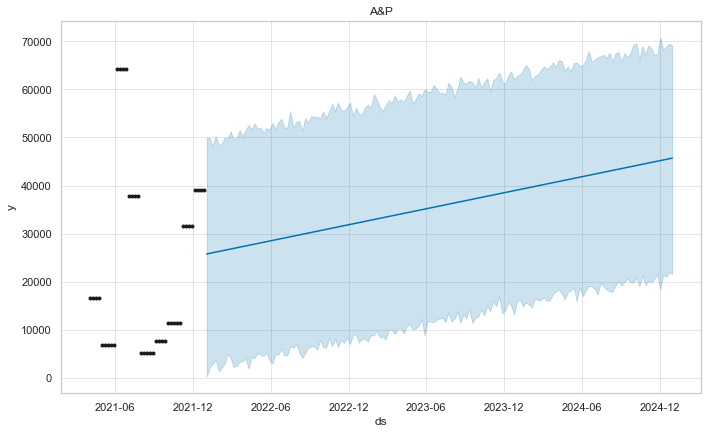

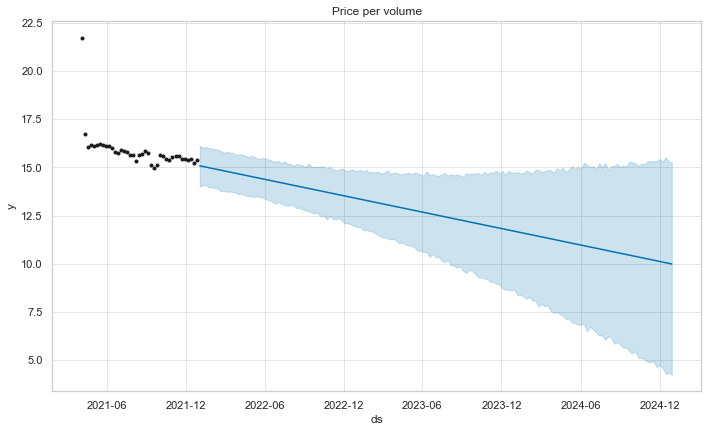

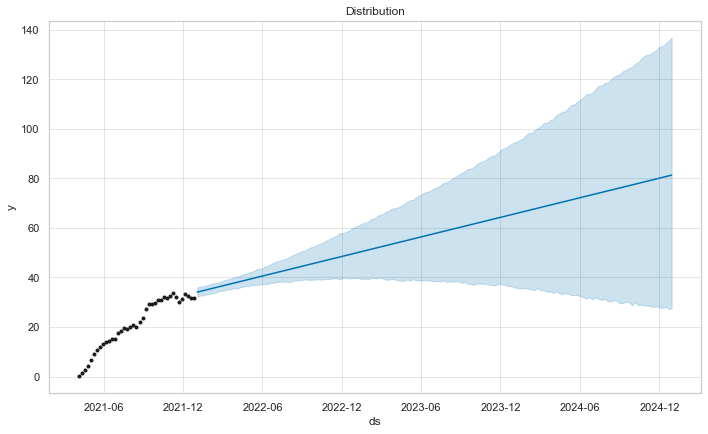

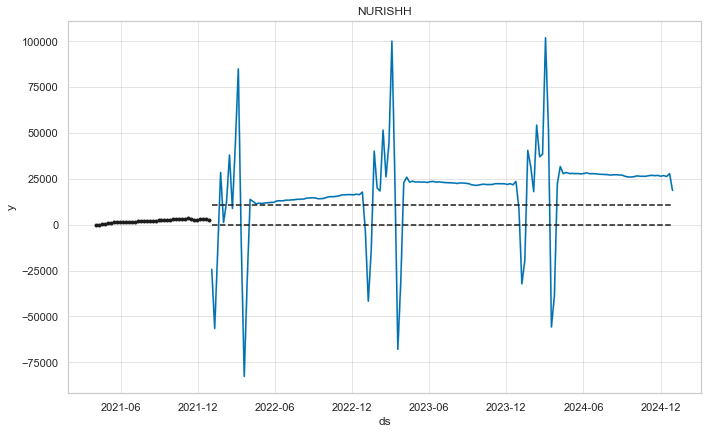

In [18]:
features_name = ['A&P', 'Price per volume', 'Distribution']
feats_futures, df_brands_fcst_res = forecasting_brands(df_bel_hmsm, brands_name[country], features_name, periods=157, freq='W')

In [19]:
df_brands_fcst_res

,Date,APERICUBE,BABYBEL,BOURSIN,COUSTERON,KIRI,LA VACHE QUI RIT,PORT SALUT,NURISHH
0,2019-01-06,146366.553337,13123.628237,90328.415746,19412.541330,108616.422351,193666.133202,13940.655571,NaN
1,2019-01-13,77416.328112,13744.608339,69631.304117,20381.931689,136794.799117,215733.865454,15072.853350,NaN
2,2019-01-20,74628.923692,12916.629687,65531.218468,19056.006545,148743.825845,416711.456703,14651.133448,NaN
3,2019-01-27,73392.476410,13158.530731,67852.996307,19808.077474,115800.791420,273796.471771,14926.463106,NaN
4,2019-02-03,83403.581422,13699.439478,69559.862843,20791.569382,98998.327890,236959.112622,15493.442666,NaN
...,...,...,...,...,...,...,...,...,...
308,2024-12-01,49792.020748,12495.517862,127470.701871,13421.965389,90516.594472,108588.785773,19550.762988,26399.733712
309,2024-12-08,93016.556509,12652.461878,140536.747846,18211.858220,93513.782798,116394.590879,19861.829779,26774.610103
310,2024-12-15,235411.439608,12785.915520,173622.004639,17428.505324,81343.316812,107999.971472,19601.960225,26250.244271
311,2024-12-22,386254.783295,12067.845480,210056.578590,14167.968878,69732.534181,70668.558219,19099.569899,27804.586789


In [20]:
df_brands_fcst_res.fillna(0, inplace=True)
df_brands_fcst_res['Date'] = df_brands_fcst_res.Date.apply(lambda x: x.strftime('%Y-%m-%d'))
df_brands_fcst_res.round(1).to_excel("results/FR/HMSM/fr_hmsm_brands_forecasts_with_regressors.xlsx", index=False)

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

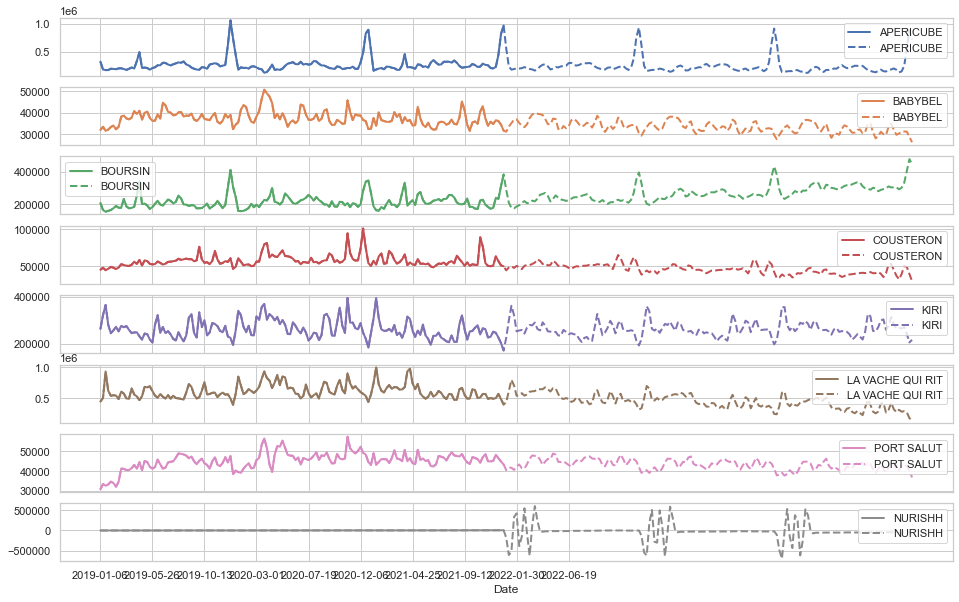

In [13]:
ax = df_brands_fcst_res.set_index("Date").loc['2017-12-31':'2021-12-26'].plot(linewidth=2, subplots=True, figsize=(16, 10))
df_brands_fcst_res.set_index("Date").plot(linewidth=2, linestyle='--', subplots=True, figsize=(16, 10), ax=ax)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

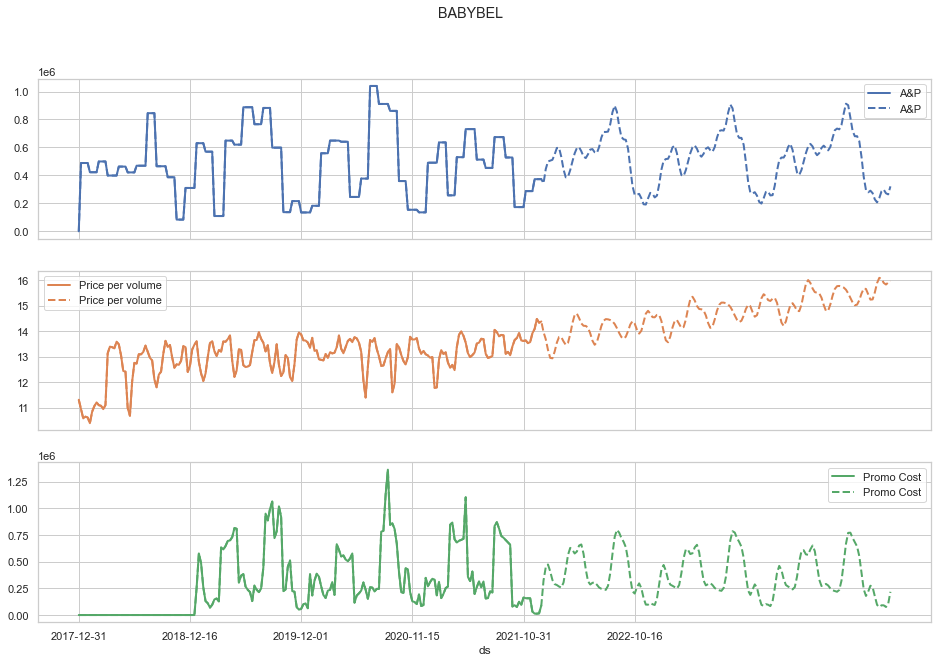

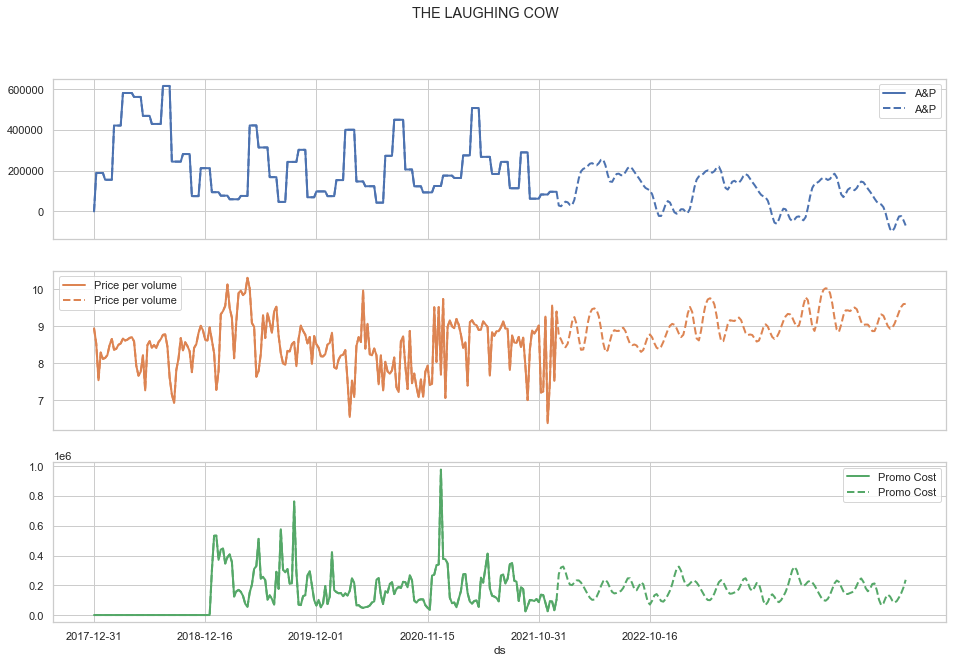

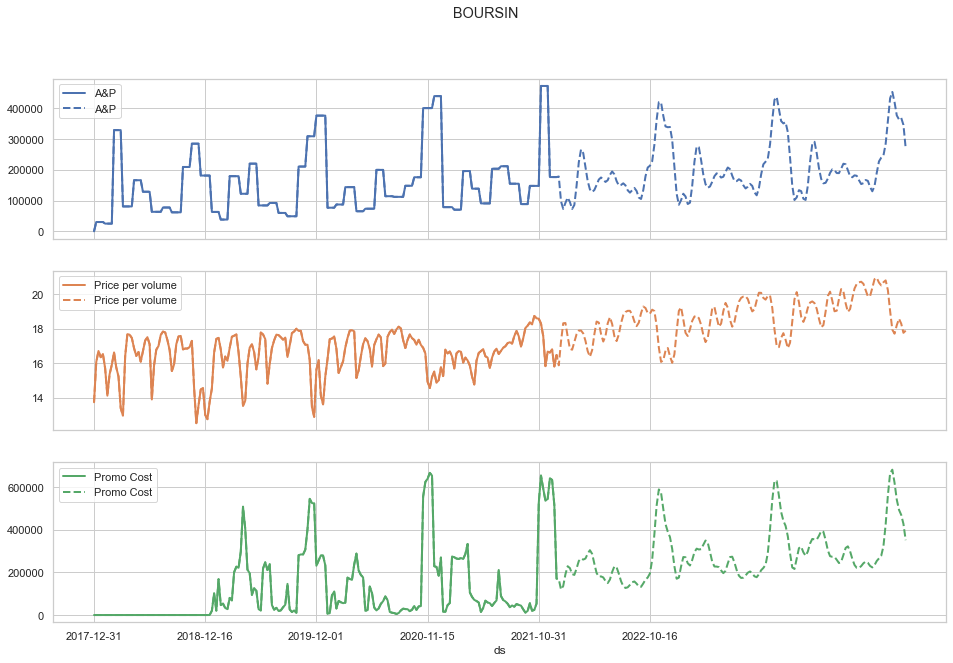

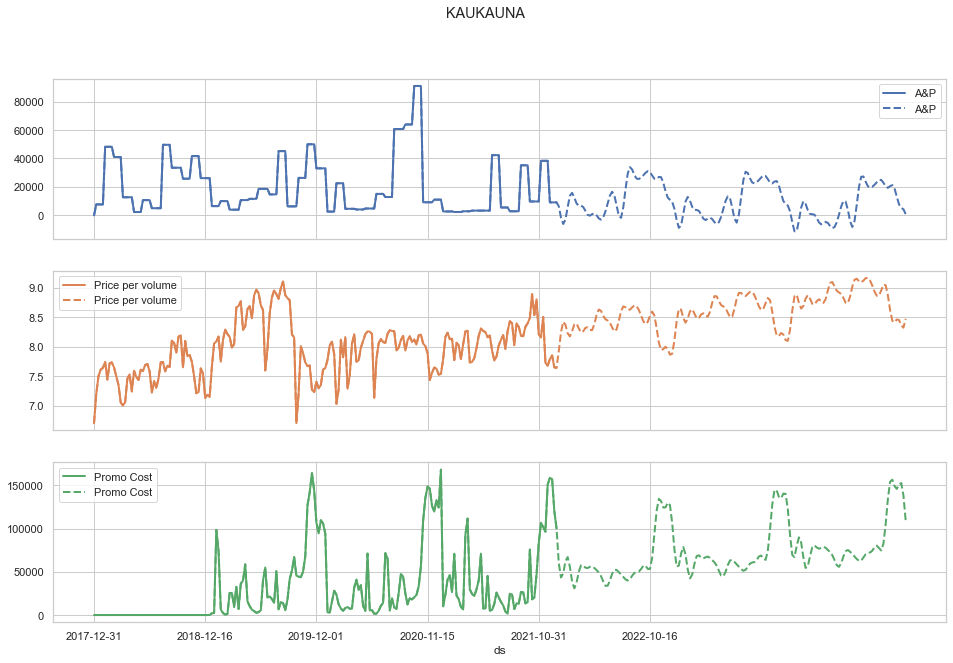

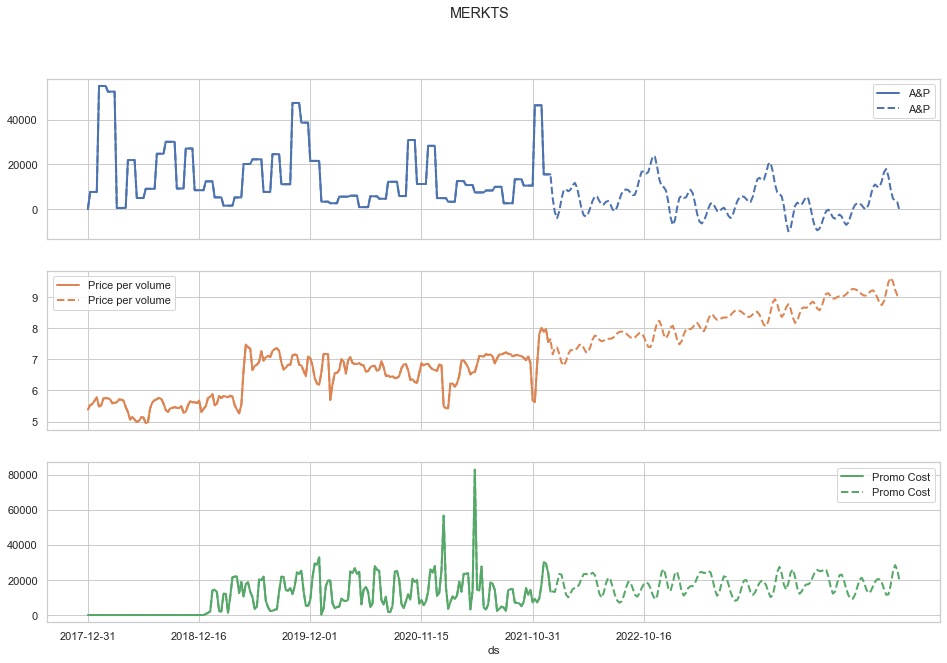

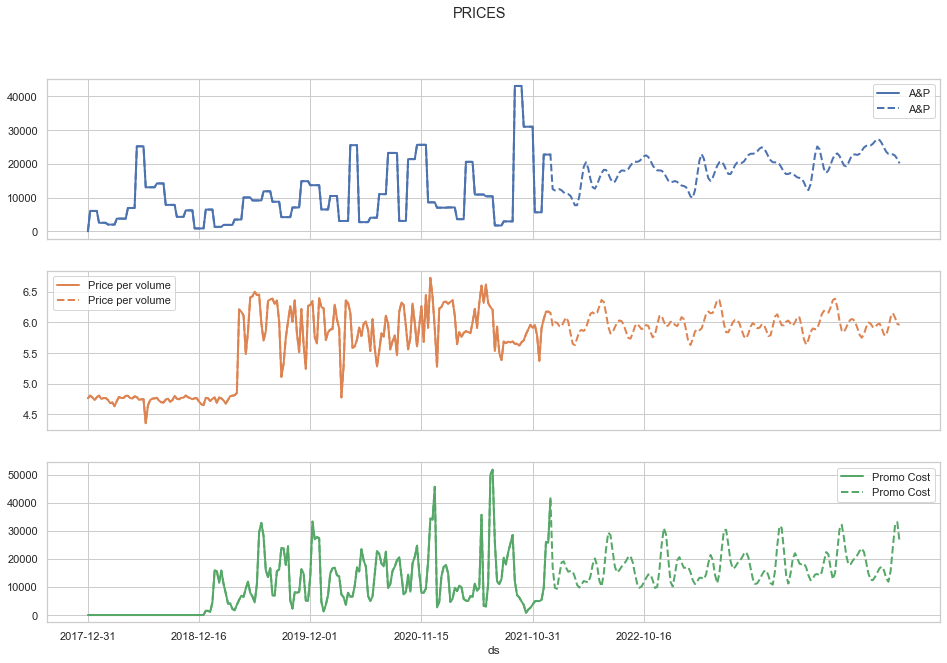

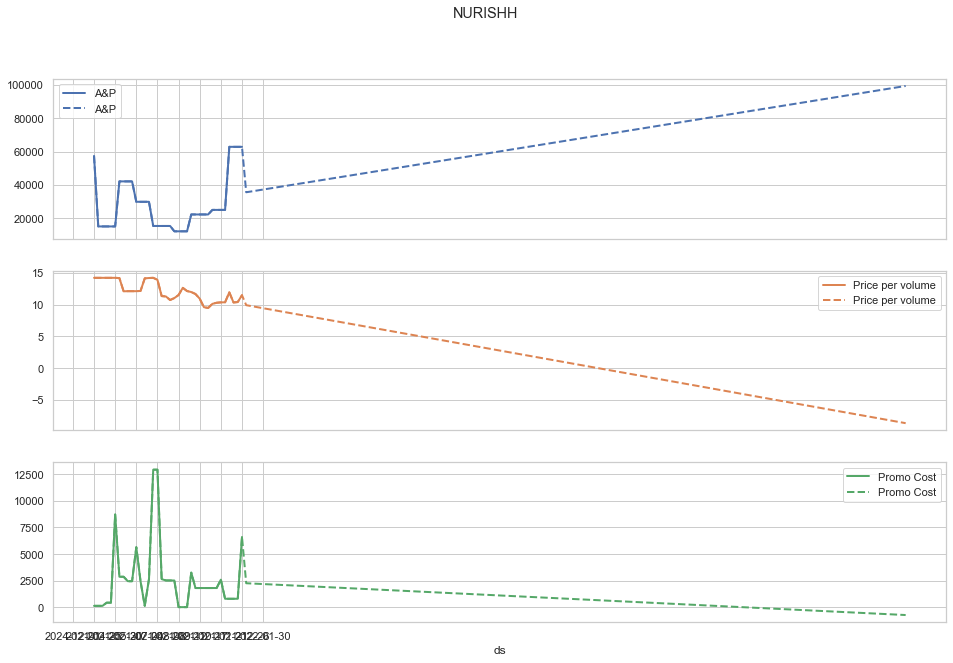

In [123]:
for brand in feats_futures:
    ax = feats_futures[brand].set_index('ds').loc['2017-12-31':'2021-12-26'].plot(subplots=True, figsize=(16, 10), title=brand, linewidth=2);
    feats_futures[brand].set_index('ds').plot(
        subplots=True, figsize=(16, 10), title=brand, 
        linestyle='--', linewidth=2, ax=ax);

### Forecasting Markets

In [21]:
features_markets = list(df_hmsm.Category.unique()) + ['TOTAL CHEESE']
df_markets = get_df_markets(df_hmsm)
df_markets.head()

,Date,A GOUT,A TARTINER,ALTERNATIVE VEGETALE,AOR REGIONAL,APERITIF,ARO,BLOC,BREBIS,CHEVRE,...,INGREDIENT A CHAUD,NATURE,NOMADE,ORIGINAL,PATE PERSILLEE,PLAT CHAUD,RAPE,SALADE,SPECIALITE A GOUT DOUX,TOTAL CHEESE
0,2019-01-06,143324.633106,315274.967674,1248.075000,411731.973115,210652.518572,239248.117542,744935.803921,93924.724554,588782.215963,...,284859.651598,259422.701935,155353.205248,99098.215466,232728.492699,1.219834e+06,1.834360e+06,290189.496628,437810.907345,8.959310e+06
1,2019-01-13,153008.025049,362405.969408,1377.301691,429049.820304,113624.906187,226903.630373,864722.747598,102474.989404,601923.530668,...,300082.598301,242963.783308,185971.687205,108651.369114,259405.003167,1.114742e+06,1.890007e+06,281674.901042,473537.158455,9.298218e+06
2,2019-01-20,150803.982661,570998.488579,1403.501710,424703.338211,108353.680538,240886.593953,930356.467871,99332.417516,644217.956202,...,285805.708155,272148.442342,163706.506473,116786.484459,265090.715629,1.083817e+06,1.805422e+06,277670.908612,565069.959319,9.641060e+06
3,2019-01-27,162960.542784,398166.534820,1379.556710,423843.873850,102873.737412,221880.423786,875224.144042,104236.314216,626188.907460,...,306908.127880,250419.674533,153150.722896,114291.561827,247751.689249,1.065304e+06,1.840816e+06,272535.256214,509781.345638,9.245558e+06
4,2019-02-03,166691.815916,350958.626341,1374.965719,414553.161854,111869.203441,229215.485884,868107.394585,98319.536340,614225.433885,...,320252.773605,243810.357015,164766.767767,126573.577998,263238.008345,9.806148e+05,1.977519e+06,285102.763229,476980.074286,9.278015e+06


In [22]:
features_markets

['A TARTINER',
 'NOMADE',
 'APERITIF',
 'ARO',
 'NATURE',
 'RAPE',
 'CHEVRE&BREBIS',
 'A GOUT',
 'ORIGINAL',
 'SALADE',
 'PLAT CHAUD',
 'BLOC',
 'PATE PERSILLEE',
 'CLASSIQUE',
 'AOR REGIONAL',
 'SPECIALITE A GOUT DOUX',
 'BREBIS',
 'CHEVRE',
 'INGREDIENT A CHAUD',
 'ALTERNATIVE VEGETALE',
 'TOTAL CHEESE']

Features:   0%|          | 0/21 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inste

Initial log joint probability = -7.43184
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       270.484   0.000741134        74.749   9.059e-06       0.001      155  LS failed, Hessian reset 
      99       270.523   4.23917e-05       69.8883        0.43        0.43      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     131       270.531   5.68435e-06       82.6957   6.827e-08       0.001      242  LS failed, Hessian reset 
     160       270.532   4.44918e-06       85.1686   5.495e-08       0.001      319  LS failed, Hessian reset 
     191       270.533   6.15684e-09       78.7399      0.5816      0.5816      358   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -10.6302
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       353.656   1.77527e-05        48.448      0.2591      0.2591      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       353.703   5.98261e-05       76.7588   4.464e-07       0.001      191  LS failed, Hessian reset 
     177       353.811   9.71839e-05       70.4062   1.836e-06       0.001      322  LS failed, Hessian reset 
     199       353.827   1.35458e-05       38.9636      0.5566      0.5566      349   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     229       353.839   1.51872e-05       29.6738   2.371e-07       0.001      421  LS failed, Hessian reset 
     248        353.84   5.16611e-06       41.5512   8.825e-08       0.001      485  LS failed, Hessian reset 
     264        353.84    8.2197e-08       56.3375   1.393e-09   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -16.6175
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       389.121    0.00332831       92.2819      0.3846      0.3846      131   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       394.975    0.00238047       88.9914           1           1      270   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     274       395.399   9.52571e-05       76.1549   1.058e-06       0.001      399  LS failed, Hessian reset 
     299       395.403   7.92485e-07       71.3465           1           1      438   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     385       396.265    0.00335311        88.575   3.701e-05       0.001      581  LS failed, Hessian reset 
     399       396.617   0.000433378       88.4242      0.9713      0.9713      597   
    Iter      log pro

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -10.1765
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       390.151   0.000267156       84.9468           1           1      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       390.489    0.00250657       91.5066   2.943e-05       0.001      204  LS failed, Hessian reset 
     193       390.708   7.76525e-05       81.5428   1.027e-06       0.001      335  LS failed, Hessian reset 
     199       390.711   2.09611e-05       58.0612      0.3984           1      343   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     251       390.714   3.60072e-06        79.245   5.263e-08       0.001      449  LS failed, Hessian reset 
     268       390.714   6.17497e-09       69.7478     0.03248       0.327      475   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -5.07938
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      49       387.843    0.00547284       97.4191   0.0001147       0.001      113  LS failed, Hessian reset 
      70        388.07   0.000120931       60.7069   1.931e-06       0.001      183  LS failed, Hessian reset 
      99       388.077   9.61227e-06        51.889           1           1      224   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     107       388.326    0.00177647        52.429   2.763e-05       0.001      279  LS failed, Hessian reset 
     139       388.385   9.91065e-06       51.2536   2.112e-07       0.001      383  LS failed, Hessian reset 
     178       388.405   3.19676e-05       59.0329   6.232e-07       0.001      475  LS failed, Hessian reset 
     199       388.413   6.82555e-06       47.7911      0.3495      0.3495      507   
    Iter      log prob        ||dx||      ||gr

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -4.47554
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       317.964   0.000641234       59.5944      0.1131           1      145   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     100        317.97   0.000378781       46.6827   6.356e-06       0.001      192  LS failed, Hessian reset 
     182       318.202    0.00281137       75.0293   3.299e-05       0.001      325  LS failed, Hessian reset 
     199       318.291   2.40312e-05       55.7237      0.2805           1      348   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       318.304   4.54776e-05       52.9703   7.399e-07       0.001      406  LS failed, Hessian reset 
     226       318.306   7.80957e-06       62.5827   1.147e-07       0.001      462  LS failed, Hessian reset 
     253       318.307   4.83443e-09       41.4608      0.0658   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -12.4798
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       357.378   0.000277479       81.4029           1           1      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     164       357.459   9.65395e-09       62.1018      0.2274      0.2274      236   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -14.4347
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      77       369.605   0.000147735       82.1882   2.178e-06       0.001      136  LS failed, Hessian reset 
      99        369.76    0.00184535        54.348      0.7437     0.07437      168   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       370.012   0.000215247       118.595   2.233e-06       0.001      249  LS failed, Hessian reset 
     169       370.136   3.11297e-05       81.9281   4.532e-07       0.001      361  LS failed, Hessian reset 
     198       370.139   9.82559e-10       51.8014     0.01684      0.3968      404   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -27.6058
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       288.835   3.18428e-05       70.8464   5.331e-07       0.001      165  LS failed, Hessian reset 
      99       288.902   0.000212493       55.5344      0.5197           1      180   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     134       289.277   3.94657e-05       63.5845   2.578e-07       0.001      272  LS failed, Hessian reset 
     174       289.396    5.7703e-05       128.832   5.342e-07       0.001      369  LS failed, Hessian reset 
     199       289.459   3.93354e-05       71.8721           1           1      405   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     216       289.469   7.05197e-05       47.5181   1.157e-06       0.001      471  LS failed, Hessian reset 
     232       289.471   3.18913e-06       54.4553   6.204e-08   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -193.448
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       177.381   7.89092e-06       113.766   4.599e-08       0.001      175  LS failed, Hessian reset 
      99       178.217    0.00401421       287.547     0.05137       0.672      200   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       179.643   1.49338e-05        83.638      0.7741      0.7741      340   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     250        179.67    7.4188e-06       112.854   5.152e-08       0.001      449  LS failed, Hessian reset 
     288       179.676   4.72045e-09        75.545      0.5252      0.5252      504   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -20.6526
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      62       369.201    0.00507275       81.5297   7.113e-05       0.001      128  LS failed, Hessian reset 
      98       369.673   0.000993581       74.8525   1.157e-05       0.001      211  LS failed, Hessian reset 
      99       369.687   0.000295819       76.9406      0.8276      0.8276      212   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111        369.76   0.000303231       78.3182   3.537e-06       0.001      262  LS failed, Hessian reset 
     177       370.284    0.00236016        80.693   2.871e-05       0.001      377  LS failed, Hessian reset 
     199       370.526       0.00362       90.2987           1           1      404   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     276       370.661   1.69613e-08       77.5355           1   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -4.84486
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       360.086    0.00434854       163.454      0.9279      0.9279      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     135       360.343   0.000304373       121.449   3.242e-06       0.001      218  LS failed, Hessian reset 
     199       360.448   6.74631e-05       65.9878      0.6503      0.6503      311   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     231       360.567   0.000252778       107.052   2.715e-06       0.001      397  LS failed, Hessian reset 
     299       360.633   1.03507e-05         75.49       0.404       0.404      488   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     336       360.644   5.76404e-06       46.9655   8.212e-08       0.001      577  LS failed, Hessian rese

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -5.63001
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       384.846   3.58379e-05       54.2944      0.7746      0.7746      136   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     115       385.062    0.00136622       92.2776   1.599e-05       0.001      210  LS failed, Hessian reset 
     132       385.186   5.59601e-06        55.347    1.57e-07       0.001      279  LS failed, Hessian reset 
     199       385.197   9.50033e-06       51.7676      0.3139      0.3139      363   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       388.542      0.102515       133.809           1           1      480   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     377       393.242    0.00027852       41.1535   2.961e-06       0.001      619  LS failed, Hessian rese

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -28.2388
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      51       354.167   1.42642e-05       90.2981   4.424e-08       0.001      126  LS failed, Hessian reset 
      88       355.499   3.07697e-05       86.1808    4.24e-08       0.001      227  LS failed, Hessian reset 
      99       356.002    0.00393236       87.2675           1           1      244   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     166       356.903   0.000191643       67.1386   3.146e-06       0.001      383  LS failed, Hessian reset 
     193       356.911   1.16514e-05       84.8539   1.824e-07       0.001      453  LS failed, Hessian reset 
     199       356.912   5.96507e-07       53.8594       1.195      0.2908      462   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     249       356.967   1.47508e-05       89.8483   4.422e-08   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -12.5374
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      61       399.008    0.00166656       58.2332    2.56e-05       0.001      130  LS failed, Hessian reset 
      67       399.024   1.88657e-05       33.1855   8.204e-07       0.001      181  LS failed, Hessian reset 
      79       399.028   1.37912e-05       58.4463    5.84e-07       0.001      246  LS failed, Hessian reset 
      84       399.029   8.99999e-06       42.5373   1.774e-07       0.001      286  LS failed, Hessian reset 
      87       399.029   4.41637e-06       35.2431   1.332e-07       0.001      323  LS failed, Hessian reset 
      92       399.029   5.42511e-08       44.8842   2.356e-09       0.001      368  LS failed, Hessian reset 
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -4.14025
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      42        337.98   0.000455181       77.5293   6.496e-06       0.001       99  LS failed, Hessian reset 
      68       338.011   6.92214e-06       65.7577   9.831e-08       0.001      173  LS failed, Hessian reset 
      99       338.021   0.000867661       75.8499           1           1      213   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       338.128   0.000544409       75.6296   5.847e-06       0.001      277  LS failed, Hessian reset 
     199       338.194    1.4644e-05       63.7477      0.5496      0.5496      388   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     236       338.304   0.000377219       65.6809   4.811e-06       0.001      473  LS failed, Hessian reset 
     298       338.331   2.56755e-05       73.8593   3.279e-07   

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -3.6937
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      52       352.578   0.000610951       67.7706   6.386e-06       0.001      111  LS failed, Hessian reset 
      99        352.63    0.00013184       73.2042      0.8256      0.8256      169   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       352.717    0.00151741       87.0827   2.457e-05       0.001      242  LS failed, Hessian reset 
     188       352.802   2.35957e-08       66.4732           1           1      329   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -3.77411
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      39        384.64   0.000854306       71.4697   1.631e-05       0.001      108  LS failed, Hessian reset 
      78       385.185   2.12878e-05       32.2926   3.945e-07       0.001      221  LS failed, Hessian reset 
      99       385.205   0.000270803       61.6493      0.4162      0.4162      266   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     110       385.301   0.000180637       51.3098   5.895e-06       0.001      316  LS failed, Hessian reset 
     120       385.319   2.31713e-05       31.8606   6.577e-07       0.001      373  LS failed, Hessian reset 
     143       385.324   5.17725e-05       56.1929   9.388e-07       0.001      461  LS failed, Hessian reset 
     153       385.324   5.65063e-08       31.5314   2.378e-09       0.001      522  LS failed, Hessian reset 
Optimization terminate

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -11.36
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      64       292.517   0.000163574       103.297   9.308e-07       0.001      144  LS failed, Hessian reset 
      99       293.567   0.000282033       65.0193           1           1      197   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     123       294.351   0.000173459       120.966   2.196e-06       0.001      269  LS failed, Hessian reset 
     199         295.7    0.00849023       77.9841           1           1      370   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     204       295.873   9.52824e-05       85.1744   1.233e-06       0.001      443  LS failed, Hessian reset 
     261       296.487   0.000112258       78.8861   1.426e-06       0.001      566  LS failed, Hessian reset 
     297       296.499   5.94095e-07       59.0717   1.432e-08     

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -5.05737
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       283.965   2.79158e-06       99.6295       0.578       0.578      124   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     116       284.009   0.000144817       100.204   1.432e-06       0.001      184  LS failed, Hessian reset 
     156       284.022   1.09159e-08       102.198      0.6917      0.6917      236   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -3.9696
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       392.344   0.000130555        72.118      0.2975           1      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     169        392.37     9.097e-07       66.2855   1.234e-08       0.001      286  LS failed, Hessian reset 
     183        392.37   6.18126e-09       68.6235      0.1058      0.4832      305   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/prophet/plot.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


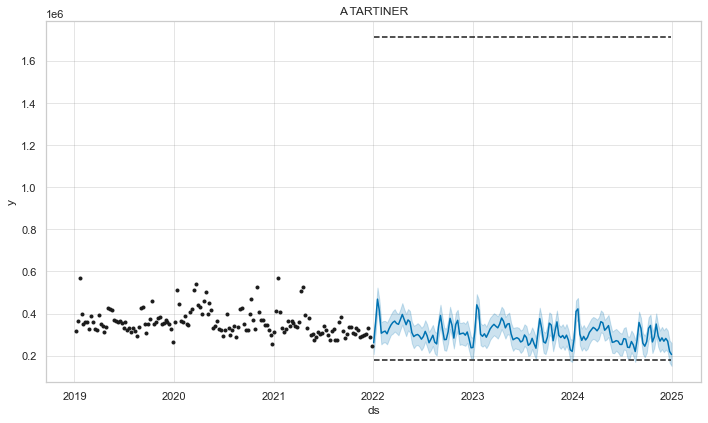

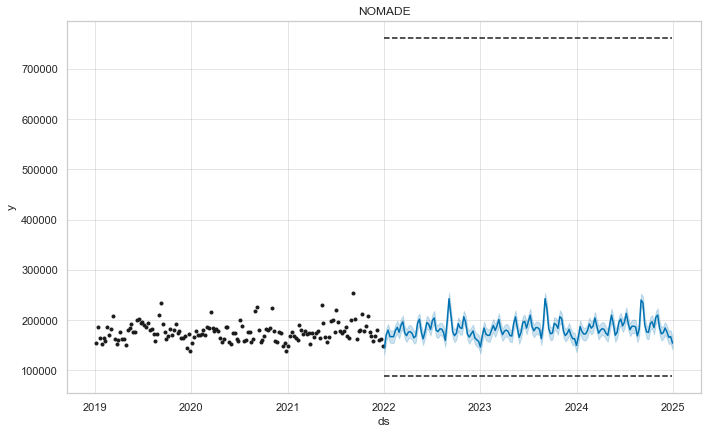

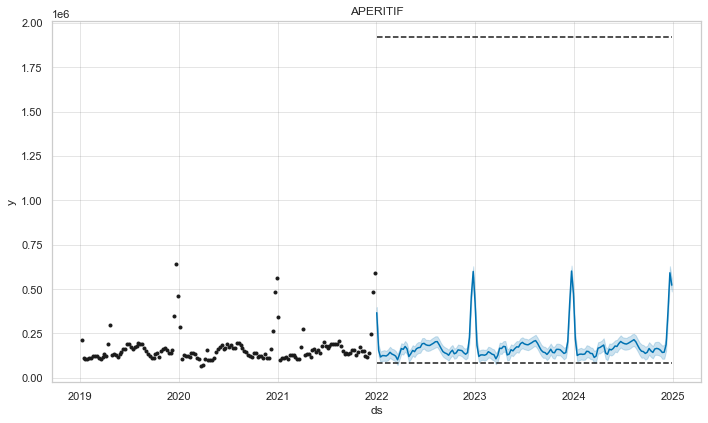

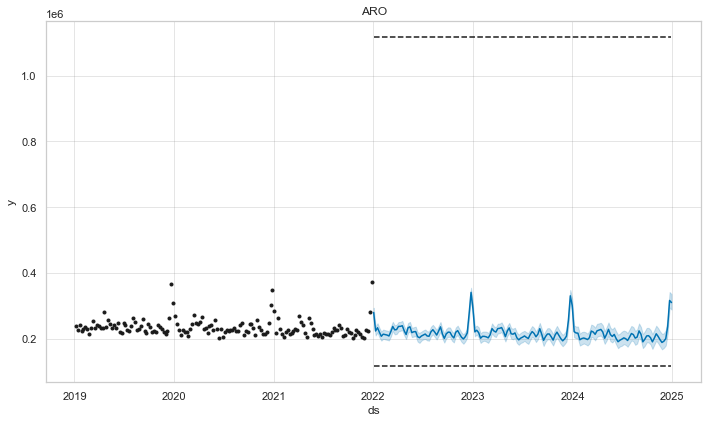

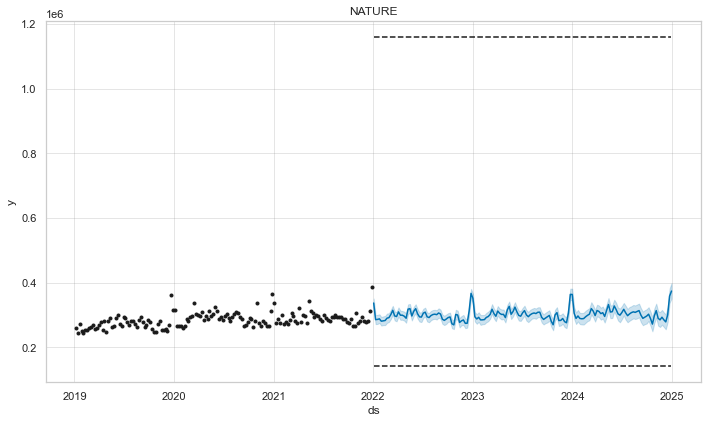

...

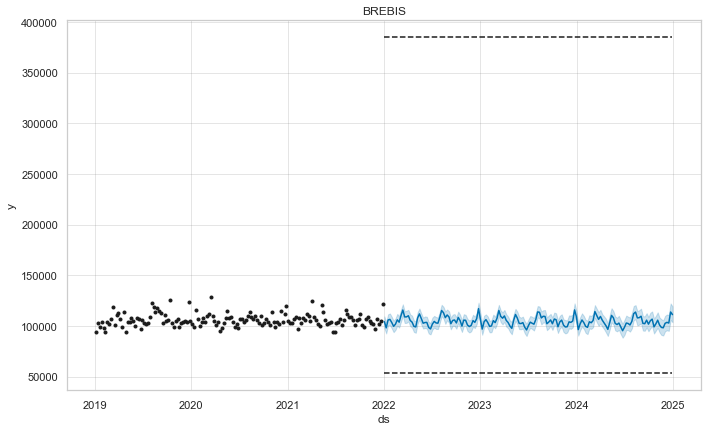

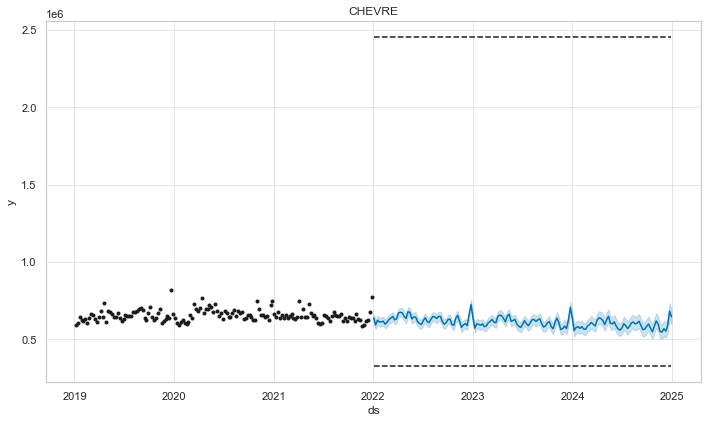

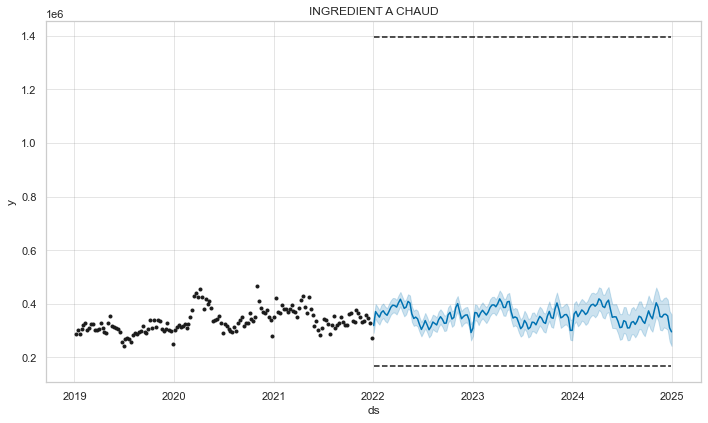

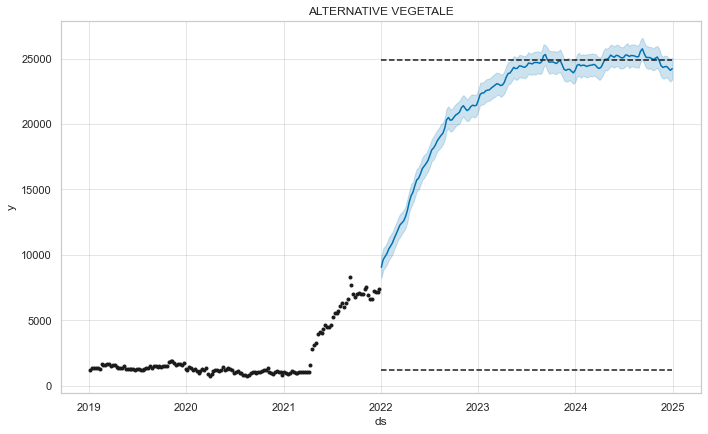

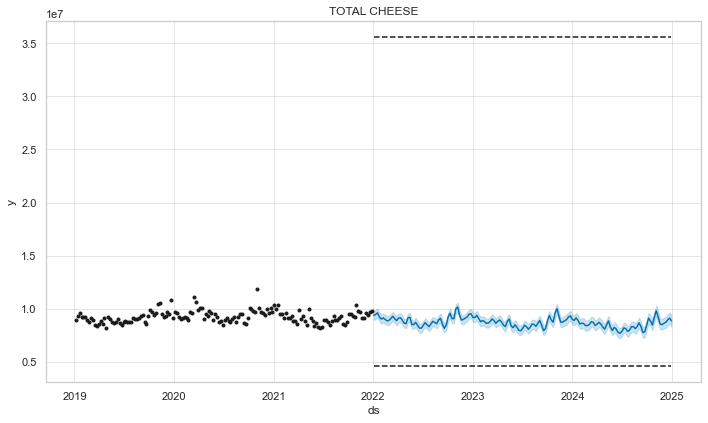

In [23]:
df_markets_fcst_res = forecasting_markets(df_markets, features_markets, periods=157, freq='W')

In [24]:
df_markets_fcst_res.tail()

,Date,A TARTINER,NOMADE,APERITIF,ARO,NATURE,RAPE,CHEVRE&BREBIS,A GOUT,ORIGINAL,...,BLOC,PATE PERSILLEE,CLASSIQUE,AOR REGIONAL,SPECIALITE A GOUT DOUX,BREBIS,CHEVRE,INGREDIENT A CHAUD,ALTERNATIVE VEGETALE,TOTAL CHEESE
308,2024-12-01,268604.334304,184545.736101,144251.838671,192056.410753,284810.537737,1.840234e+06,9841.014671,187082.971799,170034.473348,...,705401.747738,263183.942278,1.231380e+06,492481.382670,397729.783777,102524.466673,567679.474121,359616.556386,24374.502626,8.638839e+06
309,2024-12-08,281913.552334,176819.101883,187590.357235,199783.112387,278368.093925,1.868793e+06,9783.552619,187229.034780,168088.710935,...,698924.087931,279733.935272,1.207497e+06,481297.824497,408377.758059,103502.469079,551809.745626,360307.769290,24394.568690,8.733825e+06
310,2024-12-15,268838.941716,165980.092704,373738.617038,236609.307635,300419.403559,1.836203e+06,9597.740931,180205.340868,164755.193795,...,716301.849560,310084.391644,1.224389e+06,502329.875993,414138.738436,102815.740158,587499.591236,353821.888404,24256.621930,8.952703e+06
311,2024-12-22,220138.779406,167549.920933,591591.210566,316043.473512,358110.490392,1.674123e+06,8879.511424,152413.460447,151651.295680,...,736274.202741,342763.723220,1.212023e+06,592918.562478,458637.689212,113721.426736,681009.564947,309524.918787,24097.456672,9.130810e+06
312,2024-12-29,205418.789338,154535.743787,521858.385733,309717.872245,373759.655540,1.657316e+06,8292.137135,142238.830889,137855.874789,...,655490.791972,314642.364761,1.031157e+06,597963.272096,423596.300160,111142.541944,644039.010087,294598.260349,24225.211549,8.868333e+06


In [219]:
#df_markets_fcst_res.assign(Year=pd.to_datetime(df_markets_fcst_res.Date).dt.year).groupby('Year').sum().T.to_clipboard()

In [25]:
df_markets_fcst_res['Date'] = df_markets_fcst_res.Date.apply(lambda x: x.strftime('%Y-%m-%d'))
df_markets_fcst_res.round(1).to_excel("./results/FR/HMSM/fr_hmsm_usa_markets_forecasts.xlsx", index=False)

In [76]:
df_markets_results = pd.merge(df_gourmet_fcst_res, df_markets_fcst_res, on='Date')
df_markets_results.tail()

,Date,GOURMET BLOCK / WEDGE / ROUND,GOURMET CRUMBLED,GOURMET FRESH ITALIAN,GOURMET SHREDDED / GRATED,GOURMET SPREADS,CLASSIC SPREADS,CREAM CHEESE BLOCKS,CREAM CHEESE TUBS,ENTERTAINING TRAYS,...,EVERYDAY SHREDDED & GRATED,GOURMET,PIMENTO,RICOTTA AND FARMERS,SINGLE SERVE,SLICES,SNACK,SNACKING COMBOS,PLANT BASED,TOTAL CHEESE
361,2024-12-01,1.427448e+06,797798.310339,1.276152e+06,332751.871991,640425.132686,457319.756492,9.335321e+06,3.959608e+06,1.645872e+06,...,2.821070e+07,4.607664e+06,336115.187332,2.122262e+06,609.315736,1.422315e+07,7.314728e+06,4.581783e+06,479116.276372,9.314850e+07
362,2024-12-08,1.411002e+06,793358.807713,1.263219e+06,336799.541064,669862.273462,466362.910776,8.745482e+06,3.966325e+06,1.732246e+06,...,2.778234e+07,4.608752e+06,351566.226454,2.474562e+06,604.470550,1.419426e+07,7.373626e+06,4.727702e+06,474500.465954,9.188077e+07
363,2024-12-15,1.567934e+06,844270.306676,1.478951e+06,361769.869095,822161.719547,539899.423552,9.612026e+06,4.139455e+06,2.167063e+06,...,2.971123e+07,5.210300e+06,379563.625557,3.285347e+06,440.605670,1.436223e+07,7.360306e+06,4.614616e+06,487486.689125,9.793698e+07
364,2024-12-22,1.770080e+06,919427.255980,1.726741e+06,388134.488146,979540.584813,616995.884305,1.091916e+07,4.324110e+06,2.663926e+06,...,3.226533e+07,5.918810e+06,391749.670678,3.917995e+06,96.886920,1.462187e+07,7.283961e+06,4.326532e+06,507043.058425,1.059140e+08
365,2024-12-29,1.791477e+06,961966.501930,1.731182e+06,391959.910474,970586.778792,606311.259774,1.061566e+07,4.324926e+06,2.744565e+06,...,3.280496e+07,5.981270e+06,371538.883583,3.784911e+06,-102.376548,1.482039e+07,7.307407e+06,4.214736e+06,516293.924305,1.068928e+08


In [78]:
df_markets_results = df_markets_results[['Date', 'GOURMET BLOCK / WEDGE / ROUND', 'GOURMET CRUMBLED',
       'GOURMET FRESH ITALIAN', 'GOURMET SHREDDED / GRATED', 'GOURMET SPREADS', 'GOURMET',
       'CLASSIC SPREADS', 'CREAM CHEESE BLOCKS', 'CREAM CHEESE TUBS',
       'ENTERTAINING TRAYS', 'EVERYDAY BLOCKS', 'EVERYDAY SHREDDED & GRATED',
       'PIMENTO', 'RICOTTA AND FARMERS', 'SINGLE SERVE', 'SLICES',
       'SNACK', 'SNACKING COMBOS', 'PLANT BASED', 'TOTAL CHEESE']]

In [79]:
df_markets_results['Date'] = df_markets_results.Date.apply(lambda x: x.strftime('%Y-%m-%d'))

In [80]:
df_markets_results.to_excel("./results/usa_markets_forecasts.xlsx", index=False)

### Growth Drivers Past

- Distribution per : mean
- Price per volume per category : mean
- Competition price per category : mean
- Competition sales per category : sum


In [135]:
def growth_drivers(df_bel, df_markets, df_competition_brands, brands_name, brands_markets, controllable_features=False):
    dict_res = {'xgb_feature_importance': {}, 'permutation_importance': {}}
    competition_feats_cat = ['Competition price', 'Competition sales']
    compet_feats = []
    for brand in tqdm(brands_name, ascii=True, desc='Brands'):
        # Competition features
        feats_cat = [feat+'_'+cat for cat in brands_markets[brand] 
                     for feat in competition_feats_cat]
        df_tmp = df_bel[df_bel.Brand == brand]
        if not controllable_features:
            df_tmp = pd.merge(df_tmp, df_competition_brands[['Date'] + feats_cat], on='Date')
            df_tmp = pd.merge(df_tmp, df_markets[['Date'] + brands_markets[brand]], on='Date')
        
        if len(df_tmp) == 0:
            continue
        
        # Add competition features if df_tmp is not empty (eg: NURISHH for 2019, 2020, etc...) 
        compet_feats += feats_cat
        
        for key in dict_res:
            dict_res[key][brand] = {}
        
        df_tmp_X = df_tmp.drop(['Date', 'Brand', 'Sales in volume'], axis=1)
        X = df_tmp_X.values
        y = df_tmp['Sales in volume']

        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)
        xgb_model = XGBRegressor()
        xgb_model.fit(X_train, y_train)

        # XGB Feature importance
        feature_importances = xgb_model.feature_importances_
        sorted_idx_feat_imp = feature_importances.argsort()
        perm_importance = permutation_importance(xgb_model, X_test, y_test, n_repeats=25)
        sorted_idx_perm_imp = perm_importance.importances_mean.argsort()
        for idx_fi, idx_pi in zip(sorted_idx_feat_imp, sorted_idx_perm_imp):
            dict_res['xgb_feature_importance'][brand][df_tmp_X.columns[idx_fi]] = feature_importances[idx_fi] * 100
            dict_res['permutation_importance'][brand][df_tmp_X.columns[idx_pi]] = perm_importance['importances_mean'][idx_pi] * 100

    # Set compet feats, cause many brands are in the same markets. 
    # np.delete, in order to remove 'Sales in volume', and [2:], to remove Date and Brand
    if controllable_features:
        ordered_drivers = list(df_bel.columns[2:-1])
    else:
        bel_markets = list(set([elem for brand in dict_res['xgb_feature_importance'] for elem in brands_markets[brand]]))
        ordered_drivers = bel_markets + list(set(compet_feats)) + list(df_bel.columns[2:-1])
        
    print(ordered_drivers)
    for dict_imp in dict_res:
        dict_res[dict_imp] = pd.DataFrame(dict_res[dict_imp]).loc[ordered_drivers]
        
    return dict_res

def compute_growth_drivers_past(df, df_bel, brands_name, features, years=[2018, 2019, 2020, 2021], controllable_features=False):
    """
    """

    brands_markets = {brand: df[df.Brand == brand].Category.unique().tolist() for brand in brands_name}
    # Get markets dataframe
    df_markets = get_df_markets(df)
    # Computing competition price and sales for bel brands
    df_competition_brands = get_df_competition_brands(df, brands_name, features)
    df_competition_brands = df_competition_brands.groupby(['Date', 'Category']).agg(
        {'Price per volume': np.mean, 
         'Sales in volume':  np.sum}).unstack().rename(
        columns={'Price per volume': 'Competition price', 'Sales in volume': 'Competition sales'})
    df_competition_brands.columns = ['_'.join(elem) for elem in df_competition_brands.columns]
    df_competition_brands = df_competition_brands.reset_index()
    dict_res = {year:{} for year in years}
    
    for year in tqdm(years, ascii=True, desc='Years'):
        df_bel_year = df_bel[df_bel.Date.astype('datetime64[ns]').dt.year == year]
        df_compet_year = df_competition_brands[df_competition_brands.Date.astype('datetime64[ns]').dt.year == year]
        df_markets_year = df_markets[df_markets.Date.astype('datetime64[ns]').dt.year == year]
        
        dict_res[year] = growth_drivers(df_bel_year, df_markets_year, 
                                        df_compet_year, brands_name, brands_markets, 
                                        controllable_features=controllable_features)
        
    dict_res['all'] = growth_drivers(df_bel, df_markets, df_competition_brands, 
                                     brands_name, brands_markets, 
                                     controllable_features=controllable_features)
    
    return dict_res

In [27]:
df_bel_hmsm.head()

,Date,Brand,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation,Trends
0,2019-01-06,APERICUBE,13.433249,146366.553337,1.966178e+06,992.622737,1.081436e+06,44.38528,74.99087,29844.0375,627333.873400,0.0,1
1,2019-01-06,BABYBEL,8.210712,13123.628237,1.077543e+05,107.071512,1.508784e+06,683.15914,137.30146,205115.1500,806691.118450,0.0,6
2,2019-01-06,BOURSIN,18.187577,90328.415746,1.264901e+06,276.937777,9.410844e+05,33.81879,133.43824,41814.2575,414141.127425,0.0,32
3,2019-01-06,COUSTERON,8.088322,19412.541330,1.570149e+05,144.175736,1.393531e+05,0.00000,11.92763,2981.9075,24573.224600,0.0,0
4,2019-01-06,KIRI,9.307125,108616.422351,9.802176e+05,213.735119,1.419914e+06,43.41143,123.65016,41765.3975,700810.716475,0.0,27


In [30]:
# bel_features = ['Date', 'Brand', 'A&P', 'Price per volume', 'Rate of Innovation', 'Distribution', 'Trends', 'Sales in volume']
bel_features = ['Date', 'Brand', 'A&P', 'Price per volume', 'Distribution', 'Sales in volume']
dict_res = compute_growth_drivers_past(
    df_hmsm, df_bel_hmsm[bel_features], brands_name[country], features, 
    years=[2019, 2020, 2021], controllable_features=True)

Years:   0%|          | 0/3 [00:00<?, ?it/s]

Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


In [32]:
for year in dict_res:
    pd.DataFrame(dict_res[year]['xgb_feature_importance']).round(1).to_excel("results/FR/HMSM/fr_hmsm_growth_drivers_past_{}_controllable_features.xlsx".format(year))

### Growth Drivers Future

In [33]:
df_futures = pd.DataFrame()
for brand in feats_futures:
    feats_futures[brand]['ds'] = feats_futures[brand]['ds'].apply(lambda x: x.strftime("%Y-%m-%d"))
    df_tmp = pd.merge(feats_futures[brand].rename(columns={'ds':'Date'}), 
                     df_brands_fcst_res[['Date', brand]], on='Date').rename(
        columns={brand: 'Sales in volume'})
    df_tmp['Brand'] = brand
    df_futures = pd.concat([df_futures, df_tmp])

In [34]:
df_futures

,Date,A&P,Price per volume,Distribution,cap,floor,Sales in volume,Brand
0,2019-01-06,29844.037500,13.433249,992.622737,1.466558e+06,25539.226118,146366.553337,APERICUBE
1,2019-01-13,29844.037500,13.790680,948.364338,1.466558e+06,25539.226118,77416.328112,APERICUBE
2,2019-01-20,29844.037500,13.803891,931.931438,1.466558e+06,25539.226118,74628.923692,APERICUBE
3,2019-01-27,29844.037500,13.756032,926.602265,1.466558e+06,25539.226118,73392.476410,APERICUBE
4,2019-02-03,32382.817500,13.206180,941.857713,1.466558e+06,25539.226118,83403.581422,APERICUBE
...,...,...,...,...,...,...,...,...
191,2024-12-01,45184.622896,10.115975,80.080013,1.067834e+04,0.780000,26399.733712,NURISHH
192,2024-12-08,45312.271238,10.083302,80.382619,1.067834e+04,0.780000,26774.610103,NURISHH
193,2024-12-15,45439.919581,10.050629,80.685225,1.067834e+04,0.780000,26250.244271,NURISHH
194,2024-12-22,45567.567923,10.017955,80.987832,1.067834e+04,0.780000,27804.586789,NURISHH


In [36]:
dict_res_future = compute_growth_drivers_past(
    df_hmsm, df_futures[df_futures.Date > df_bel_hmsm.Date.iloc[-1]][bel_features], brands_name[country], features, 
    years=[2022, 2023, 2024], controllable_features=True)

Years:   0%|          | 0/3 [00:00<?, ?it/s]

Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


In [37]:
for year in dict_res_future:
    pd.DataFrame(dict_res_future[year]['xgb_feature_importance']).round(1).to_excel("results/FR/HMSM/fr_hmsm_growth_drivers_future_{}_controllable_features.xlsx".format(year))

## Ecommerce

In [38]:
df_ecom = pd.read_excel('data/FR/FR_Ecommerce_df_0503.xlsx')

In [39]:
df_bel_ecom = pd.read_excel('data/FR/FR_Ecommerce_df_bel_0703.xlsx')

In [40]:
df_ecom.describe()
df_bel_ecom.describe()

,Sales in value,Sales value with promo,Sales in volume,Sales volume with promo,Price with promo,Price without promo,Price per volume,Distribution
count,87318.000000,45639.000000,87318.000000,45639.000000,45639.000000,87250.000000,87318.000000,87318.000000
mean,17811.651507,5619.520280,1945.077006,619.173030,11.958159,14.231506,14.179536,51.781682
std,47890.459710,16681.448253,6024.294438,2086.077772,5.025813,6.712164,6.710862,90.240019
min,0.600000,0.990000,0.030000,0.035000,2.727273,1.530000,1.530000,0.000243
25%,199.602500,50.880000,12.480000,4.200000,8.461648,9.699861,9.642530,1.443442
50%,1696.250000,534.870000,126.635000,48.600000,10.984694,12.993094,12.944927,10.011376
75%,12853.159999,4082.810000,1143.100000,390.085000,14.138450,16.872630,16.800000,64.958532
max,881301.979961,492829.490000,135140.850000,75366.500000,79.333333,98.333333,98.333333,771.948480


,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation
count,1129.000000,1129.000000,1129.000000,1129.000000,1.129000e+03,1129.000000,1129.000000,1129.000000,1.129000e+03,1092.000000
mean,11.045787,9376.858891,88209.362691,143.917880,1.060139e+06,229.509399,103.898357,77876.954097,4.646682e+05,0.143722
std,3.048255,9250.440424,78754.755512,152.413410,7.222203e+05,268.752872,86.795816,78519.963476,3.647963e+05,0.260010
min,7.333232,0.600000,6.320000,0.019979,9.963594e+03,0.000000,0.180730,592.984000,-7.280536e+04,0.000000
25%,8.242429,2174.815000,15775.730000,74.674774,2.044453e+05,6.661720,11.861940,3653.205000,1.893983e+04,0.000000
50%,10.553766,6095.874000,76416.620000,103.199510,1.128969e+06,133.144520,102.791600,55694.004000,5.120645e+05,0.000000
75%,13.429809,14425.855000,144047.540002,120.128334,1.575680e+06,360.380160,152.967250,114648.415000,6.956743e+05,0.132775
max,18.247221,48207.217000,348912.690000,771.948480,3.595951e+06,1211.803060,451.671940,350675.730000,1.971895e+06,0.937351


### Forecasting Brands

#### No regressors

Features:   0%|          | 0/8 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inste

Initial log joint probability = -6.29096
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       311.509   1.20956e-05       99.5707      0.4324           1      127   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     126       311.512   7.87222e-06       98.0653   8.361e-08       0.001      198  LS failed, Hessian reset 
     176       311.513   3.49697e-09       74.5458    0.006311           1      261   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -8.96877
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      69        217.21     8.623e-09       81.1173      0.1107      0.1107      100   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -4.03768
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       274.074    1.4058e-05       83.8436       0.518       0.518      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     102       274.075   1.39182e-05       70.1169   1.353e-07       0.001      178  LS failed, Hessian reset 
     139       274.077      1.39e-06       92.9659   1.451e-08       0.001      259  LS failed, Hessian reset 
     167       274.077   2.54883e-07       85.4865    2.69e-09       0.001      332  LS failed, Hessian reset 
     182       274.077   7.09765e-09       83.1203      0.2234      0.2234      351   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -13.1769
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        222.99    8.6305e-06        78.489      0.4518      0.4518      134   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     114       222.993   2.35523e-05       74.0168   2.934e-07       0.001      187  LS failed, Hessian reset 
     140       222.994   6.88304e-09        76.697      0.2497      0.2497      220   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -10.3719
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      72       189.113     0.0025851        81.456   3.171e-05       0.001      126  LS failed, Hessian reset 
      99       189.257   1.42376e-05       80.7492           1           1      165   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     111       189.258   3.58566e-06       84.6504    4.92e-08       0.001      225  LS failed, Hessian reset 
     143       189.258   6.61524e-09       79.0536      0.3291     0.03291      267   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -16.9215
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       180.187   1.52656e-06       74.7255      0.6682      0.6682      133   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     133       180.188   9.88409e-09       76.4937      0.4671      0.4671      182   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -8.84701
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       287.417     0.0047685       100.739      0.6319      0.6319      119   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     163       313.232    0.00349292       104.364   3.521e-05       0.001      226  LS failed, Hessian reset 
     199       313.984   0.000407455       102.387      0.8259      0.8259      274   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     211       314.384    0.00160334       107.666   1.523e-05       0.001      340  LS failed, Hessian reset 
     289        314.86   9.20578e-09       99.9478      0.3816      0.3816      442   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentatio

Initial log joint probability = -11.2559
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      89       214.758   1.60044e-05       69.6961   1.872e-07       0.001      164  LS failed, Hessian reset 
      99        214.76   2.72222e-06       71.6682           1           1      180   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     152       214.793    0.00054717       95.5483   6.462e-06       0.001      287  LS failed, Hessian reset 
     199       214.819   5.32472e-07       77.1573           1           1      347   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     202       214.819   1.22074e-06       72.1451    1.46e-08       0.001      394  LS failed, Hessian reset 
     223       214.819   9.20471e-09       58.6982      0.2535       0.855      425   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was 

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


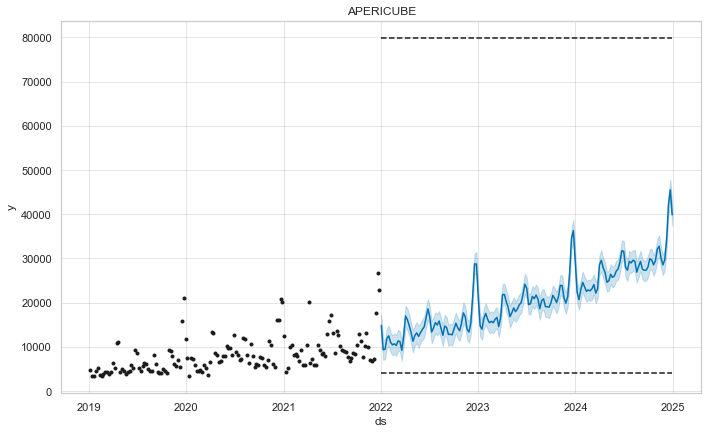

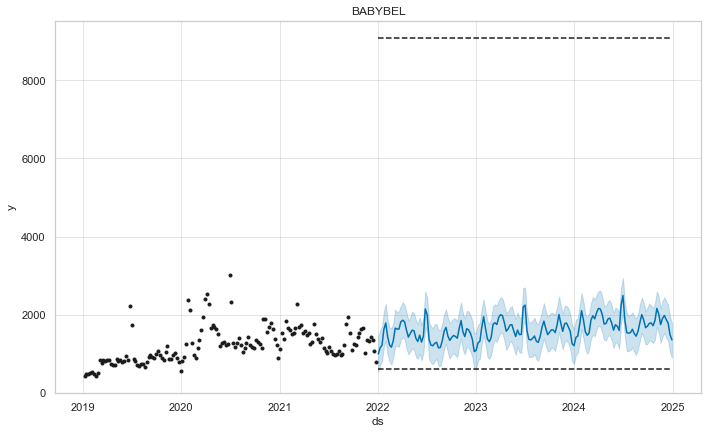

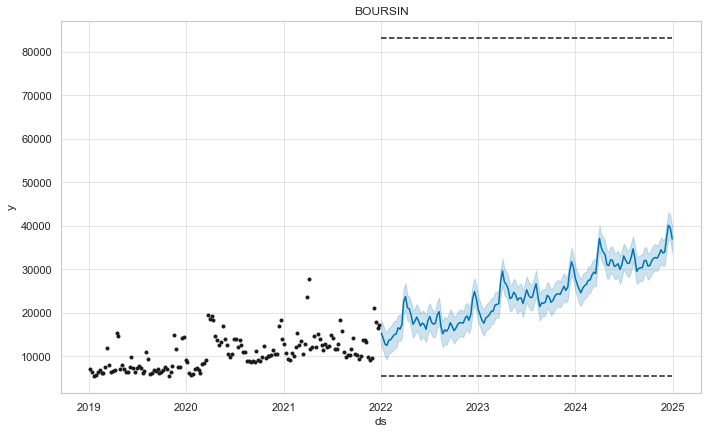

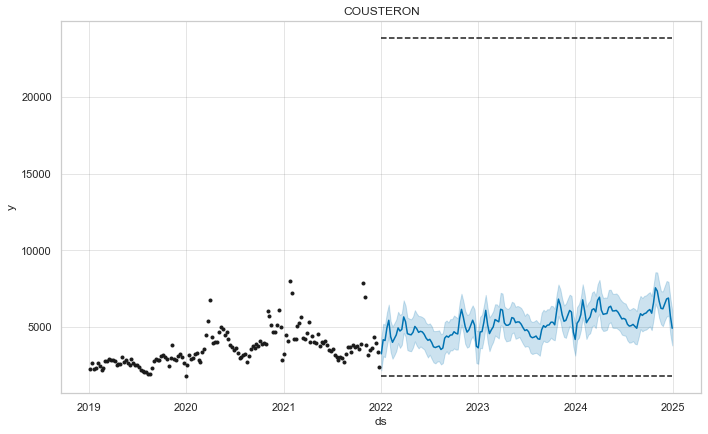

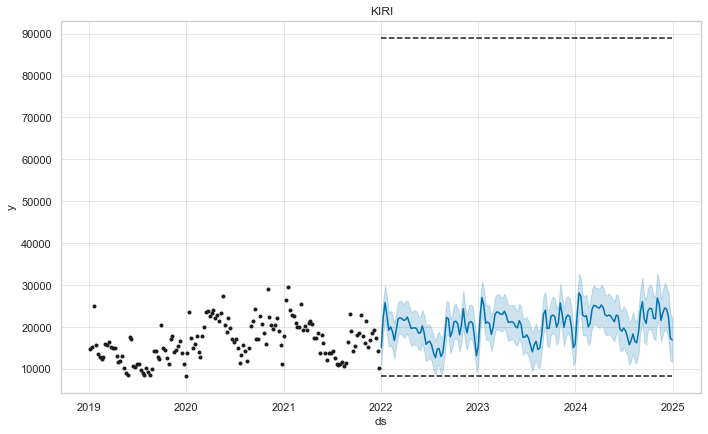

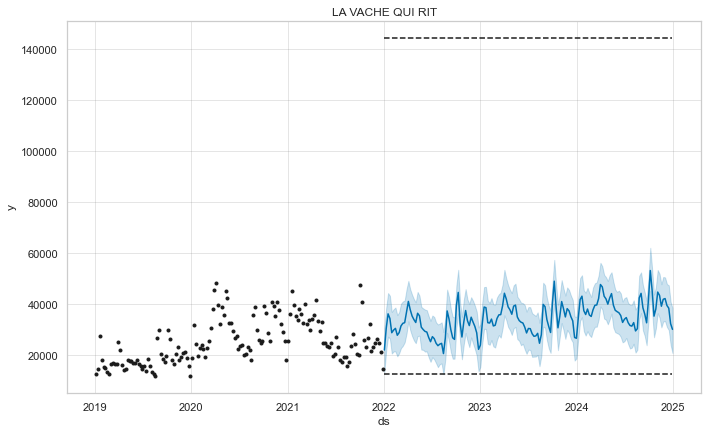

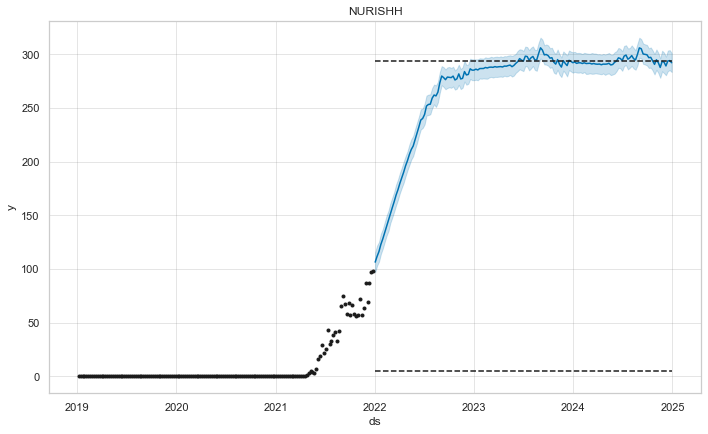

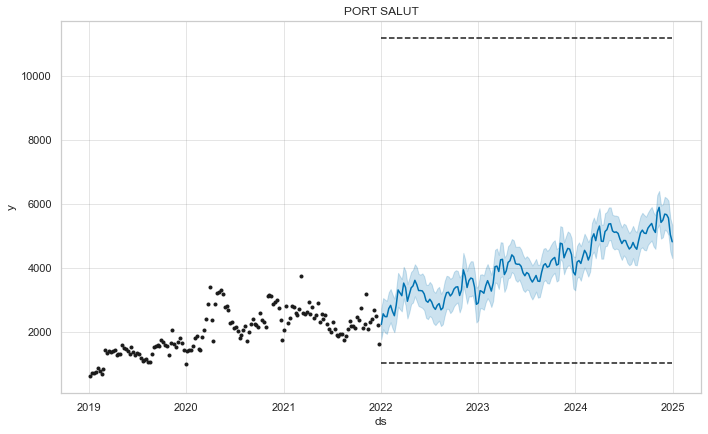

In [41]:
df_bel_brands = df_bel_ecom.groupby(["Date", "Brand"]).agg('sum')['Sales in volume'].unstack().reset_index()
df_bel_brands.columns.name=''
df_bel_brands = df_bel_brands.fillna(0)
df_bel_brands_fcst_res = forecasting_features(df_bel_brands, list(df_bel_brands.columns[1:]), periods=157, freq='W')

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
      dtype=object)

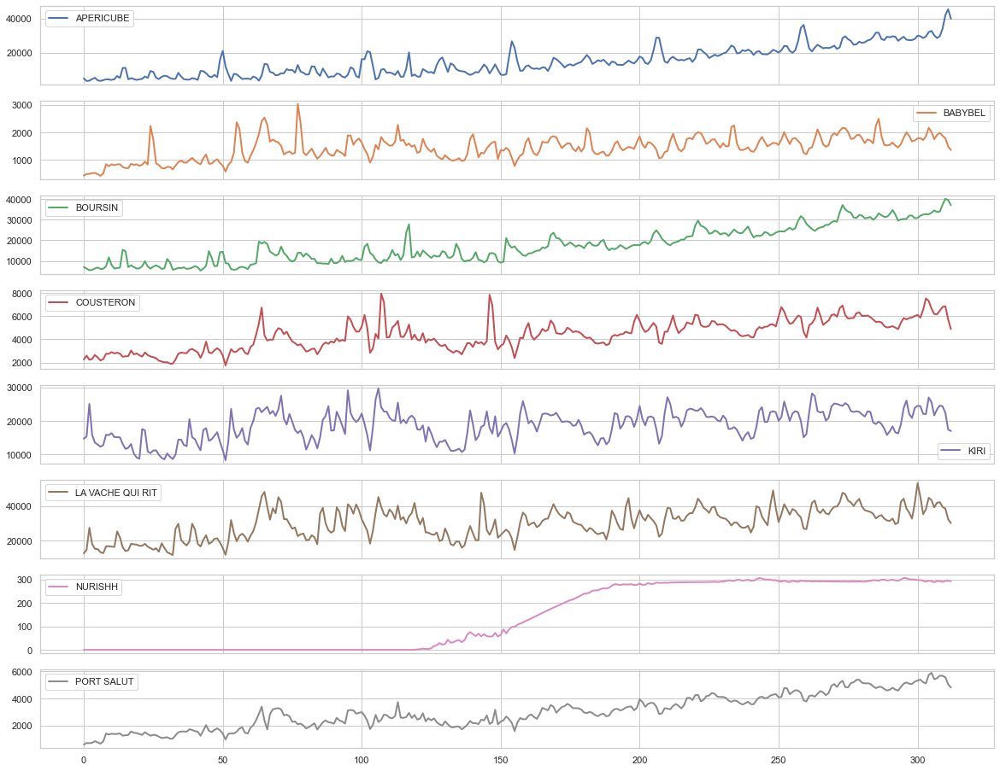

In [43]:
df_bel_brands_fcst_res.iloc[:, 1:].plot(subplots=True, linewidth=2, figsize=(20, 16))

In [44]:
df_bel_brands_fcst_res['Date'] = df_bel_brands_fcst_res.Date.apply(lambda x: x.strftime('%Y-%m-%d'))
df_bel_brands_fcst_res.round(1).to_excel("results/FR/Ecommerce/fr_ecom_brands_forecasts_no_regressors.xlsx", index=False)

#### With Regressors

In [45]:
df_bel_ecom['Trends'] = df_bel_ecom.apply(lambda x: df_trends[df_trends.Date == x.Date][x.Brand].values[0], axis=1)
df_bel_ecom.fillna(0, inplace=True)
df_bel_ecom.head()

,Date,Brand,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation,Trends
0,2019-01-06,APERICUBE,12.427241,4801.739,59672.37,370.936084,1.081436e+06,44.38528,74.99087,29844.0375,627333.873400,0.0,1
1,2019-01-06,BABYBEL,8.089450,432.980,3502.57,33.004683,1.508784e+06,683.15914,137.30146,205115.1500,806691.118450,0.0,6
2,2019-01-06,BOURSIN,17.521029,7134.816,87094.33,108.227360,9.410844e+05,33.81879,133.43824,41814.2575,414141.127425,0.0,32
3,2019-01-06,COUSTERON,7.755970,2258.660,17518.10,96.207483,1.393531e+05,0.00000,11.92763,2981.9075,24573.224600,0.0,0
4,2019-01-06,KIRI,8.947597,14656.445,127793.73,129.240933,1.419914e+06,43.41143,123.65016,41765.3975,700810.716475,0.0,27


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/c

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/c

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/c

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/c

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/c

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/prophet/plot.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
/U

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/c

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

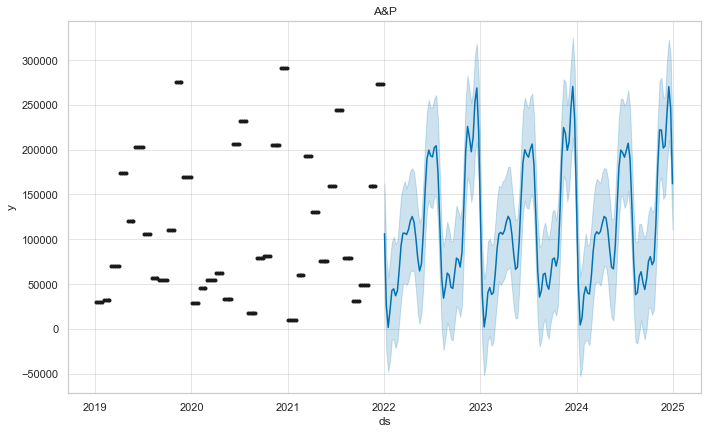

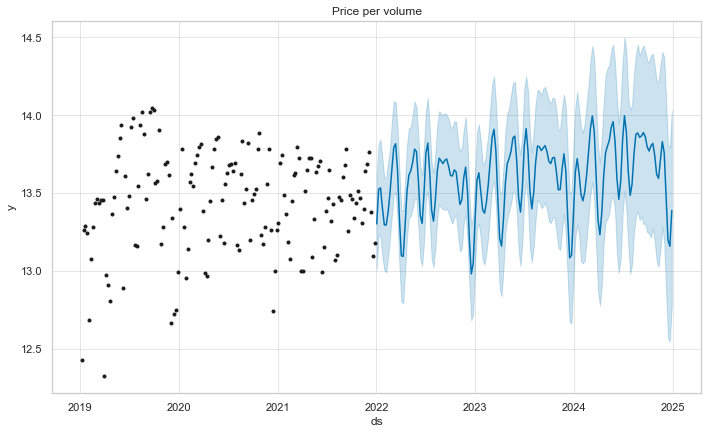

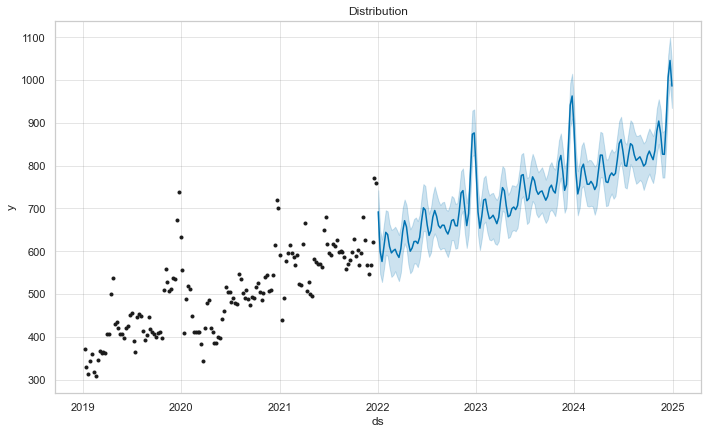

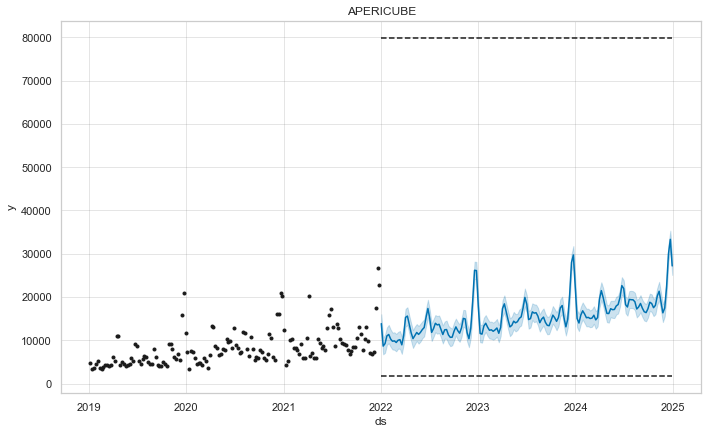

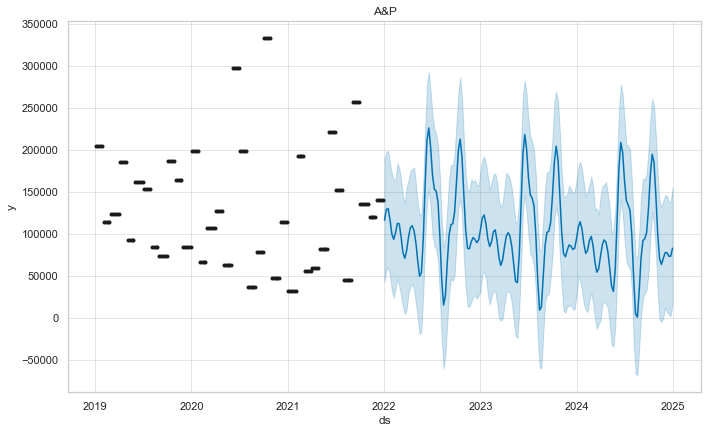

...

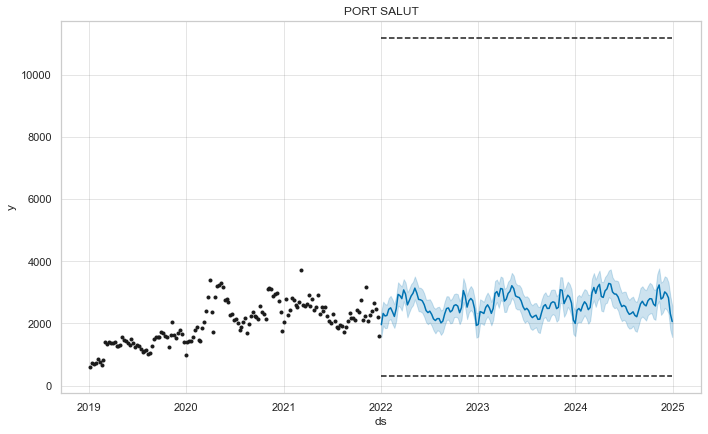

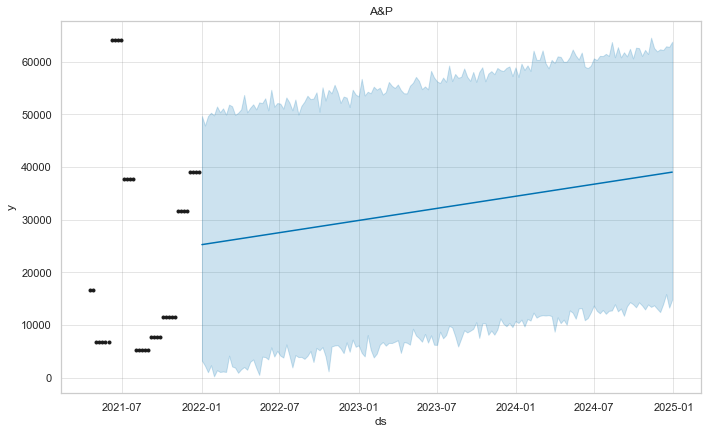

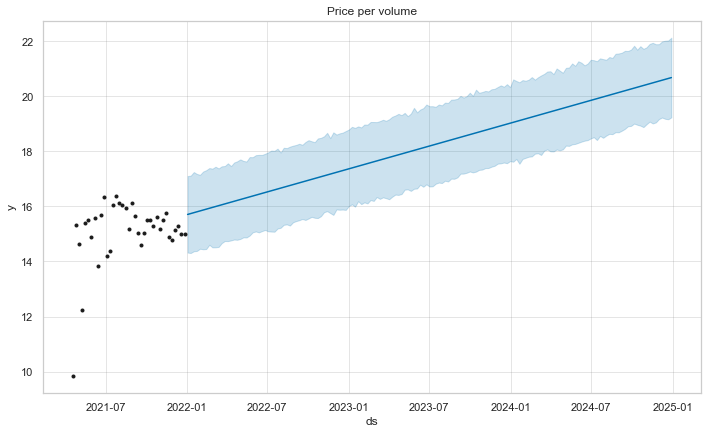

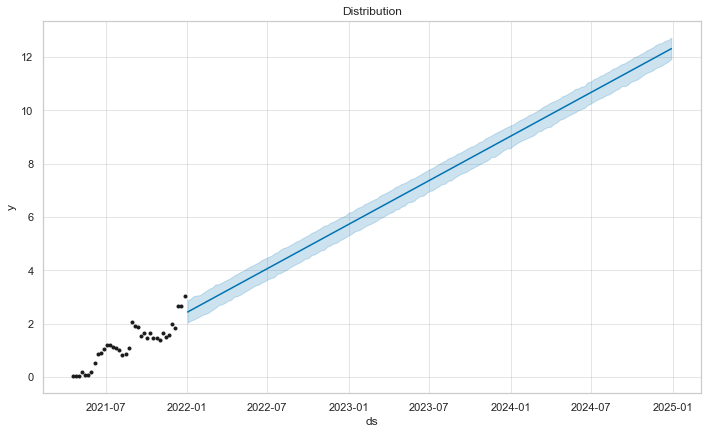

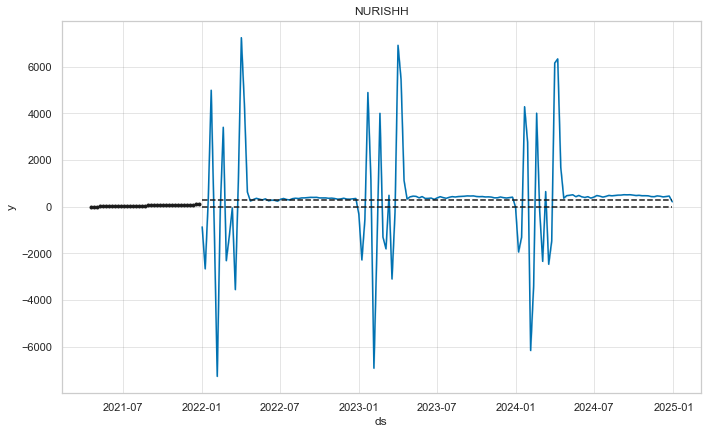

In [47]:
features_name = ['A&P', 'Price per volume', 'Distribution']
feats_futures, df_brands_fcst_res = forecasting_brands(df_bel_ecom, brands_name[country], features_name, periods=157, freq='W')

In [48]:
df_brands_fcst_res

,Date,APERICUBE,BABYBEL,BOURSIN,COUSTERON,KIRI,LA VACHE QUI RIT,PORT SALUT,NURISHH
0,2019-01-06,4801.739000,432.980000,7134.816000,2258.660000,14656.445000,12697.178000,599.490000,NaN
1,2019-01-13,3318.772000,490.740000,6351.666000,2593.740000,15309.811000,14641.526000,719.620000,NaN
2,2019-01-20,3479.458000,492.980000,5525.270000,2234.760000,25054.632000,27437.194000,705.935000,NaN
3,2019-01-27,4446.524000,521.060000,5710.164000,2306.180000,15806.024000,18033.361000,735.395000,NaN
4,2019-02-03,5220.052000,530.880000,6379.462000,2652.780000,13472.558000,15265.214000,851.355000,NaN
...,...,...,...,...,...,...,...,...,...
308,2024-12-01,17466.017646,1914.444085,29214.471523,6249.968318,23793.480752,16661.862709,3014.791110,444.842551
309,2024-12-08,22391.718835,1822.836241,32089.273396,6642.085459,22880.785537,14088.756236,2956.095928,415.729202
310,2024-12-15,29961.790895,1665.487249,33982.496405,6549.926149,21241.625528,10618.788658,2823.936325,435.438430
311,2024-12-22,33334.269062,1392.099109,33612.737284,5449.729121,16417.935724,5826.494219,2311.912485,452.061451


In [49]:
df_brands_fcst_res.fillna(0, inplace=True)
df_brands_fcst_res['Date'] = df_brands_fcst_res.Date.apply(lambda x: x.strftime('%Y-%m-%d'))
df_brands_fcst_res.round(1).to_excel("results/FR/Ecommerce/fr_ecom_brands_forecasts_with_regressors.xlsx", index=False)

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

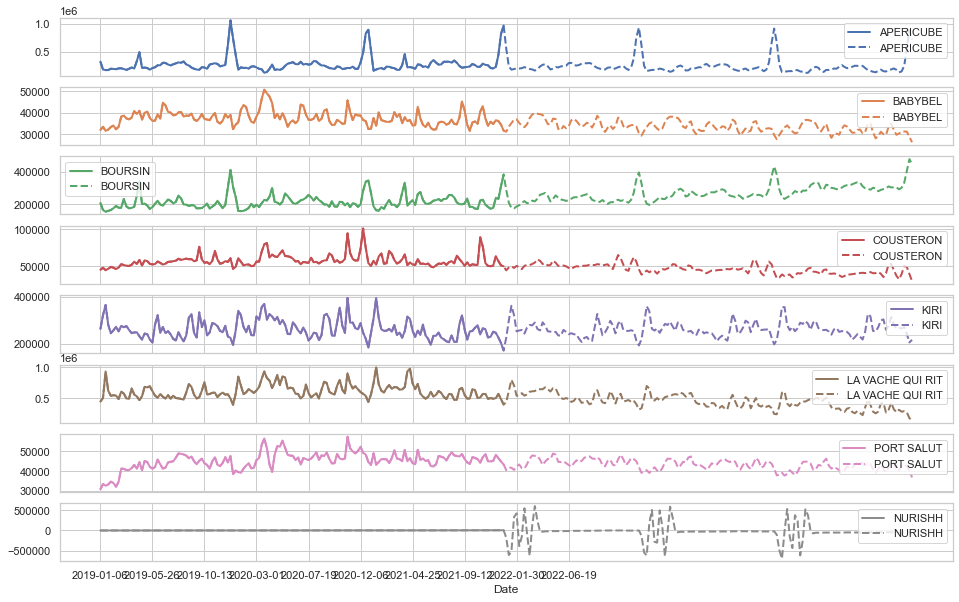

In [13]:
ax = df_brands_fcst_res.set_index("Date").loc['2017-12-31':'2021-12-26'].plot(linewidth=2, subplots=True, figsize=(16, 10))
df_brands_fcst_res.set_index("Date").plot(linewidth=2, linestyle='--', subplots=True, figsize=(16, 10), ax=ax)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

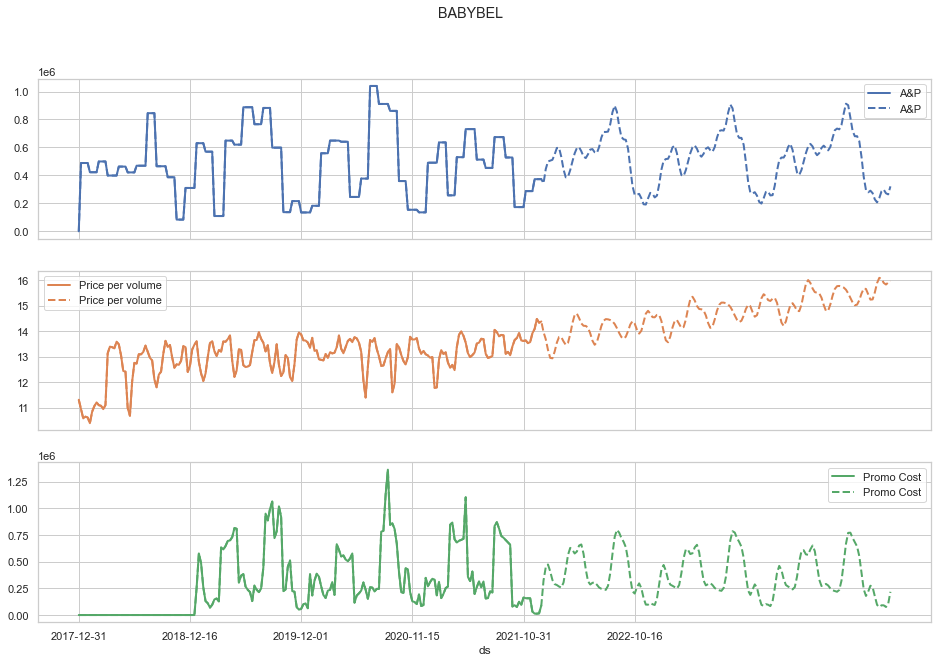

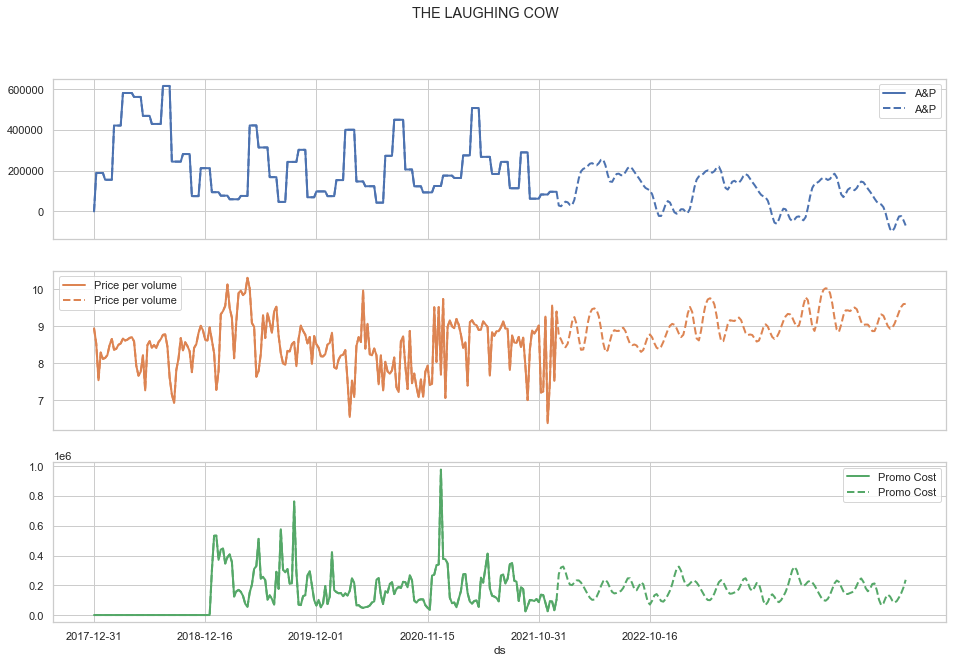

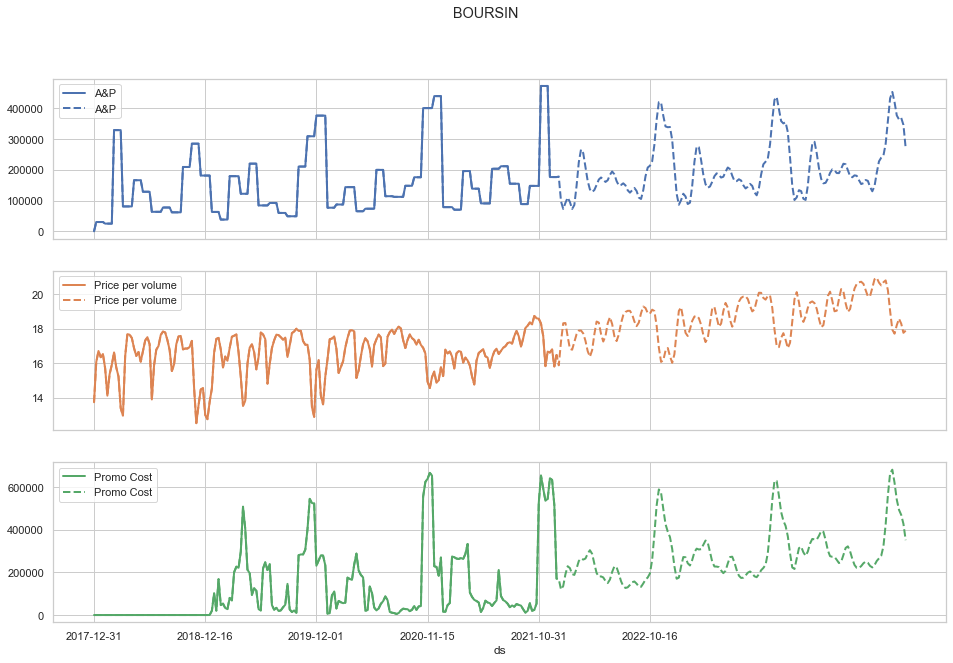

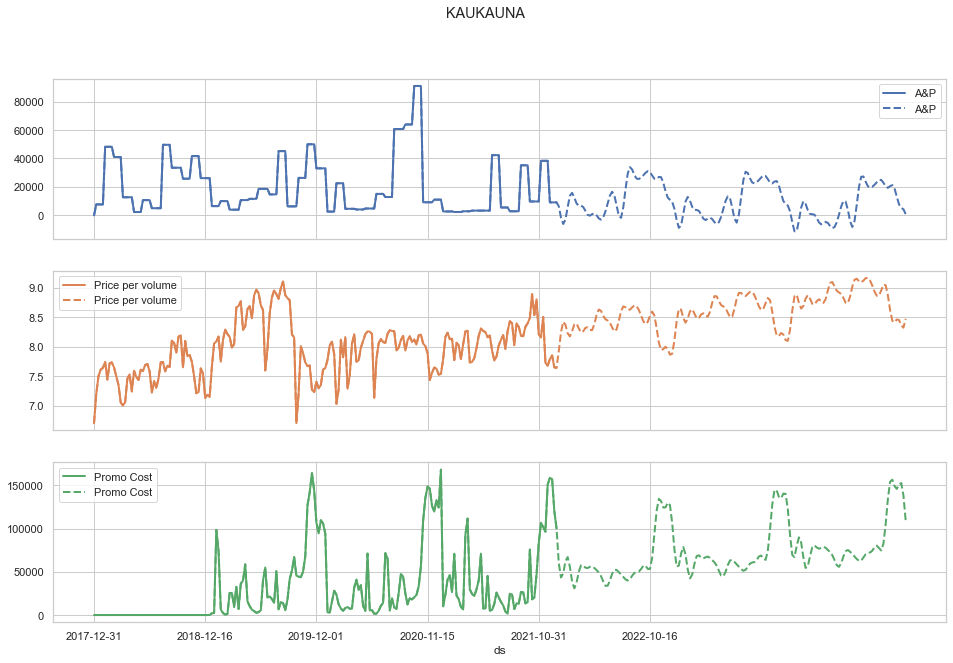

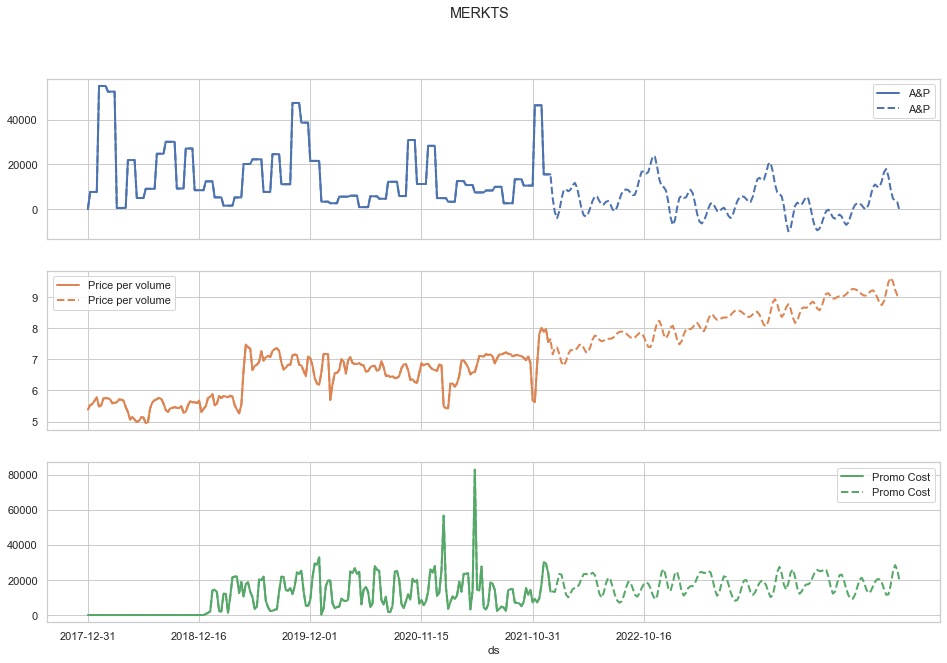

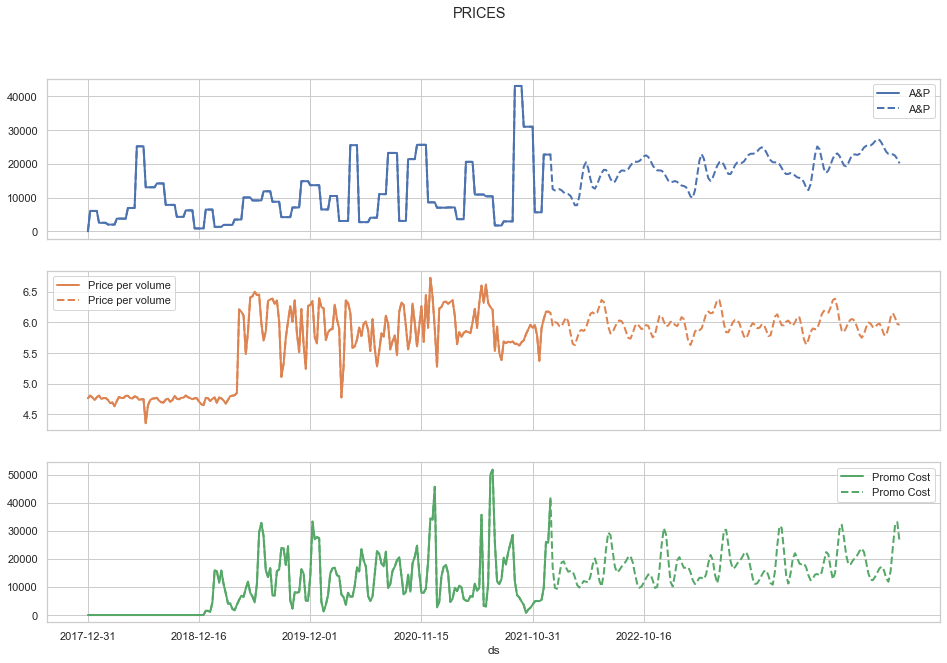

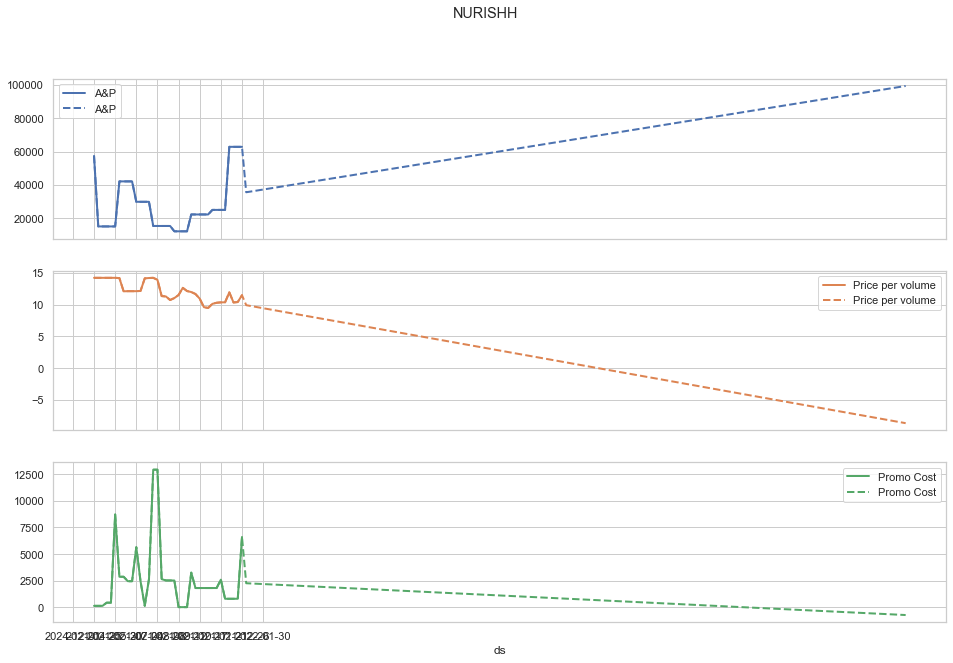

In [123]:
for brand in feats_futures:
    ax = feats_futures[brand].set_index('ds').loc['2017-12-31':'2021-12-26'].plot(subplots=True, figsize=(16, 10), title=brand, linewidth=2);
    feats_futures[brand].set_index('ds').plot(
        subplots=True, figsize=(16, 10), title=brand, 
        linestyle='--', linewidth=2, ax=ax);

### Forecasting Markets

In [50]:
features_markets = list(df_ecom.Category.unique()) + ['TOTAL CHEESE']
df_markets = get_df_markets(df_ecom)
df_markets.head()

,Date,A GOUT,A TARTINER,ALTERNATIVE VEGETALE,AOR REGIONAL,APERITIF,ARO,BLOC,BREBIS,CHEVRE,...,INGREDIENT A CHAUD,NATURE,NOMADE,ORIGINAL,PATE PERSILLEE,PLAT CHAUD,RAPE,SALADE,SPECIALITE A GOUT DOUX,TOTAL CHEESE
0,2019-01-06,12983.640,28010.819,8.700,25014.895,7218.005,15498.755,76220.619,8860.027,46423.3135,...,29239.375,23772.680,16044.820,8345.910,15112.3195,84501.302,201320.205,31357.638,35353.729,750833.4370
1,2019-01-13,14713.780,30633.404,10.700,31618.544,5016.253,17186.809,90801.723,10641.506,53778.6855,...,32278.350,25334.970,18916.331,9676.995,18003.7230,93384.024,221592.800,33229.649,40293.365,850807.9715
2,2019-01-20,14682.715,52073.530,14.725,36045.685,5125.300,21075.998,102051.796,10547.004,59125.0850,...,30246.975,32084.005,20059.025,9386.185,20140.5453,103926.057,223769.705,32440.745,55091.770,943955.5653
3,2019-01-27,17367.370,34232.944,9.600,34912.022,5920.790,17119.261,96379.333,13090.348,56708.3570,...,39555.155,28690.005,18269.900,10357.845,18618.8550,96781.537,222564.010,32487.997,48941.755,899836.6740
4,2019-02-03,17162.620,30499.153,13.980,34375.598,6760.856,18166.766,108654.836,12901.834,60255.1895,...,43124.885,28166.750,24053.566,11294.020,22149.9200,98637.249,249003.920,35817.517,45228.975,958815.9795


Features:   0%|          | 0/21 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inste

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Dat

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Dat

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Dat

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/prophet/plot.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


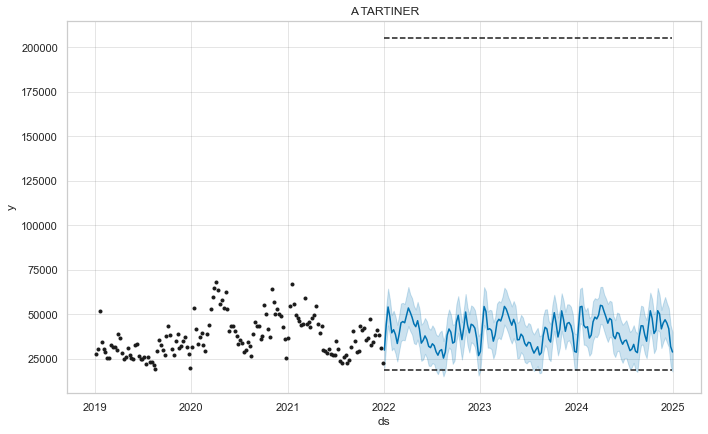

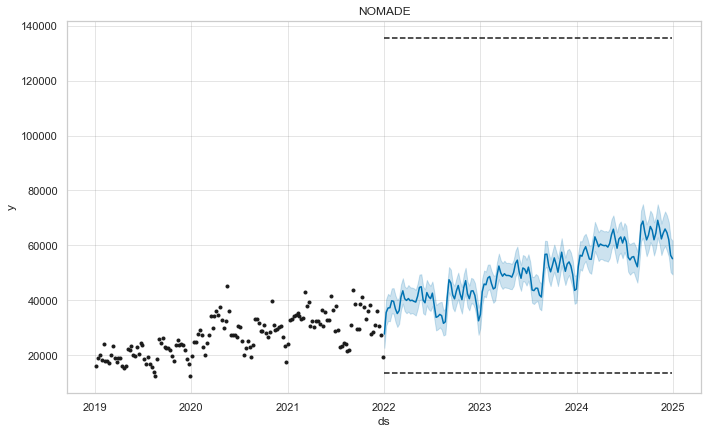

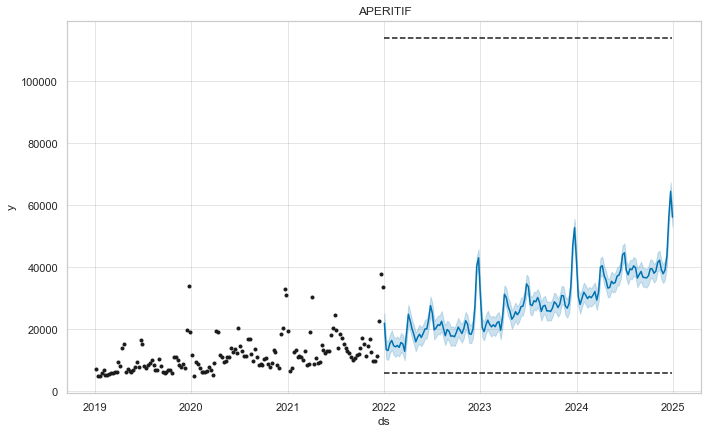

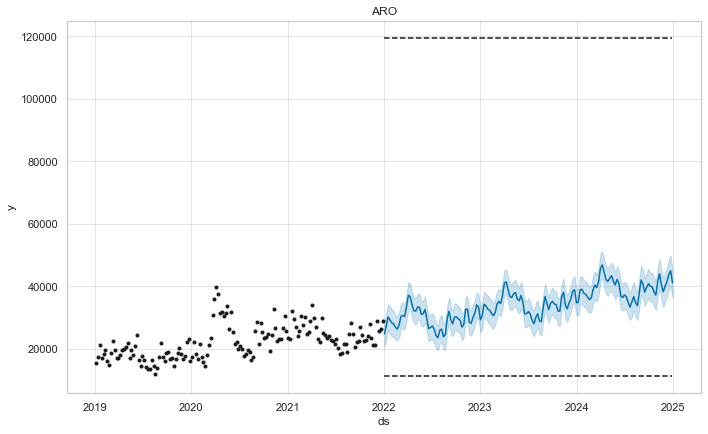

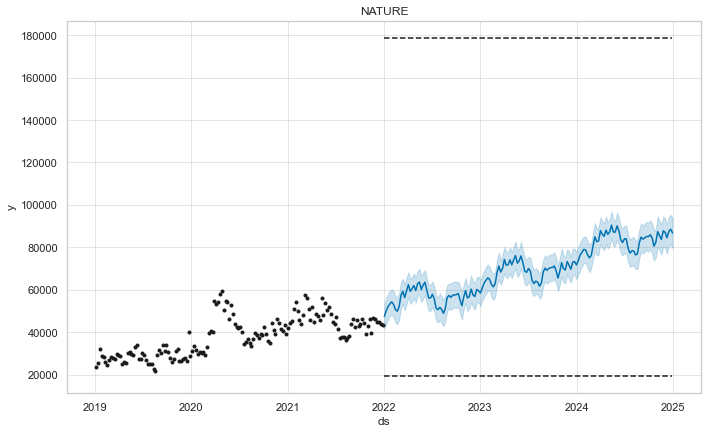

...

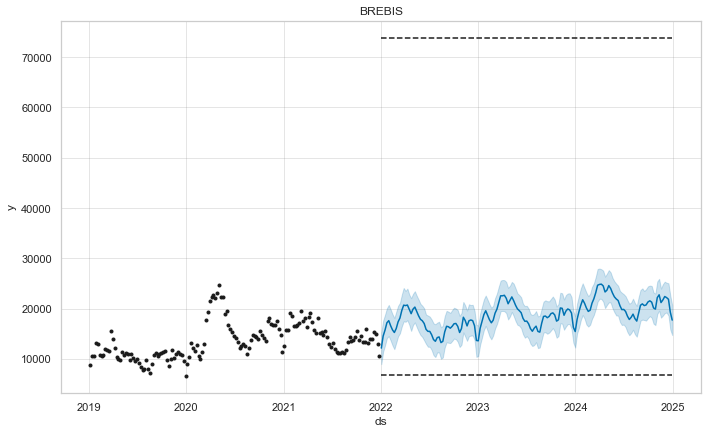

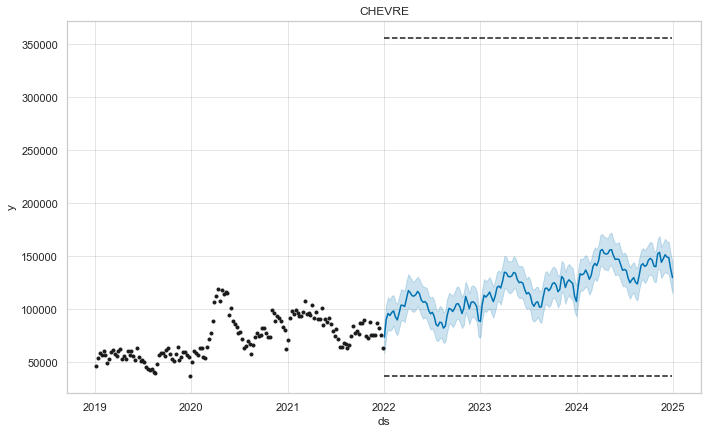

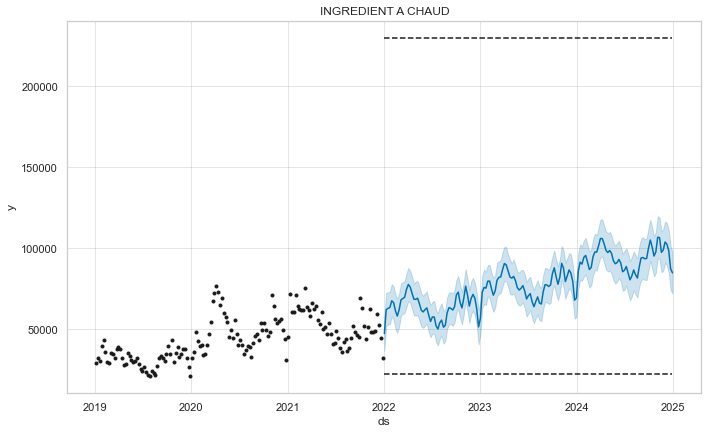

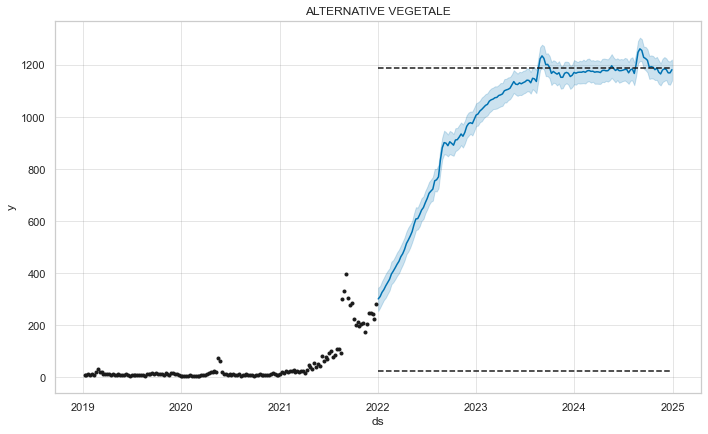

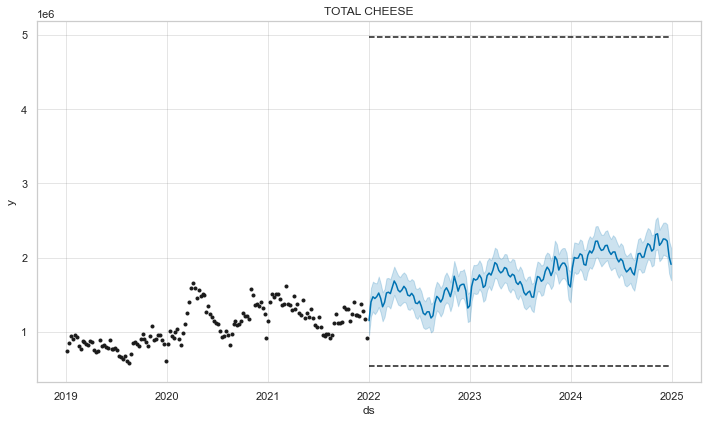

In [51]:
df_markets_fcst_res = forecasting_markets(df_markets, features_markets, periods=157, freq='W')

In [52]:
df_markets_fcst_res.tail()

,Date,A TARTINER,NOMADE,APERITIF,ARO,NATURE,RAPE,CHEVRE&BREBIS,A GOUT,ORIGINAL,...,BLOC,PATE PERSILLEE,CLASSIQUE,AOR REGIONAL,SPECIALITE A GOUT DOUX,BREBIS,CHEVRE,INGREDIENT A CHAUD,ALTERNATIVE VEGETALE,TOTAL CHEESE
308,2024-12-01,47004.637979,65974.506207,39235.831117,40015.316553,87135.168811,530854.506125,1058.292957,42925.312536,45007.364668,...,184311.062097,53515.654233,222370.460888,113957.862919,106799.946440,22405.427139,151401.159284,103850.019855,1185.226951,2.253359e+06
309,2024-12-08,45066.260478,64663.862696,43676.885774,41368.468099,84491.694342,531496.215729,1038.949433,43500.760735,45157.640816,...,182641.758816,54243.533936,220715.085351,109862.240914,107630.937254,22186.426856,149314.963544,102472.585808,1182.598248,2.248554e+06
310,2024-12-15,41952.644393,62074.045792,56010.477342,43701.355008,87443.849141,519214.951743,998.967552,41912.154359,43459.129426,...,181383.799739,55353.145171,215567.718272,110011.089536,104069.944885,21858.408526,148648.472322,98444.164915,1169.894520,2.223920e+06
311,2024-12-22,31963.621012,56401.270068,64537.551400,44954.085596,88596.600482,451544.654199,867.778673,35226.306483,39524.119747,...,163137.516669,51312.522203,189506.664338,104829.682752,93165.118182,19274.554732,138231.001523,87316.203869,1169.605969,2.011021e+06
312,2024-12-29,28888.844167,55162.347794,56229.258929,41124.277885,86827.544099,434055.961376,800.420556,35852.715734,38815.605028,...,147040.396488,47280.148854,171397.468699,99484.037531,86294.446473,17715.916559,129984.587899,84797.890189,1181.887667,1.910461e+06


In [219]:
#df_markets_fcst_res.assign(Year=pd.to_datetime(df_markets_fcst_res.Date).dt.year).groupby('Year').sum().T.to_clipboard()

In [53]:
#df_markets_fcst_res['Date'] = df_markets_fcst_res.Date.apply(lambda x: x.strftime('%Y-%m-%d'))
df_markets_fcst_res.round(1).to_excel("./results/FR/Ecommerce/fr_ecom_markets_forecasts.xlsx", index=False)

### Growth Drivers Past

In [77]:
df_bel_ecom.head()

,Date,Brand,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation,Trends
0,2019-01-06,APERICUBE,13.131324,317063.709040,4.270993e+06,681.779410,1.081436e+06,44.38528,74.99087,29844.0375,627333.873400,0.0,1
1,2019-01-06,BABYBEL,8.278697,31992.483765,2.686242e+05,70.038097,1.508784e+06,683.15914,137.30146,205115.1500,806691.118450,0.0,6
2,2019-01-06,BOURSIN,18.001748,207758.221914,2.881462e+06,192.582568,9.410844e+05,33.81879,133.43824,41814.2575,414141.127425,0.0,32
3,2019-01-06,COUSTERON,7.988248,45179.037323,3.654272e+05,120.191609,1.393531e+05,0.00000,11.92763,2981.9075,24573.224600,0.0,0
4,2019-01-06,KIRI,9.245133,262535.235110,2.394732e+06,171.488026,1.419914e+06,43.41143,123.65016,41765.3975,700810.716475,0.0,27


In [56]:
# Use this with controllable_features param to False
#bel_features = ['Date', 'Brand', 'A&P', 'Price per volume', 'Rate of Innovation', 'Distribution', 'Trends', 'Sales in volume']
# Use this with controllable_features param to True
bel_features = ['Date', 'Brand', 'A&P', 'Price per volume', 'Distribution', 'Sales in volume']
dict_res = compute_growth_drivers_past(
    df_ecom, df_bel_ecom[bel_features], brands_name[country], features, 
    years=[2019, 2020, 2021], controllable_features=True)

Years:   0%|          | 0/3 [00:00<?, ?it/s]

Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


In [57]:
for year in dict_res:
    pd.DataFrame(dict_res[year]['xgb_feature_importance']).round(1).to_excel("results/FR/Ecommerce/fr_ecom_growth_drivers_past_{}_controllable_features.xlsx".format(year))

### Growth Drivers Future

In [58]:
df_futures = pd.DataFrame()
for brand in feats_futures:
    feats_futures[brand]['ds'] = feats_futures[brand]['ds'].apply(lambda x: x.strftime("%Y-%m-%d"))
    df_tmp = pd.merge(feats_futures[brand].rename(columns={'ds':'Date'}), 
                     df_brands_fcst_res[['Date', brand]], on='Date').rename(
        columns={brand: 'Sales in volume'})
    df_tmp['Brand'] = brand
    df_futures = pd.concat([df_futures, df_tmp])

In [59]:
df_futures

,Date,A&P,Price per volume,Distribution,cap,floor,Sales in volume,Brand
0,2019-01-06,29844.037500,12.427241,370.936084,79946.667,1659.386,4801.739000,APERICUBE
1,2019-01-13,29844.037500,13.264931,329.556856,79946.667,1659.386,3318.772000,APERICUBE
2,2019-01-20,29844.037500,13.288475,313.516206,79946.667,1659.386,3479.458000,APERICUBE
3,2019-01-27,29844.037500,13.242600,343.897772,79946.667,1659.386,4446.524000,APERICUBE
4,2019-02-03,32382.817500,12.686734,358.993665,79946.667,1659.386,5220.052000,APERICUBE
...,...,...,...,...,...,...,...,...
189,2024-12-01,38665.664464,20.553003,12.051789,294.000,0.300,444.842551,NURISHH
190,2024-12-08,38753.907471,20.584875,12.115072,294.000,0.300,415.729202,NURISHH
191,2024-12-15,38842.150477,20.616747,12.178356,294.000,0.300,435.438430,NURISHH
192,2024-12-22,38930.393484,20.648618,12.241639,294.000,0.300,452.061451,NURISHH


In [60]:
dict_res_future = compute_growth_drivers_past(
    df_ecom, df_futures[df_futures.Date > df_bel_ecom.Date.iloc[-1]][bel_features], brands_name[country], features, 
    years=[2022, 2023, 2024], controllable_features=True)

Years:   0%|          | 0/3 [00:00<?, ?it/s]

Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


In [61]:
for year in dict_res_future:
    pd.DataFrame(dict_res_future[year]['xgb_feature_importance']).round(1).to_excel("results/FR/Ecommerce/fr_ecom_growth_drivers_future_{}_controllable_features.xlsx".format(year))

## Total

In [122]:
df = pd.read_excel('data/FR/FR_Total GMS_df_0503.xlsx')

In [123]:
df_bel = pd.read_excel('data/FR/FR_Total GMS_df_bel_0703.xlsx')

In [99]:
brands_markets = {brand: df[df.Brand == brand].Category.unique().tolist() for brand in brands_name[country]}
bel_markets = list(set([elem for brand in brands_markets for elem in brands_markets[brand]]))
brands_markets
bel_markets

{'APERICUBE': ['APERITIF'],
 'BABYBEL': ['SPECIALITE A GOUT DOUX'],
 'BOURSIN': ['APERITIF',
  'ARO',
  'NATURE',
  'SALADE',
  'PLAT CHAUD',
  'INGREDIENT A CHAUD'],
 'COUSTERON': ['SPECIALITE A GOUT DOUX'],
 'KIRI': ['A TARTINER', 'NOMADE'],
 'LA VACHE QUI RIT': ['A TARTINER', 'NOMADE', 'INGREDIENT A CHAUD'],
 'PORT SALUT': ['A GOUT', 'SPECIALITE A GOUT DOUX'],
 'NURISHH': ['ALTERNATIVE VEGETALE']}

['APERITIF',
 'A GOUT',
 'PLAT CHAUD',
 'ALTERNATIVE VEGETALE',
 'A TARTINER',
 'ARO',
 'NATURE',
 'SPECIALITE A GOUT DOUX',
 'SALADE',
 'INGREDIENT A CHAUD',
 'NOMADE']

In [65]:
df_bel.head()

,Date,Brand,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation
0,2019-01-06,APERICUBE,13.533482,165895.416703,2.245143e+06,NaN,1.081436e+06,44.38528,74.99087,29844.0375,627333.873400,0.0
1,2019-01-06,BABYBEL,8.535930,18435.875528,1.573673e+05,NaN,1.508784e+06,683.15914,137.30146,205115.1500,806691.118450,0.0
2,2019-01-06,BOURSIN,18.296640,110294.990168,1.529467e+06,NaN,9.410844e+05,33.81879,133.43824,41814.2575,414141.127425,0.0
3,2019-01-06,COUSTERON,8.120451,23507.835993,1.908942e+05,NaN,1.393531e+05,0.00000,11.92763,2981.9075,24573.224600,0.0
4,2019-01-06,KIRI,9.480677,139262.367759,1.286720e+06,NaN,1.419914e+06,43.41143,123.65016,41765.3975,700810.716475,0.0


In [66]:
df.describe()
df_bel.describe()

,Sales in value,Sales value with promo,Sales in volume,Sales volume with promo,Price with promo,Price without promo,Price per volume,Distribution
count,1.069670e+05,0.0,106967.000000,0.0,0.0,0.0,106967.000000,0.0
mean,1.935003e+05,NaN,20318.074720,NaN,NaN,NaN,14.734321,NaN
std,4.924091e+05,NaN,59641.215086,NaN,NaN,NaN,7.074416,NaN
min,1.000000e-02,NaN,0.024000,NaN,NaN,NaN,0.062500,NaN
25%,3.461087e+03,NaN,218.363029,NaN,NaN,NaN,9.989110,NaN
50%,2.365812e+04,NaN,1793.398659,NaN,NaN,NaN,13.496039,NaN
75%,1.461108e+05,NaN,11682.328047,NaN,NaN,NaN,17.610070,NaN
max,7.777488e+06,NaN,977193.890587,NaN,NaN,NaN,96.363018,NaN


,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation
count,1131.000000,1131.000000,1.131000e+03,0.0,1.131000e+03,1131.000000,1131.000000,1131.000000,1.131000e+03,1092.000000
mean,11.486856,109467.164334,1.103284e+06,NaN,1.058283e+06,229.188806,103.747412,77768.751282,4.638569e+05,0.143722
std,3.124727,106479.361080,9.688274e+05,NaN,7.229281e+05,268.623043,86.793164,78492.594610,3.649831e+05,0.260010
min,7.493026,1.560000,3.091000e+01,NaN,9.963594e+03,0.000000,0.180730,592.984000,-7.280536e+04,0.000000
25%,8.655245,24289.932150,2.025676e+05,NaN,2.043916e+05,6.661720,11.861940,3653.205000,1.893983e+04,0.000000
50%,10.573912,97872.571139,1.262874e+06,NaN,1.128969e+06,131.449130,102.791600,55694.004000,5.120645e+05,0.000000
75%,13.935810,141632.426849,1.695484e+06,NaN,1.572085e+06,360.380160,152.967250,114648.415000,6.935805e+05,0.132775
max,21.725000,552835.182464,7.294526e+06,NaN,3.595951e+06,1211.803060,451.671940,350675.730000,1.971895e+06,0.937351


### Forecasting Brands

#### No regressors

Features:   0%|          | 0/8 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inste

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Dat

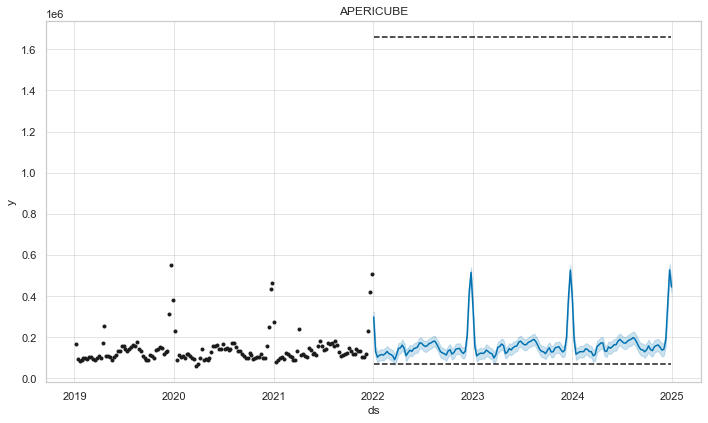

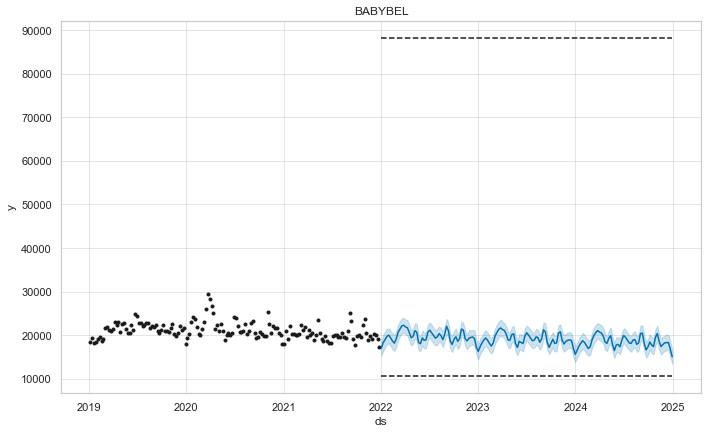

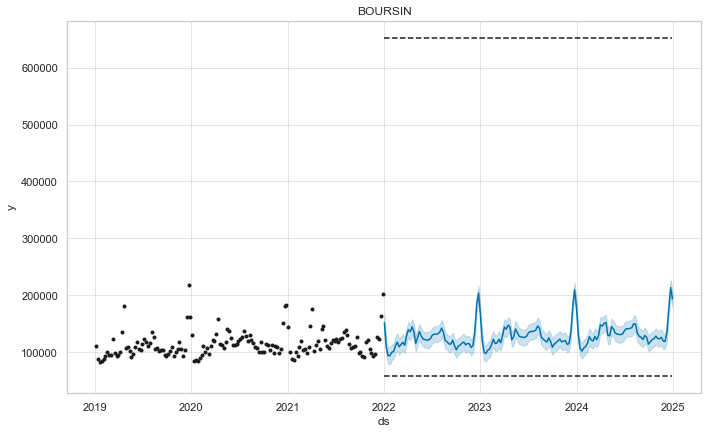

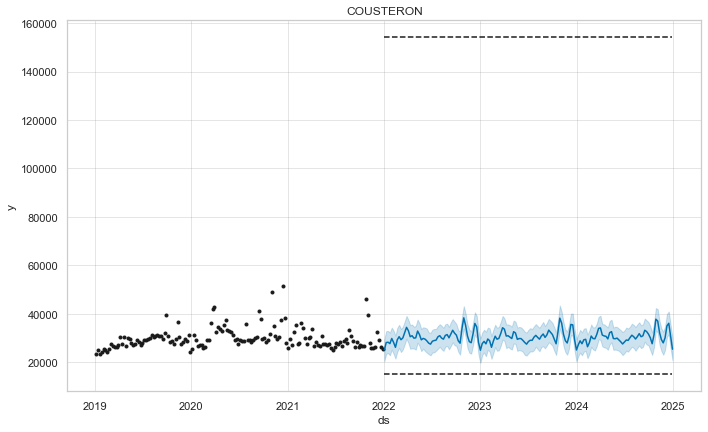

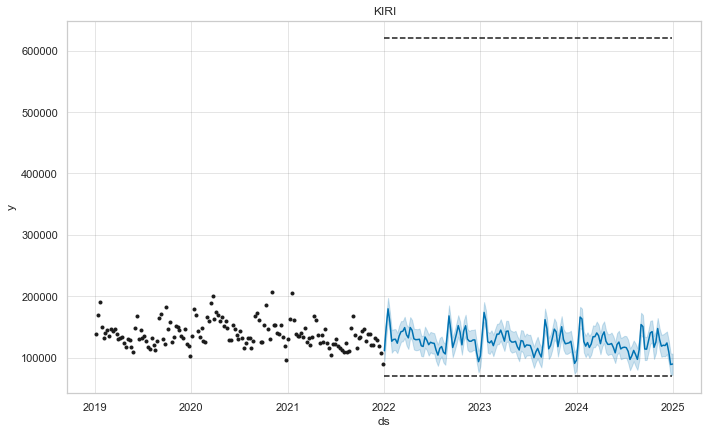

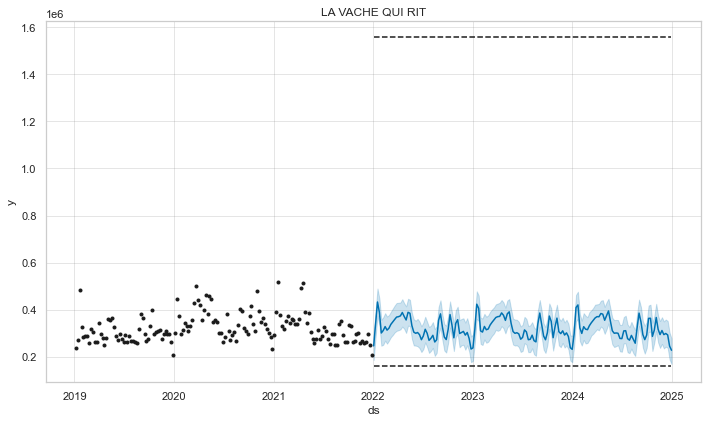

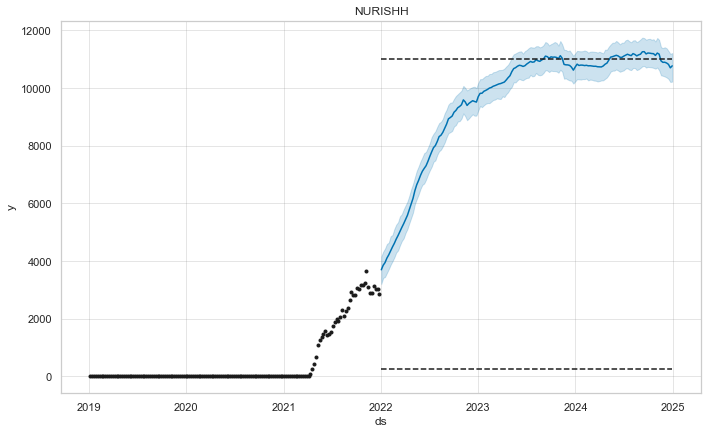

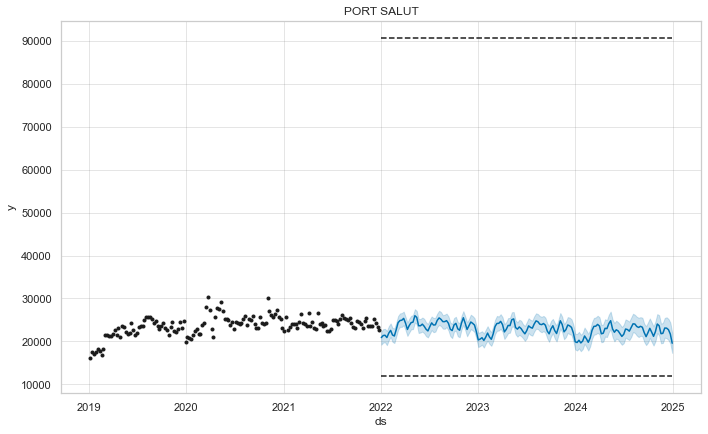

In [67]:
df_bel_brands = df_bel.groupby(["Date", "Brand"]).agg('sum')['Sales in volume'].unstack().reset_index()
df_bel_brands.columns.name=''
df_bel_brands = df_bel_brands.fillna(0)
df_bel_brands_fcst_res = forecasting_features(df_bel_brands, list(df_bel_brands.columns[1:]), periods=157, freq='W')

array([<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>,
       <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>],
      dtype=object)

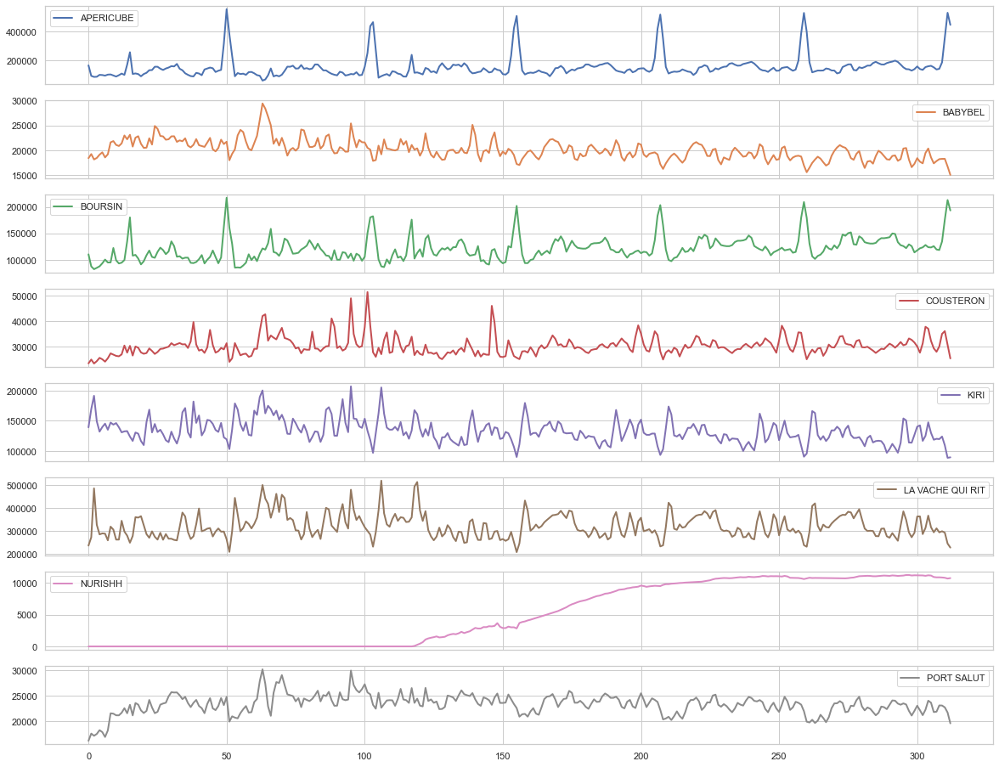

In [68]:
df_bel_brands_fcst_res.iloc[:, 1:].plot(subplots=True, linewidth=2, figsize=(20, 16))

In [71]:
#df_bel_brands_fcst_res['Date'] = df_bel_brands_fcst_res.Date.apply(lambda x: x.strftime('%Y-%m-%d'))
df_bel_brands_fcst_res.round(1).to_excel("results/FR/Total/fr_brands_forecasts_no_regressors.xlsx", index=False)

#### With Regressors

In [128]:
df_bel['Trends'] = df_bel.apply(lambda x: df_trends[df_trends.Date == x.Date][x.Brand].values[0], axis=1)
df_bel.fillna(0, inplace=True)
df_bel.head()

,Date,Brand,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation,Trends
0,2019-01-06,APERICUBE,13.533482,165895.416703,2.245143e+06,0.0,1.081436e+06,44.38528,74.99087,29844.0375,627333.873400,0.0,1
1,2019-01-06,BABYBEL,8.535930,18435.875528,1.573673e+05,0.0,1.508784e+06,683.15914,137.30146,205115.1500,806691.118450,0.0,6
2,2019-01-06,BOURSIN,18.296640,110294.990168,1.529467e+06,0.0,9.410844e+05,33.81879,133.43824,41814.2575,414141.127425,0.0,32
3,2019-01-06,COUSTERON,8.120451,23507.835993,1.908942e+05,0.0,1.393531e+05,0.00000,11.92763,2981.9075,24573.224600,0.0,0
4,2019-01-06,KIRI,9.480677,139262.367759,1.286720e+06,0.0,1.419914e+06,43.41143,123.65016,41765.3975,700810.716475,0.0,27


In [148]:
len(df[df.Brand == 'MINI BABYBEL'])

224

Brands:   0%|          | 0/8 [00:00<?, ?it/s]

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/c

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/c

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/c

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/c

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/c

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/prophet/plot.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
/U

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/c

Features:   0%|          | 0/3 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
INFO:prophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-v

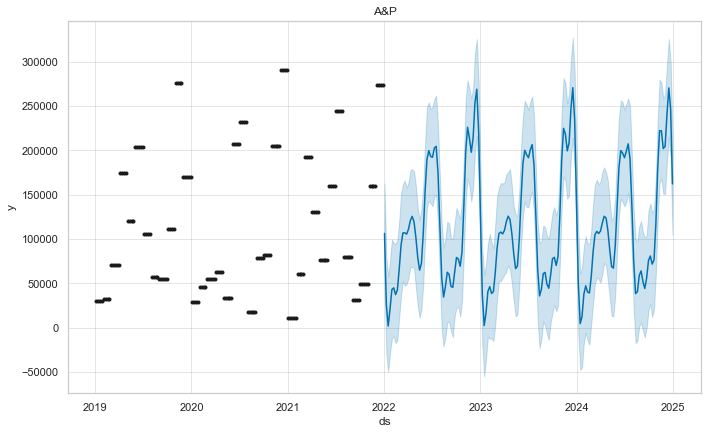

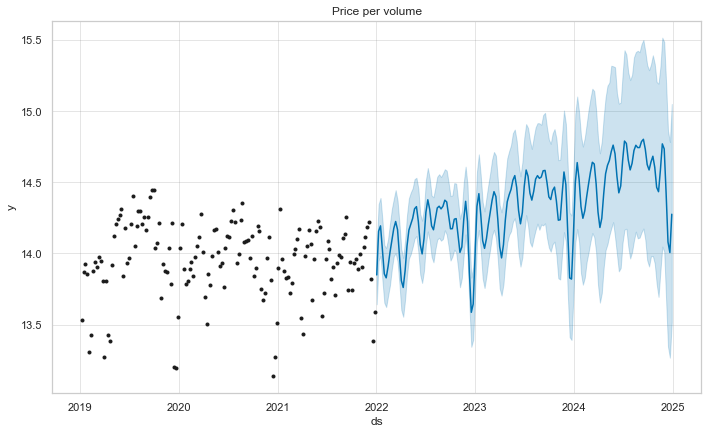

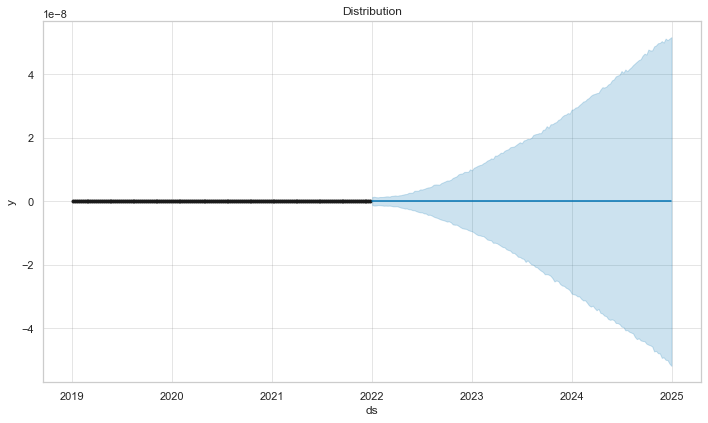

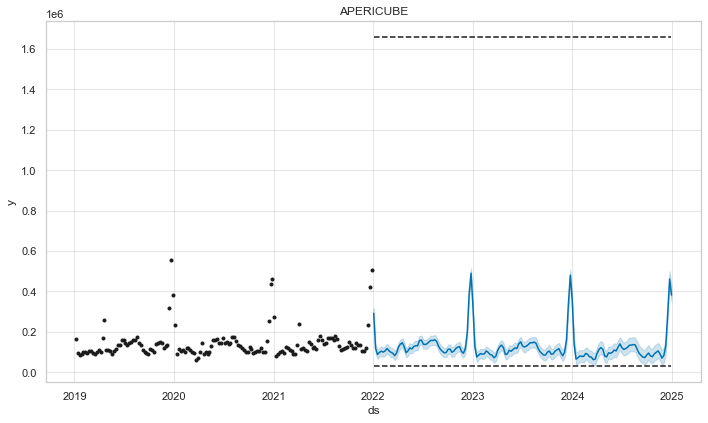

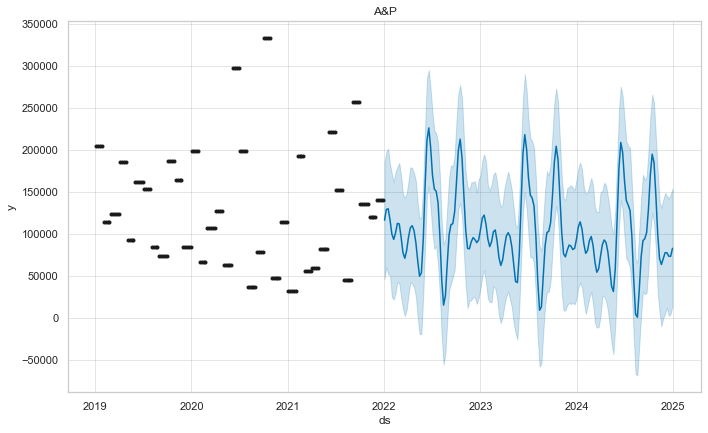

...

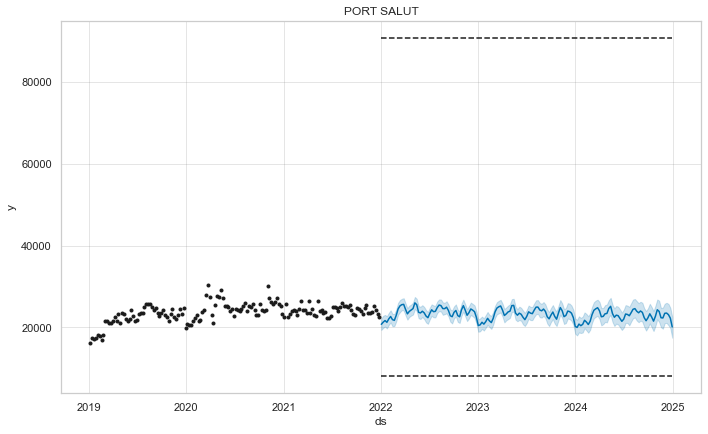

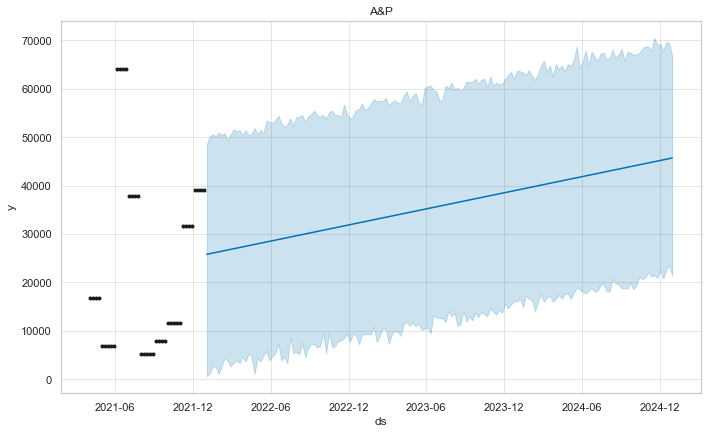

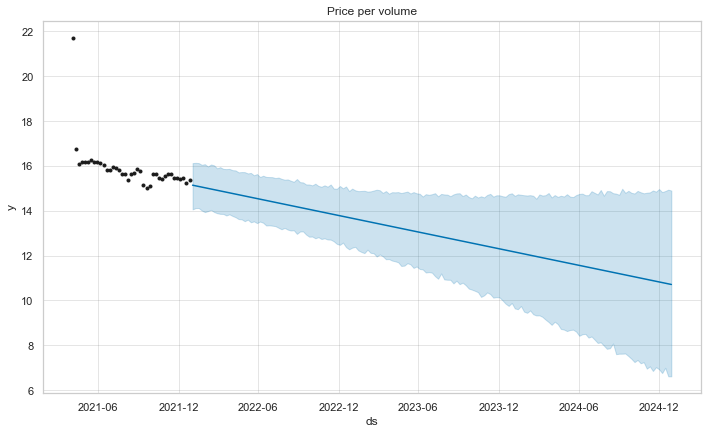

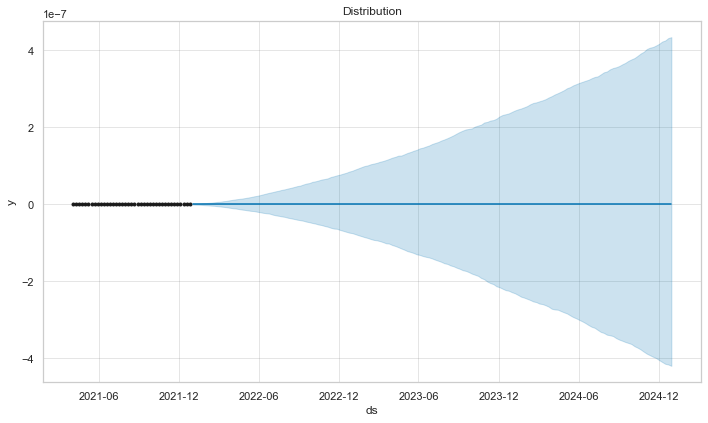

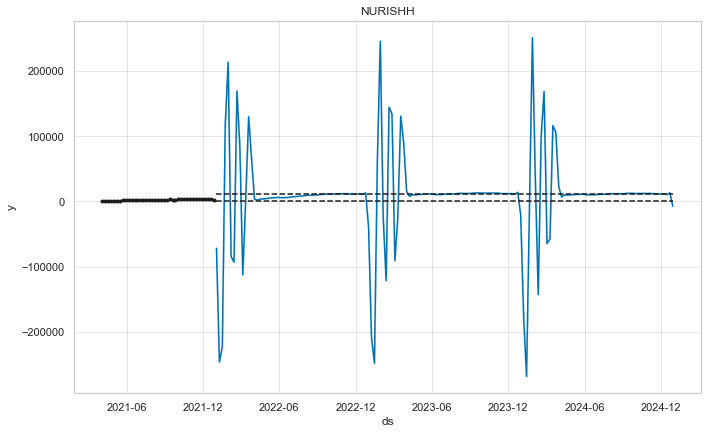

In [144]:
features_name = ['A&P', 'Price per volume', 'Distribution']
feats_futures, df_brands_fcst_res = forecasting_brands(df_bel, brands_name[country], features_name, periods=157, freq='W')

In [74]:
df_brands_fcst_res

,Date,APERICUBE,BABYBEL,BOURSIN,COUSTERON,KIRI,LA VACHE QUI RIT,PORT SALUT,NURISHH
0,2019-01-06,165895.416703,18435.875528,110294.990168,23507.835993,139262.367759,236481.533767,16128.250916,NaN
1,2019-01-13,93714.743126,19256.479512,87385.315619,24993.560975,169456.955499,272577.072802,17547.507697,NaN
2,2019-01-20,86603.443763,18175.219806,82147.332119,23443.667685,191452.678842,485696.621114,17112.409152,NaN
3,2019-01-27,87619.787558,18477.227870,84757.744591,24365.858082,149151.164486,327029.671582,17473.847500,NaN
4,2019-02-03,100687.339720,19136.625152,87601.144057,25663.377070,132094.456352,285222.196035,18221.954631,NaN
...,...,...,...,...,...,...,...,...,...
308,2024-12-01,82309.949389,17852.982242,132637.093137,16183.623800,117494.620033,252418.018251,23461.690059,11257.372925
309,2024-12-08,129412.290396,17956.089501,148748.889481,21502.323947,121673.115111,257125.107189,23518.354140,11519.697270
310,2024-12-15,287519.828044,18024.890175,191493.394170,20618.077130,106976.882973,252447.817045,23122.342026,10593.905445
311,2024-12-22,460750.287312,16445.947488,227931.703962,15832.259044,86378.790244,202083.234985,22283.155162,13077.495736


In [75]:
df_brands_fcst_res.fillna(0, inplace=True)
df_brands_fcst_res['Date'] = df_brands_fcst_res.Date.apply(lambda x: x.strftime('%Y-%m-%d'))
df_brands_fcst_res.round(1).to_excel("results/FR/Total/fr_brands_forecasts_with_regressors.xlsx", index=False)

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

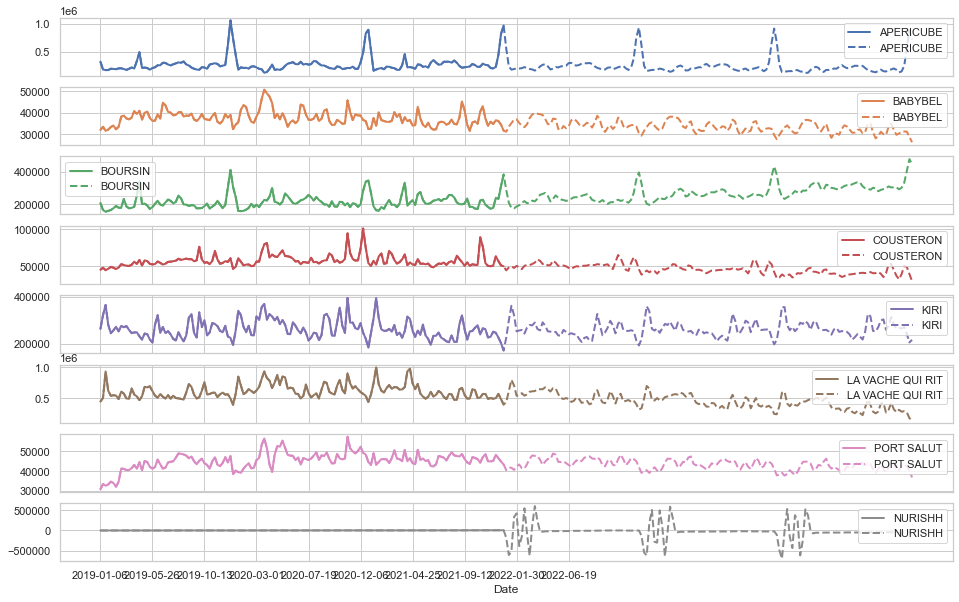

In [13]:
ax = df_brands_fcst_res.set_index("Date").loc['2017-12-31':'2021-12-26'].plot(linewidth=2, subplots=True, figsize=(16, 10))
df_brands_fcst_res.set_index("Date").plot(linewidth=2, linestyle='--', subplots=True, figsize=(16, 10), ax=ax)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

array([<AxesSubplot:xlabel='ds'>, <AxesSubplot:xlabel='ds'>,
       <AxesSubplot:xlabel='ds'>], dtype=object)

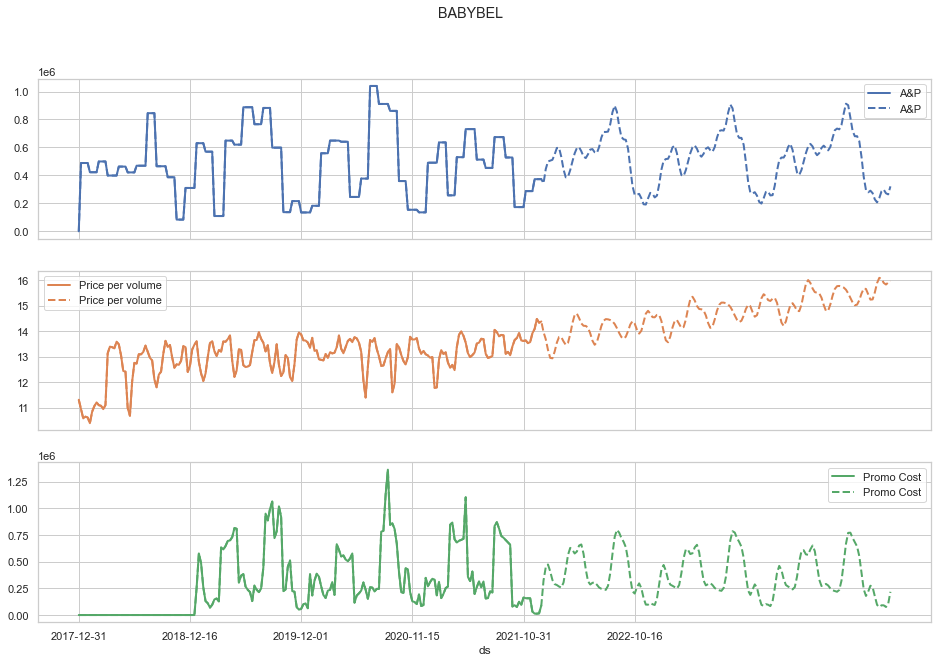

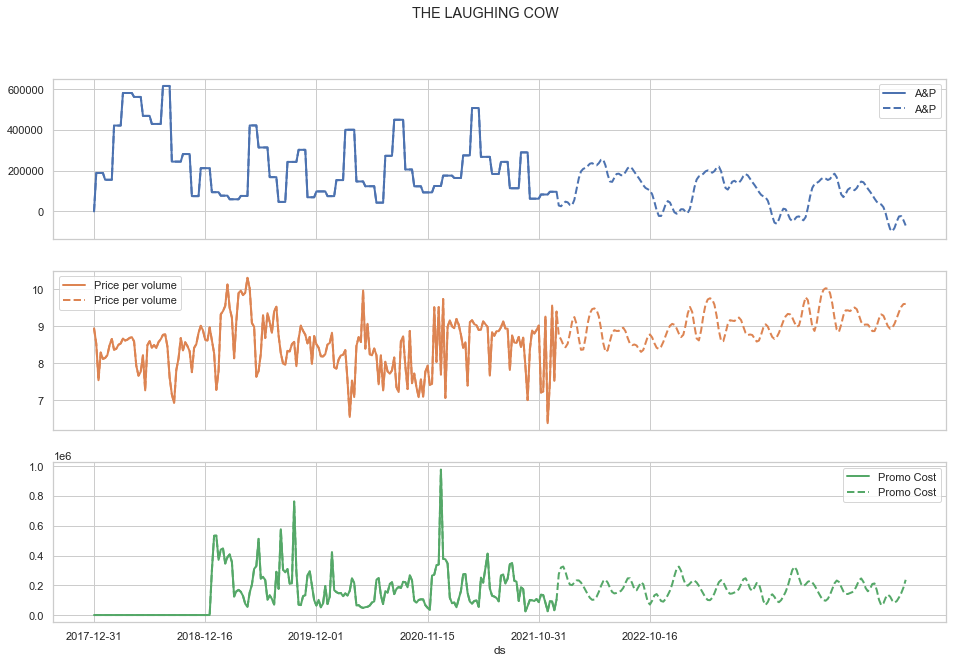

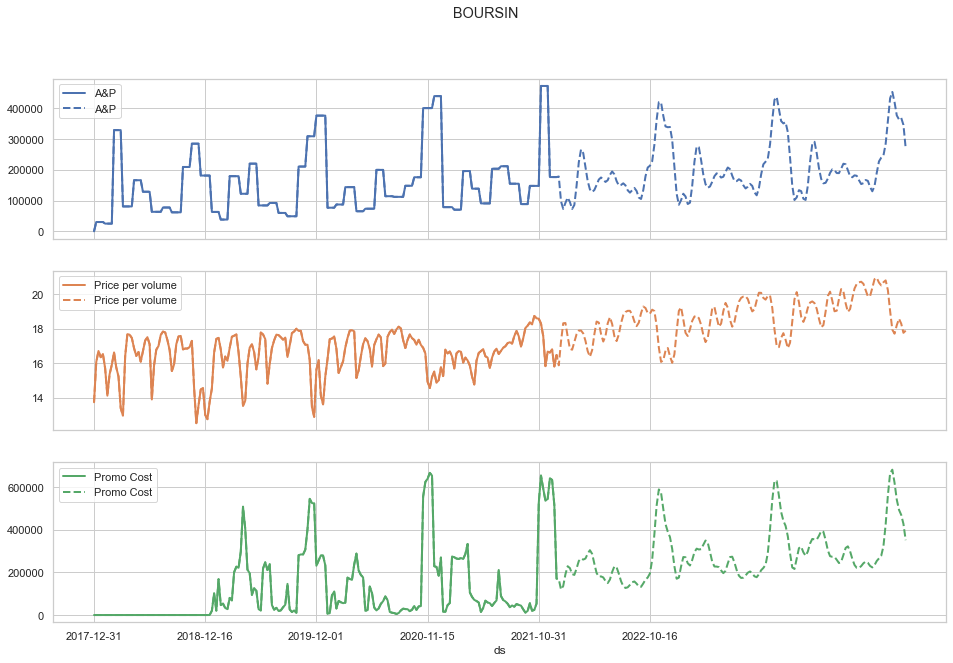

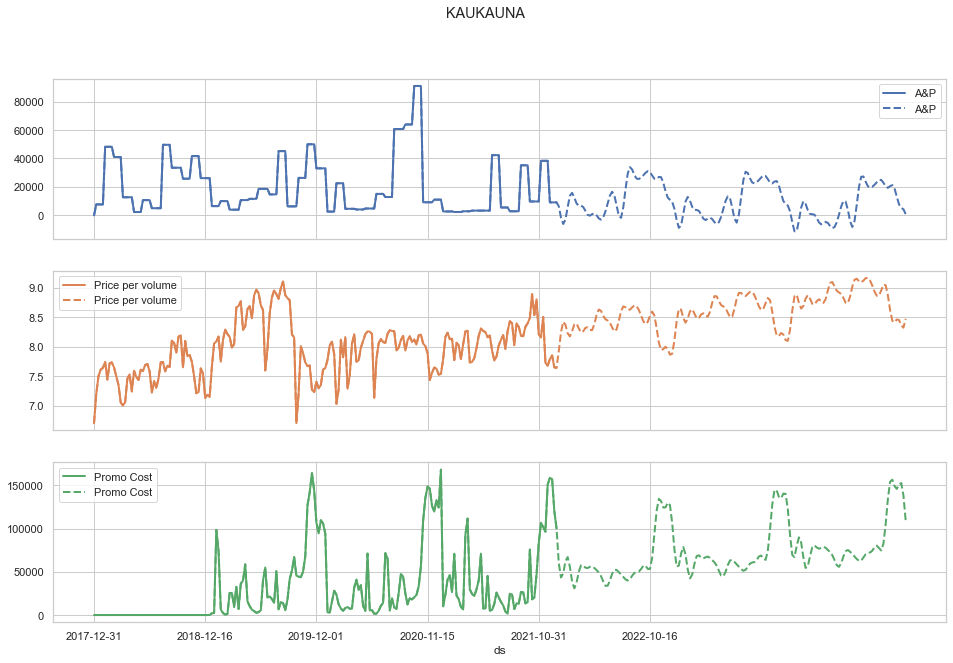

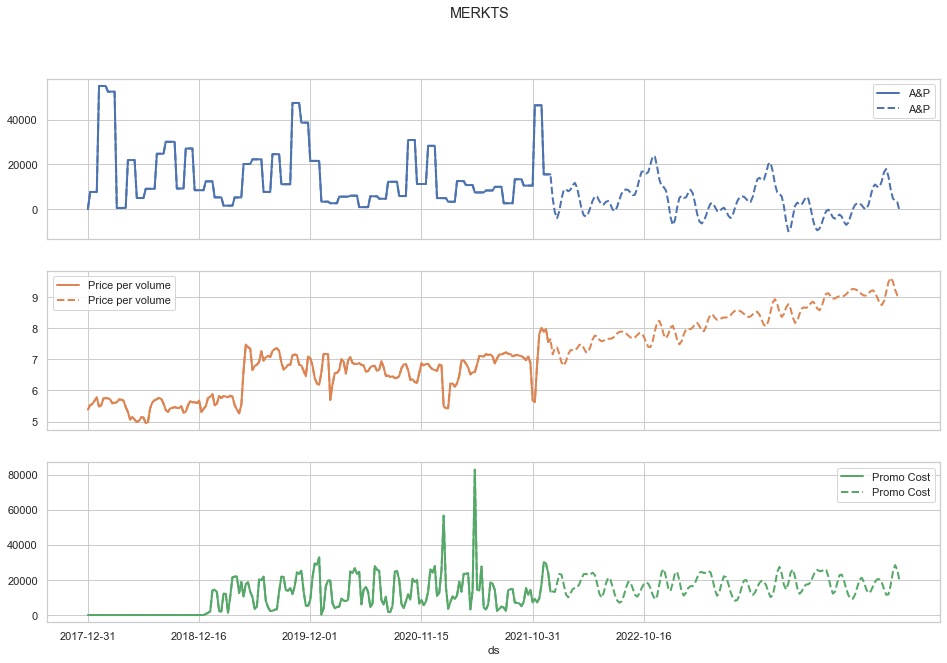

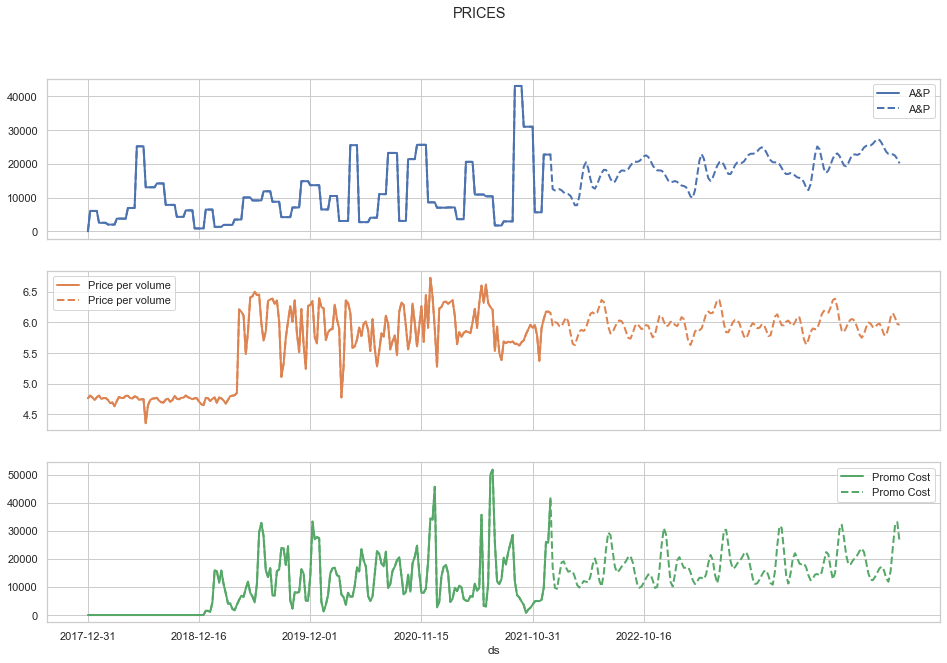

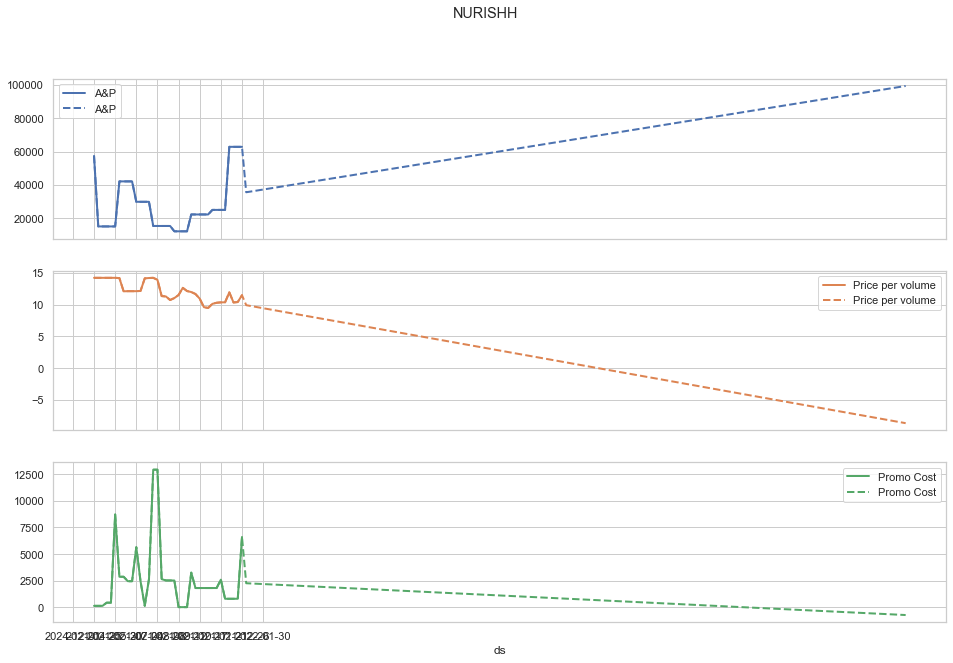

In [123]:
for brand in feats_futures:
    ax = feats_futures[brand].set_index('ds').loc['2017-12-31':'2021-12-26'].plot(subplots=True, figsize=(16, 10), title=brand, linewidth=2);
    feats_futures[brand].set_index('ds').plot(
        subplots=True, figsize=(16, 10), title=brand, 
        linestyle='--', linewidth=2, ax=ax);

### Forecasting Markets

In [87]:
features_markets = list(df.Category.unique()) + ['TOTAL CHEESE']
df_markets = get_df_markets(df)
df_markets.head()

,Date,A GOUT,A TARTINER,ALTERNATIVE VEGETALE,AOR REGIONAL,APERITIF,ARO,BLOC,BREBIS,CHEVRE,...,INGREDIENT A CHAUD,NATURE,NOMADE,ORIGINAL,PATE PERSILLEE,PLAT CHAUD,RAPE,SALADE,SPECIALITE A GOUT DOUX,TOTAL CHEESE
0,2019-01-06,203302.853925,441244.992199,1332.458261,582010.704672,240068.465427,320907.830862,1.194832e+06,127856.968448,826418.695645,...,435974.227858,345827.942658,191917.619359,144046.923255,350799.131039,1.730553e+06,2.726374e+06,432476.664024,600287.984803,1.294463e+07
1,2019-01-13,247975.679450,549683.147060,1463.171049,616166.174829,138150.230972,308390.722514,1.378545e+06,164445.895196,881293.027853,...,511498.226159,333463.224834,226400.464275,161749.353487,399767.418930,1.583934e+06,2.974129e+06,433343.786627,651801.979642,1.387064e+07
2,2019-01-20,225221.056430,745655.494316,1486.737421,643216.201937,126956.075384,319637.418947,1.509213e+06,141214.365665,944628.297521,...,481582.261260,378832.695887,210152.948001,169763.094474,414154.444761,1.516618e+06,2.762111e+06,450280.859241,767961.648248,1.416601e+07
3,2019-01-27,238290.592930,527404.043923,1459.173280,623148.391808,122723.116801,291666.496962,1.421608e+06,155021.775180,911167.787908,...,515373.832599,357591.459832,193668.075975,164892.198833,383642.880369,1.513235e+06,2.805321e+06,417062.991683,710546.767098,1.362777e+07
4,2019-02-03,239761.096086,498836.386791,1454.939759,614799.678812,134686.857516,313440.219710,1.477949e+06,156004.633032,926261.656490,...,508100.219729,343189.536415,209677.514839,182798.715100,417294.208565,1.498372e+06,3.034305e+06,433979.136701,679687.307265,1.396379e+07


Features:   0%|          | 0/21 [00:00<?, ?it/s]

/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inste

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Dat

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Dat

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/generic.py:5516: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[name] = value
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/ipykernel_launcher.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a Dat

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/prophet/plot.py:66: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(facecolor='w', figsize=figsize)
/Users/ahmed/miniconda/envs/pt/lib/python3.7/site-packages/pandas/core/frame.py:5047: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


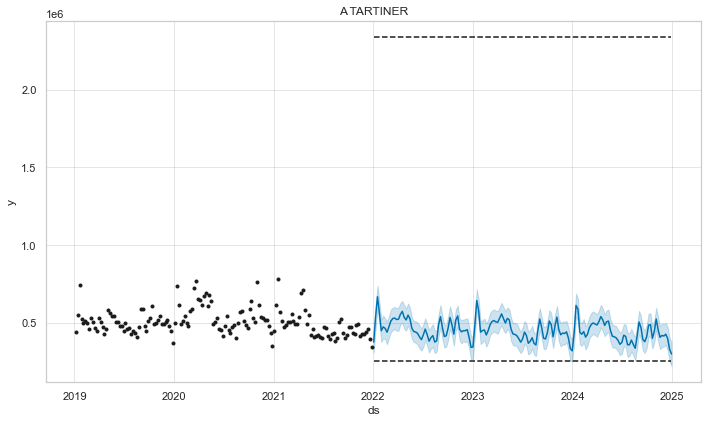

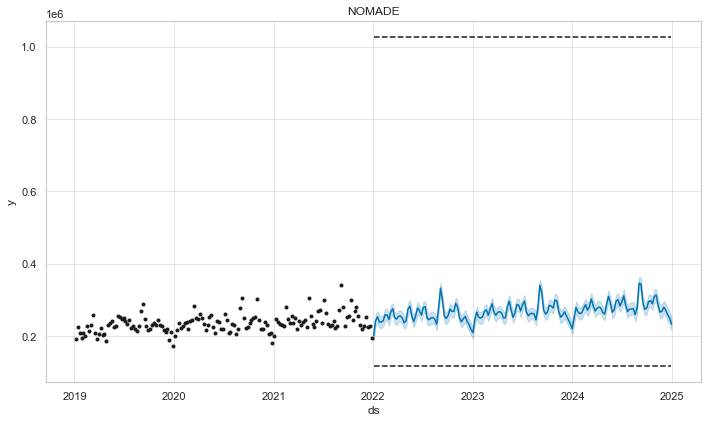

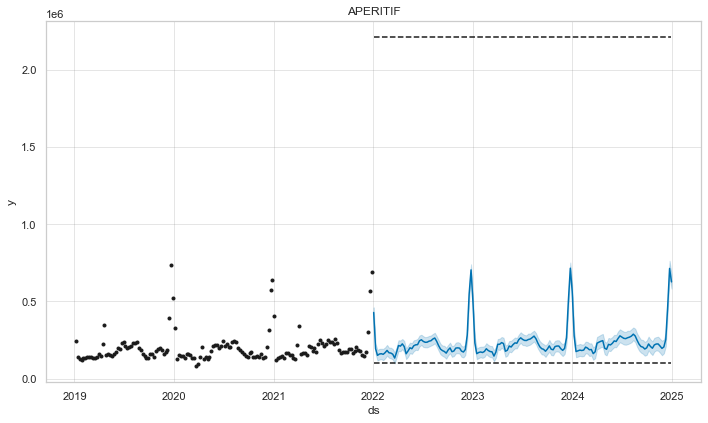

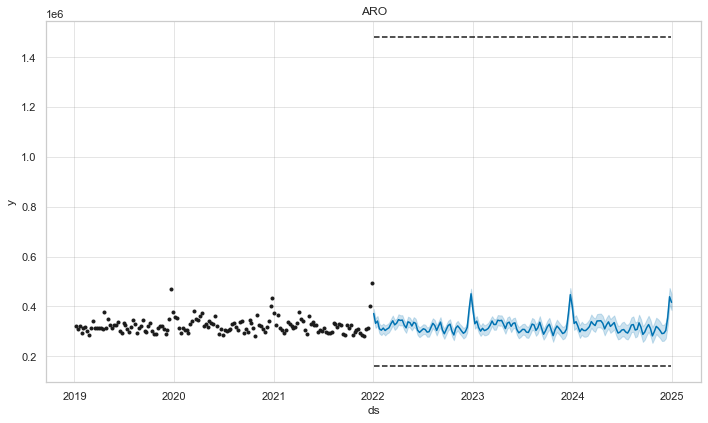

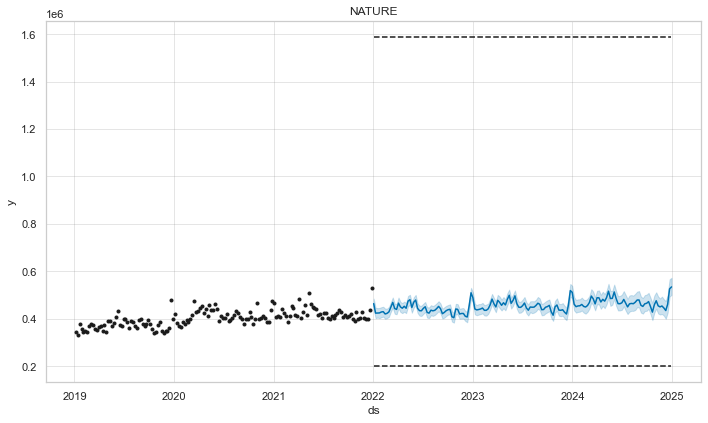

...

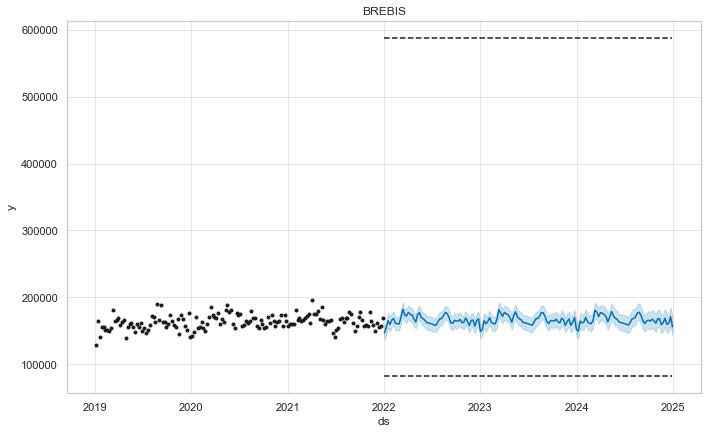

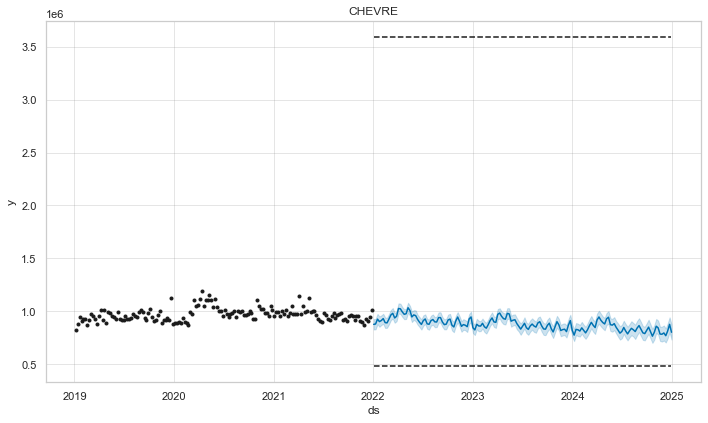

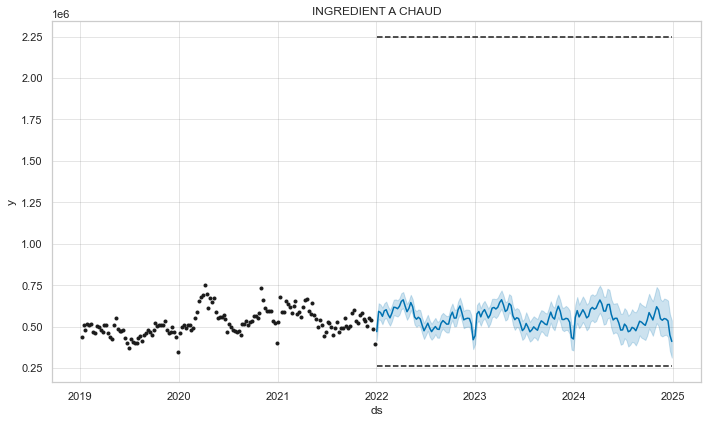

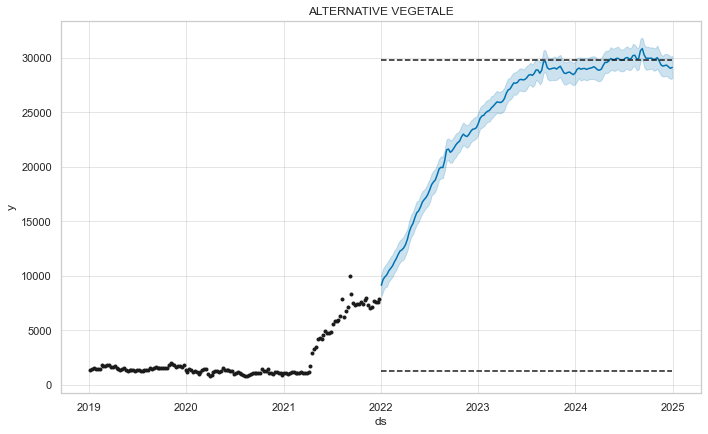

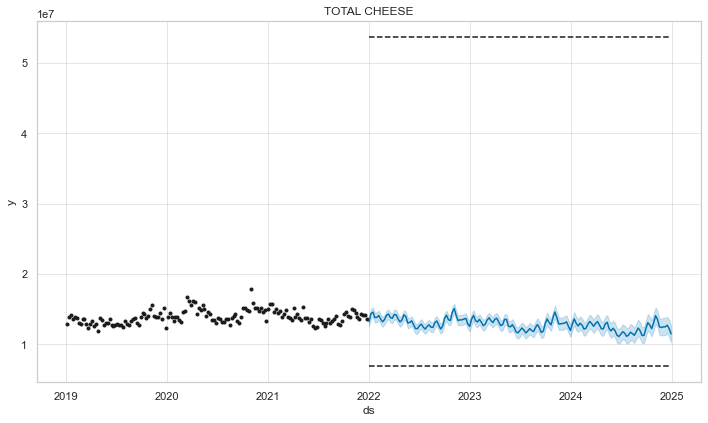

In [88]:
df_markets_fcst_res = forecasting_markets(df_markets, features_markets, periods=157, freq='W')

In [89]:
df_markets_fcst_res.tail()

,Date,A TARTINER,NOMADE,APERITIF,ARO,NATURE,RAPE,CHEVRE&BREBIS,A GOUT,ORIGINAL,...,BLOC,PATE PERSILLEE,CLASSIQUE,AOR REGIONAL,SPECIALITE A GOUT DOUX,BREBIS,CHEVRE,INGREDIENT A CHAUD,ALTERNATIVE VEGETALE,TOTAL CHEESE
308,2024-12-01,415709.406095,280430.076414,204569.665337,292506.944437,445877.655280,2.674858e+06,11730.184323,269326.104720,263113.059936,...,1.209450e+06,402761.062476,1.847961e+06,715985.657471,587668.743344,168459.157761,797349.990594,548419.705188,29309.340813,1.250094e+07
309,2024-12-08,427055.570129,271805.581627,253316.529973,303300.957660,435056.996141,2.669683e+06,11645.575053,276382.862068,262639.893598,...,1.211222e+06,415224.392112,1.781885e+06,707097.170914,602797.485889,159530.096849,771196.877187,545103.877029,29341.854162,1.250963e+07
310,2024-12-15,399258.796859,259339.298743,465416.795403,353594.651495,461765.212259,2.635089e+06,11302.530275,266177.997366,257794.759222,...,1.244247e+06,448372.787824,1.811374e+06,739733.653187,600048.498082,160847.552688,816236.224167,533878.337137,29198.705362,1.273806e+07
311,2024-12-22,329995.174409,250600.692632,712992.913065,438830.722827,526342.145903,2.298973e+06,10333.478629,217596.096617,229248.230871,...,1.170366e+06,473559.368760,1.709355e+06,817785.580009,611267.262196,170722.988423,878520.808825,449145.117740,29049.189641,1.225195e+07
312,2024-12-29,300514.214256,233459.957936,626124.423150,416436.782498,534698.728372,2.186723e+06,9521.599138,201643.408111,208825.190662,...,1.003888e+06,425073.252410,1.407112e+06,798561.145150,554656.722309,155887.291436,803885.685124,410238.044180,29134.661467,1.150556e+07


In [219]:
#df_markets_fcst_res.assign(Year=pd.to_datetime(df_markets_fcst_res.Date).dt.year).groupby('Year').sum().T.to_clipboard()

In [90]:
#df_markets_fcst_res['Date'] = df_markets_fcst_res.Date.apply(lambda x: x.strftime('%Y-%m-%d'))
df_markets_fcst_res.round(1).to_excel("./results/FR/Total/fr_markets_forecasts.xlsx", index=False)

### Growth Drivers Past

In [93]:
df.head()

,Date,Product,Category,Sub Category,Brand,Sales in value,Sales value with promo,Sales in volume,Sales volume with promo,Price with promo,Price without promo,Price per volume,Distribution,Channel
0,2021-12-26,KIRI AUTRE A TARTINER A TARTINER ENFANT,A TARTINER,A TARTINER,KIRI,1.395590e+04,NaN,994.580456,NaN,NaN,NaN,14.031951,NaN,Total GMS
1,2021-12-26,LA VACHE QUI RIT BOITE RONDE A TARTINER ENFANT,A TARTINER,A TARTINER,LA VACHE QUI RIT,1.215908e+06,NaN,148521.112927,NaN,NaN,NaN,8.186767,NaN,Total GMS
2,2021-12-26,LA BONNE VACHE BOITE RONDE A TARTINER ENFANT,A TARTINER,A TARTINER,LA BONNE VACHE,4.133446e+04,NaN,8547.703851,NaN,NaN,NaN,4.835738,NaN,Total GMS
3,2021-12-26,SAVENCIA AUTRES BOITE RONDE A TARTINER ENFANT,A TARTINER,A TARTINER,SAVENCIA AUTRES,5.900000e+01,NaN,3.920000,NaN,NaN,NaN,15.051020,NaN,Total GMS
4,2021-12-26,MDD BOITE RONDE A TARTINER ENFANT,A TARTINER,A TARTINER,MDD,3.534161e+05,NaN,67258.469221,NaN,NaN,NaN,5.254596,NaN,Total GMS


In [97]:
df_bel.head()

,Date,Brand,Price per volume,Sales in volume,Sales in value,Distribution,Sell-in,Advertising,Promotion,A&P,MVC,Rate of Innovation,Trends
0,2019-01-06,APERICUBE,13.533482,165895.416703,2.245143e+06,0.0,1.081436e+06,44.38528,74.99087,29844.0375,627333.873400,0.0,1
1,2019-01-06,BABYBEL,8.535930,18435.875528,1.573673e+05,0.0,1.508784e+06,683.15914,137.30146,205115.1500,806691.118450,0.0,6
2,2019-01-06,BOURSIN,18.296640,110294.990168,1.529467e+06,0.0,9.410844e+05,33.81879,133.43824,41814.2575,414141.127425,0.0,32
3,2019-01-06,COUSTERON,8.120451,23507.835993,1.908942e+05,0.0,1.393531e+05,0.00000,11.92763,2981.9075,24573.224600,0.0,0
4,2019-01-06,KIRI,9.480677,139262.367759,1.286720e+06,0.0,1.419914e+06,43.41143,123.65016,41765.3975,700810.716475,0.0,27


In [138]:
# Use this with controllable_features param to False
#bel_features = ['Date', 'Brand', 'A&P', 'Price per volume', 'Rate of Innovation', 'Distribution', 'Trends', 'Sales in volume']
# Use this with controllable_features param to True
bel_features = ['Date', 'Brand', 'A&P', 'Price per volume', 'Distribution', 'Sales in volume']
dict_res = compute_growth_drivers_past(
    df, df_bel[bel_features], brands_name[country], features, 
    years=[2019, 2020, 2021], controllable_features=True)

Years:   0%|          | 0/3 [00:00<?, ?it/s]

Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


In [139]:
for year in dict_res:
    pd.DataFrame(dict_res[year]['xgb_feature_importance']).round(1).to_excel("results/FR/Total/fr_growth_drivers_past_{}_controllable_features.xlsx".format(year))

### Growth Drivers Future

In [140]:
df_futures = pd.DataFrame()
for brand in feats_futures:
    feats_futures[brand]['ds'] = feats_futures[brand]['ds'].apply(lambda x: x.strftime("%Y-%m-%d"))
    df_tmp = pd.merge(feats_futures[brand].rename(columns={'ds':'Date'}), 
                     df_brands_fcst_res[['Date', brand]], on='Date').rename(
        columns={brand: 'Sales in volume'})
    df_tmp['Brand'] = brand
    df_futures = pd.concat([df_futures, df_tmp])

In [141]:
dict_res_future = compute_growth_drivers_past(
    df, df_futures[df_futures.Date > df_bel.Date.iloc[-1]][bel_features], brands_name[country], features, 
    years=[2022, 2023, 2024], controllable_features=True)

Years:   0%|          | 0/3 [00:00<?, ?it/s]

Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


Brands:   0%|          | 0/8 [00:00<?, ?it/s]

['A&P', 'Price per volume', 'Distribution']


In [142]:
for year in dict_res_future:
    pd.DataFrame(dict_res_future[year]['xgb_feature_importance']).round(1).to_excel("results/FR/Total/fr_growth_drivers_future_{}_controllable_features.xlsx".format(year))